In [95]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn as sk
import scipy as sp
import seaborn as sns
import statsmodels.api as sm
import statsmodels.imputation.mice as mice

from sklearn.svm import SVR,SVC
from sklearn.cluster import KMeans
from sklearn.preprocessing import Normalizer,MinMaxScaler,OneHotEncoder,StandardScaler,LabelEncoder
from sklearn.model_selection import KFold,StratifiedKFold,cross_val_score,GridSearchCV,train_test_split
from sklearn.feature_selection import VarianceThreshold,SelectKBest,SelectPercentile,GenericUnivariateSelect,chi2
from sklearn.feature_selection import SelectKBest, f_classif,mutual_info_classif,f_regression,RFECV,RFE
from sklearn.ensemble import RandomForestRegressor,GradientBoostingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error,mean_squared_error
from sklearn.impute import SimpleImputer,KNNImputer
from scipy import stats

%matplotlib inline

In [2]:
Train=pd.read_csv('Downloads/train_house.csv',index_col=0)
Test=pd.read_csv('Downloads/test.csv',index_col=0)
print('Train shape is',Train.shape, 'and Test shape is', Test.shape)

Train shape is (1460, 80) and Test shape is (1459, 79)


In [3]:
Saved_Merge='Merged_'+input('Please enter the Merged file name for records: ')
print('The name of saved mered file will be: ',Saved_Merge)

Please enter the Merged file name for records: First
The name of saved mered file will be:  Merged_First


In [4]:
Train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [5]:
Train_no_sales=Train.drop(columns=['SalePrice'])
Merged=pd.concat([Train_no_sales,Test],ignore_index=False,sort=False)
Merged.shape

(2919, 79)

Important functions for future

In [6]:
def categorical_study_graph(Variable):

    fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2,2,figsize=(15, 10))
    sns.barplot(x=Variable, y='SalePrice',capsize=0.5, data=Train,ax=ax1)
    sns.boxplot(x=Variable,y='SalePrice',data=Train,ax=ax2)
    sns.swarmplot(x=Variable,y='SalePrice',data=Train,ax=ax2)
    sns.countplot(x=Variable,data=Train,ax=ax3)
    sns.violinplot(x=Variable,y='SalePrice',scale="count",data=Train,ax=ax4)
    plt.show()
    Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean','std','median','count']).sort_values(['mean','count'],ascending=False)
    print(Variable_df)
    return Variable_df

In [7]:
def mapper(Variable,The_map):
    Train[Variable]=Train[Variable].map(The_map)
    Test[Variable]=Test[Variable].map(The_map)
    Merged[Variable]=Merged[Variable].map(The_map)

In [8]:
def reverser(Variable_R):
    Train[Variable_R]=Train_Copy[Variable_R]
    Test[Variable_R]=Test_Copy[Variable_R]
    Merged[Variable_R]=Merged_Copy[Variable_R]

In [9]:
def catergorical_name_transformer(Variable,new_name_initials):
    Keys=list(Merged[Variable].unique())
    L=len(list(Merged[Variable].unique()))
    Values=[new_name_initials+str(i) for i in range(L)]
    Map=dict(zip(Keys,Values))
    mapper(Variable,Map)

In [10]:
def Remove_MergedTest_NotInTrain(Variable):
    Merged_element=Merged[Variable].unique()
    Train_element=Train[Variable].unique()
    Not_In_Train=[i for i in Merged_element if i not in Train_element]
    L_Not_In_Train=len(Not_In_Train)
    Top_Train_Elements=list(Train.groupby(Variable)['SalePrice'].count().sort_values()[:L_Not_In_Train].index)
    Replacement_dict=dict(zip(Not_In_Train,Top_Train_Elements))
    for i,j in Replacement_dict.items():
        Test[Variable]=Test[Variable].replace(to_replace=i, value=j)
        Merged[Variable]=Merged[Variable].replace(to_replace=i, value=j)
        print('Due to absense of'+str(i)+' in Train DataFrame, it was replaced with '+str(j))

In [11]:
def convert_nom_to_num(Variable):
    The_map=dict(zip(['TA', 'Gd', 'Fa', 'Po', 'Ex'],[0.5,0,-0.5,-1,1]))
    mapper(Variable,The_map)
    Train[Variable]=pd.to_numeric(Train[Variable],errors='coerce')
    Test[Variable]=pd.to_numeric(Test[Variable],errors='coerce')
    Merged[Variable]=pd.to_numeric(Merged[Variable],errors='coerce')

In [12]:
def Categorical_Dimension_reducer(Variable):
    
    if len(Merged[Variable].unique())!=len(Train[Variable].unique()):
        Remove_MergedTest_NotInTrain(Variable)
    if any([str(i)[0].isdigit() for i in list(Train[Variable].unique())]):
        new_name_initials=input('The categorical variables started with integers. Enter non digit initials ending with _  ')
        catergorical_name_transformer(Variable,new_name_initials)
        
    Variable_df=categorical_study_graph(Variable)
    Original_indexes=Variable_df.index
    Variable_df.insert(loc=0,column='New',value=Original_indexes)
    Variable_df.insert(loc=0,column='Original',value=Original_indexes)
    Variable_df=Variable_df.reset_index(drop=True)
    Variable_df.index.name='Index'

    L=len(list(Variable_df.index))
    counter=0
    Flag=False
    print(Variable_df)
    while Flag==False and counter<(2*L):
        counter+=1
        To_Change_row = int(input("New Index (to be changed) -1 to exit:  "))
        if To_Change_row>L or To_Change_row<-1:
            print('Wrong key pressed')
        elif To_Change_row==-1:
            Flag=True   
        else:
            Flag1=False
            counter1=0
            while Flag1==False and counter1<3:
                counter1+=1
                String=str(Variable_df.loc[To_Change_row,'New'])
                Sub = int(input("Replace "+String+" in New-column with ... from Original Index or -1:  "))
                if Sub>L or Sub<-1:
                    print('Wrong key pressed')
                elif Sub in range(L):
                    Variable_df.loc[To_Change_row,'New']=Variable_df.loc[Sub,'Original']
                    Flag1=True
                    print(Variable_df)
                elif Sub==-1:
                    Flag1=True
    print('The final version is:')
    print(Variable_df)
    print()
    The_map=dict(zip(list(Variable_df.Original),list(Variable_df.New)))
    print('The map dictionary is:')
    print(The_map)
    print()
    Train[Variable]=Train[Variable].map(The_map)
    Test[Variable]=Test[Variable].map(The_map)
    Merged[Variable]=Merged[Variable].map(The_map)
    print('The final graph is:')
    Variable_df=categorical_study_graph(Variable)
    print()
    print('Do you want to save the updates on a file on your drive?')
    Save=bool(int(input('if so, enter 1, otherwise enter 0: ')))
    if Save==True:
        Merged.to_csv(Saved_Merge)
        print('Your file name is: ',Saved_Merge)
    
    return Variable_df

In [13]:
def rem_excess_cat_el_w_diag(Variable):
    if len(Merged[Variable].unique())!=len(Train[Variable].unique()):
        Remove_MergedTest_NotInTrain(Variable)
    if any([str(i)[0].isdigit() for i in list(Train[Variable].unique())]):
        new_name_initials=input('The categorical variables started with integers. Enter non digit initials ending with _  ')
        catergorical_name_transformer(Variable,new_name_initials)
    Variable_df=categorical_study_graph(Variable)
    Original_indexes=Variable_df.index
    Variable_df.insert(loc=0,column='New',value=Original_indexes)
    Variable_df=Variable_df.reset_index(drop=True)
    Variable_df.index.name='Index'

    Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(0))
    count_min_thresh=25
    Index_count_min=Variable_df['count'].idxmin()
    count_min=Variable_df.loc[Index_count_min,'count']

    while count_min<count_min_thresh:

        if Index_count_min==0:
            Index_to_merge=1
        elif Index_count_min==len(Variable_df.index)-1:
            Index_to_merge=len(Variable_df.index)-2
        else:
            Index_count_min_1=Index_count_min+1
            if Variable_df.loc[Index_count_min,'From_Top']>=Variable_df.loc[Index_count_min+1,'From_Top']:
                Index_to_merge=Index_count_min+1
            else:
                Index_to_merge=Index_count_min-1

        to_replace=Variable_df.loc[Index_count_min,'New']
        replacer=Variable_df.loc[Index_to_merge,'New']
    
        Train[Variable]=Train[Variable].replace(to_replace=to_replace, value=replacer)
        Test[Variable]=Test[Variable].replace(to_replace=to_replace, value=replacer)
        Merged[Variable]=Merged[Variable].replace(to_replace=to_replace, value=replacer)
        Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean','count']).sort_values(['mean','count'],ascending=False)
        Original_indexes=Variable_df.index
        Variable_df.insert(loc=0,column='New',value=Original_indexes)
        Variable_df=Variable_df.reset_index(drop=True)
        Variable_df.index.name='Index'
        Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(0))
    
        Index_count_min=Variable_df['count'].idxmin()
        count_min=Variable_df.loc[Index_count_min,'count']
    
    print('After minimum count fixing, the final graph is:')
    Variable_df=categorical_study_graph(Variable)

    Original_indexes=Variable_df.index
    Variable_df.insert(loc=0,column='New',value=Original_indexes)
    Variable_df=Variable_df.reset_index(drop=True)
    Variable_df.index.name='Index'

    diff_thresh=1000
    Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(diff_thresh+1))

    Index_diff=Variable_df['From_Top'].idxmin()
    diff_min=Variable_df.loc[Index_diff,'From_Top']

    while (diff_min<diff_thresh):

        to_replace=Variable_df.loc[Index_diff,'New']
        replacer=Variable_df.loc[Index_diff-1,'New']
    
        Train[Variable]=Train[Variable].replace(to_replace=to_replace, value=replacer)
        Test[Variable]=Test[Variable].replace(to_replace=to_replace, value=replacer)
        Merged[Variable]=Merged[Variable].replace(to_replace=to_replace, value=replacer)
        Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean']).sort_values(['mean'],ascending=False)
        Original_indexes=Variable_df.index
        Variable_df.insert(loc=0,column='New',value=Original_indexes)
        Variable_df=Variable_df.reset_index(drop=True)
        Variable_df.index.name='Index'
        Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(diff_thresh+1))
    
        Index_diff_min=Variable_df['From_Top'].idxmin()
        diff_min=Variable_df.loc[Index_diff_min,'From_Top']
    
    print('After minimum count fixing, the final graph is:')
    Variable_df=categorical_study_graph(Variable)

In [14]:
def rem_excess_cat_el_w_O_diag(Variable):
    if len(Merged[Variable].unique())!=len(Train[Variable].unique()):
        Remove_MergedTest_NotInTrain(Variable)
    if any([str(i)[0].isdigit() for i in list(Train[Variable].unique())]):
        new_name_initials=input('The categorical variables started with integers. Enter non digit initials ending with _  ')
        catergorical_name_transformer(Variable,new_name_initials)
    Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean','count']).sort_values(['mean','count'],ascending=False)
    Original_indexes=Variable_df.index
    Variable_df.insert(loc=0,column='New',value=Original_indexes)
    Variable_df=Variable_df.reset_index(drop=True)
    Variable_df.index.name='Index'

    Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(0))
    count_min_thresh=25
    Index_count_min=Variable_df['count'].idxmin()
    count_min=Variable_df.loc[Index_count_min,'count']

    while count_min<count_min_thresh:

        if Index_count_min==0:
            Index_to_merge=1
        elif Index_count_min==len(Variable_df.index)-1:
            Index_to_merge=len(Variable_df.index)-2
        else:
            Index_count_min_1=Index_count_min+1
            if Variable_df.loc[Index_count_min,'From_Top']>=Variable_df.loc[Index_count_min+1,'From_Top']:
                Index_to_merge=Index_count_min+1
            else:
                Index_to_merge=Index_count_min-1

        to_replace=Variable_df.loc[Index_count_min,'New']
        replacer=Variable_df.loc[Index_to_merge,'New']
    
        Train[Variable]=Train[Variable].replace(to_replace=to_replace, value=replacer)
        Test[Variable]=Test[Variable].replace(to_replace=to_replace, value=replacer)
        Merged[Variable]=Merged[Variable].replace(to_replace=to_replace, value=replacer)
        Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean','count']).sort_values(['mean','count'],ascending=False)
        Original_indexes=Variable_df.index
        Variable_df.insert(loc=0,column='New',value=Original_indexes)
        Variable_df=Variable_df.reset_index(drop=True)
        Variable_df.index.name='Index'
        Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(0))
    
        Index_count_min=Variable_df['count'].idxmin()
        count_min=Variable_df.loc[Index_count_min,'count']
    
    Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean']).sort_values(['mean'],ascending=False)
    Original_indexes=Variable_df.index
    Variable_df.insert(loc=0,column='New',value=Original_indexes)
    Variable_df=Variable_df.reset_index(drop=True)
    Variable_df.index.name='Index'

    diff_thresh=1000
    Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(diff_thresh+1))

    Index_diff=Variable_df['From_Top'].idxmin()
    diff_min=Variable_df.loc[Index_diff,'From_Top']

    while (diff_min<diff_thresh):

        to_replace=Variable_df.loc[Index_diff,'New']
        replacer=Variable_df.loc[Index_diff-1,'New']
    
        Train[Variable]=Train[Variable].replace(to_replace=to_replace, value=replacer)
        Test[Variable]=Test[Variable].replace(to_replace=to_replace, value=replacer)
        Merged[Variable]=Merged[Variable].replace(to_replace=to_replace, value=replacer)
        Variable_df=Train.groupby(Variable)['SalePrice'].agg(['mean']).sort_values(['mean'],ascending=False)
        Original_indexes=Variable_df.index
        Variable_df.insert(loc=0,column='New',value=Original_indexes)
        Variable_df=Variable_df.reset_index(drop=True)
        Variable_df.index.name='Index'
        Variable_df['From_Top']=abs(Variable_df['mean'].diff(periods=1).fillna(diff_thresh+1))
    
        Index_diff_min=Variable_df['From_Top'].idxmin()
        diff_min=Variable_df.loc[Index_diff_min,'From_Top']

In [15]:
isna=Merged.isna().sum()
Merged_missing=isna[isna!=0]

In [16]:
Merged_missing

MSZoning           4
LotFrontage      486
Alley           2721
Utilities          2
Exterior1st        1
Exterior2nd        1
MasVnrType        24
MasVnrArea        23
BsmtQual          81
BsmtCond          82
BsmtExposure      82
BsmtFinType1      79
BsmtFinSF1         1
BsmtFinType2      80
BsmtFinSF2         1
BsmtUnfSF          1
TotalBsmtSF        1
Electrical         1
BsmtFullBath       2
BsmtHalfBath       2
KitchenQual        1
Functional         2
FireplaceQu     1420
GarageType       157
GarageYrBlt      159
GarageFinish     159
GarageCars         1
GarageArea         1
GarageQual       159
GarageCond       159
PoolQC          2909
Fence           2348
MiscFeature     2814
SaleType           1
dtype: int64

In [17]:
TooManyMissing=list(Merged_missing[Merged_missing>1000].index)
print(TooManyMissing)

['Alley', 'FireplaceQu', 'PoolQC', 'Fence', 'MiscFeature']


In [18]:
Train=Train.drop(TooManyMissing,axis='columns')
Test=Test.drop(TooManyMissing,axis='columns')
Merged=Merged.drop(TooManyMissing,axis='columns')
Train_no_sales=Train_no_sales.drop(TooManyMissing,axis='columns')
Train_Copy=Train.copy()
Test_Copy=Test.copy()
Merged_Copy=Merged.copy()

In [19]:
Train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,0,0,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,272,0,0,0,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,0,0,0,12,2008,WD,Normal,250000


In [20]:
CatCol=list(Train.select_dtypes(include='object').columns)
ConCol=list(Train.select_dtypes(exclude='object').columns)
ConCol_=list(Train.select_dtypes(exclude='object').columns)
ConCol.remove('SalePrice')

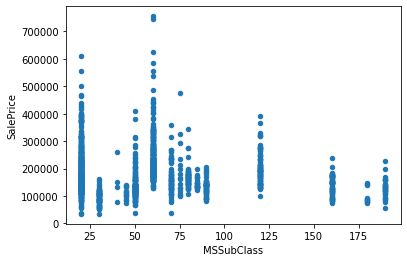

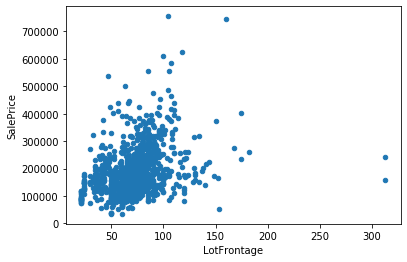

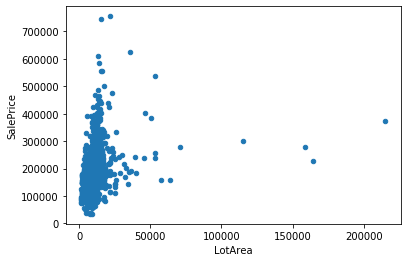

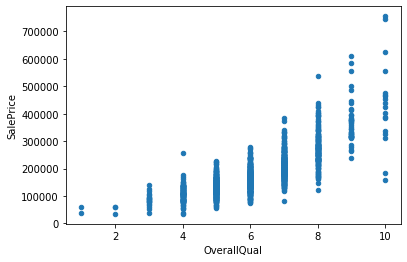

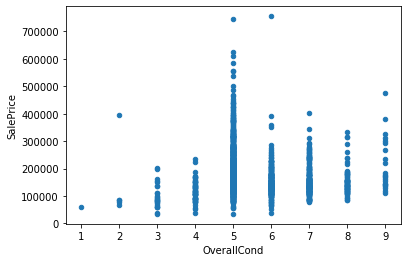

...

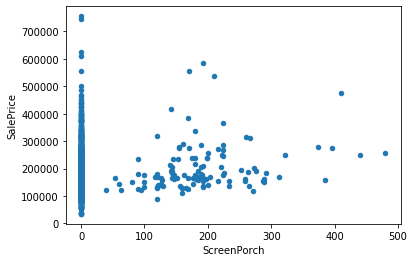

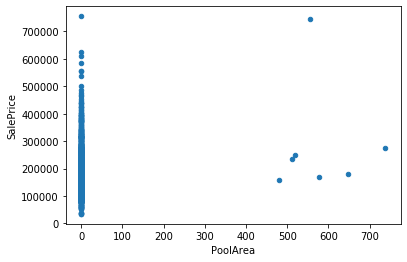

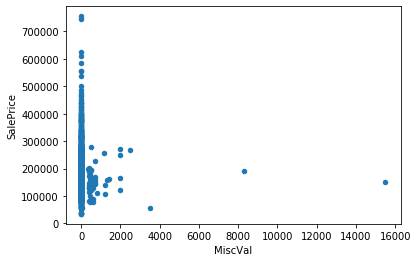

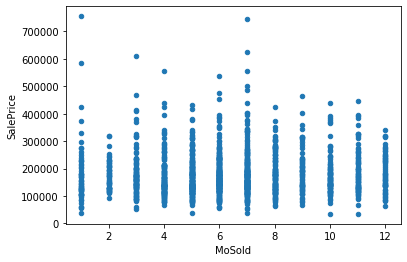

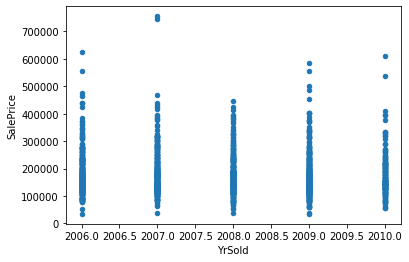

In [21]:
for column in ConCol:
    Train.plot(x=column,y='SalePrice',kind='scatter')
    plt.show()

In [22]:
To_drop_list=['BsmtFinSF2','LowQualFinSF','3SsnPorch','PoolArea','MiscVal']

In [23]:
Train=Train.drop(To_drop_list,axis='columns')
Test=Test.drop(To_drop_list,axis='columns')
Merged=Merged.drop(To_drop_list,axis='columns')
Train_no_sales=Train_no_sales.drop(To_drop_list,axis='columns')
Train_Copy=Train.copy()
Test_Copy=Test.copy()
Merged_Copy=Merged.copy()

In [24]:
ConCol=list(Train.select_dtypes(exclude='object').columns)
ConCol_=list(Train.select_dtypes(exclude='object').columns)
ConCol.remove('SalePrice')

In [25]:
Train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,ScreenPorch,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Id,,,,,,,,,,,,,,,,,,,,,
1,60,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,Y,0,61,0,0,2,2008,WD,Normal,208500
2,20,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,Y,298,0,0,0,5,2007,WD,Normal,181500
3,60,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,Y,0,42,0,0,9,2008,WD,Normal,223500
4,70,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,Y,0,35,272,0,2,2006,WD,Abnorml,140000
5,60,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,Y,192,84,0,0,12,2008,WD,Normal,250000


In [26]:
print(CatCol)

['MSZoning', 'Street', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


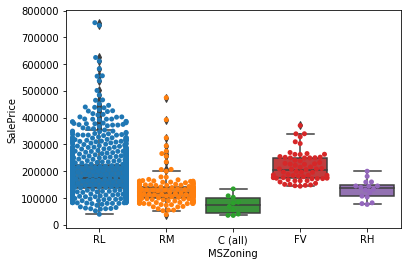

                   mean           std  median  count
MSZoning                                            
FV        214014.061538  52369.662067  205950     65
RL        191004.994787  80766.341319  174000   1151
RH        131558.375000  35714.118435  136500     16
RM        126316.830275  48521.689833  120500    218
C (all)    74528.000000  33791.092031   74700     10


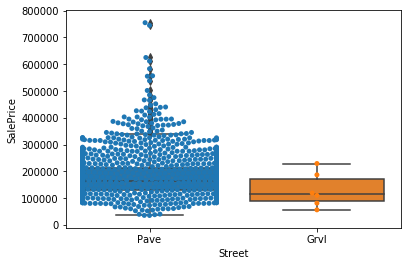

                 mean           std  median  count
Street                                            
Pave    181130.538514  79446.597317  163000   1454
Grvl    130190.500000  65446.253991  114250      6


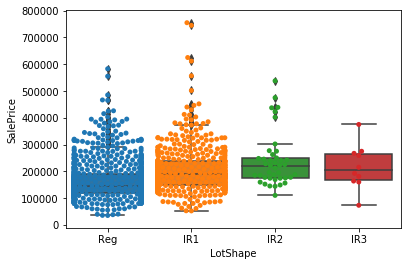

                   mean           std  median  count
LotShape                                            
IR2       239833.365854  99669.427362  221000     41
IR3       216036.500000  82540.334855  203570     10
IR1       206101.665289  85858.489559  189000    484
Reg       164754.818378  69673.427215  146000    925


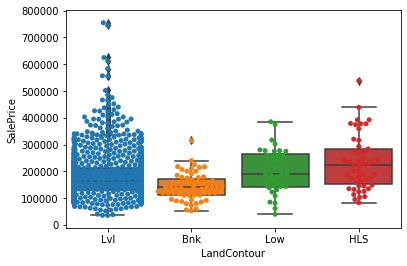

                      mean            std  median  count
LandContour                                             
HLS          231533.940000  101790.139741  222250     50
Low          203661.111111   83935.353620  190000     36
Lvl          180183.746758   78463.567918  162900   1311
Bnk          143104.079365   49361.244074  139400     63


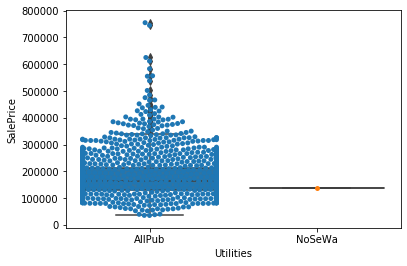

                   mean           std  median  count
Utilities                                           
AllPub     180950.95682  79461.599814  163000   1459
NoSeWa     137500.00000           NaN  137500      1


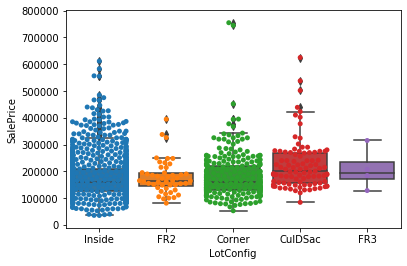

                    mean           std    median  count
LotConfig                                              
CulDSac    223854.617021  93117.546586  199262.0     94
FR3        208475.000000  78379.222374  195450.0      4
Corner     181623.425856  84466.041222  160000.0    263
FR2        177934.574468  62788.926829  165000.0     47
Inside     176938.047529  76426.805787  159697.5   1052


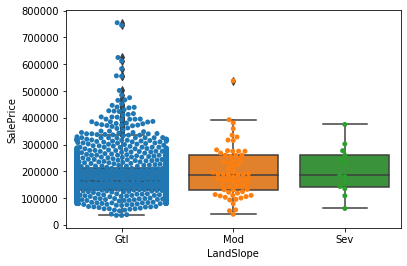

                    mean           std  median  count
LandSlope                                            
Sev        204379.230769  86729.922409  185000     13
Mod        196734.138462  92375.358116  186700     65
Gtl        179956.799566  78669.369151  161875   1382


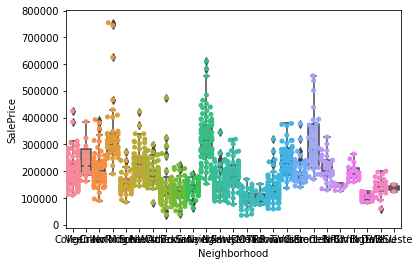

                       mean            std  median  count
Neighborhood                                             
NoRidge       335295.317073  121412.658640  301500     41
NridgHt       316270.623377   96392.544954  315000     77
StoneBr       310499.000000  112969.676640  278000     25
Timber        242247.447368   64845.651549  228475     38
Veenker       238772.727273   72369.317959  218000     11
Somerst       225379.837209   56177.555888  225500     86
ClearCr       212565.428571   50231.538993  200250     28
Crawfor       210624.725490   68866.395472  200624     51
CollgCr       197965.773333   51403.666438  197200    150
Blmngtn       194870.882353   30393.229219  191000     17
Gilbert       192854.506329   35986.779085  181000     79
NWAmes        189050.068493   37172.218106  182900     73
SawyerW       186555.796610   55651.997820  179900     59
Mitchel       156270.122449   36486.625334  153500     49
NAmes         145847.080000   33075.345450  140000    225
NPkVill       

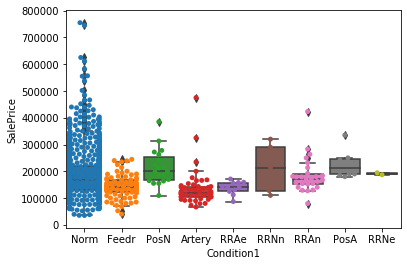

                     mean           std  median  count
Condition1                                            
PosA        225875.000000  52348.932313  212500      8
PosN        215184.210526  65256.536609  200000     19
RRNn        212400.000000  93823.238060  214000      5
RRNe        190750.000000   5303.300859  190750      2
Norm        184495.492063  81256.980125  166500   1260
RRAn        184396.615385  66177.922070  171495     26
Feedr       142475.481481  42157.290117  140000     81
RRAe        138400.000000  24030.813553  142500     11
Artery      135091.666667  66226.660548  119550     48


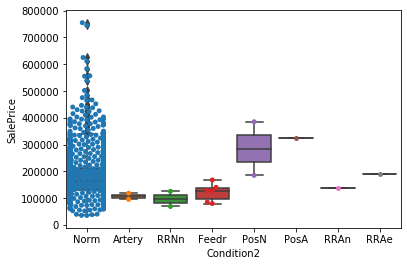

                     mean            std  median  count
Condition2                                             
PosA        325000.000000            NaN  325000      1
PosN        284875.000000  141598.132933  284875      2
RRAe        190000.000000            NaN  190000      1
Norm        181169.405536   79337.735547  163500   1445
RRAn        136905.000000            NaN  136905      1
Feedr       121166.666667   33544.994659  127500      6
Artery      106500.000000   16263.455967  106500      2
RRNn         96750.000000   39951.533137   96750      2


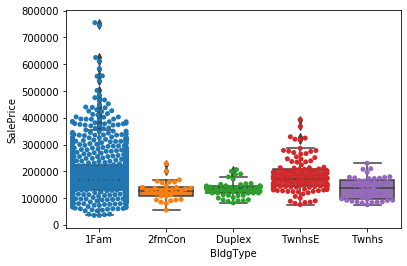

                   mean           std  median  count
BldgType                                            
1Fam      185763.807377  82648.502922  167900   1220
TwnhsE    181959.342105  60626.108918  172200    114
Twnhs     135911.627907  41013.222080  137500     43
Duplex    133541.076923  27833.249197  135980     52
2fmCon    128432.258065  35458.545158  127500     31


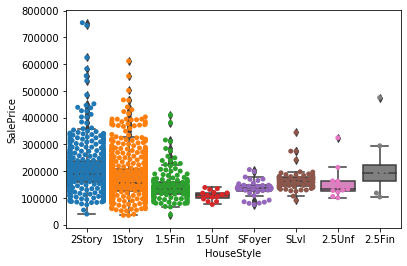

                     mean            std  median  count
HouseStyle                                             
2.5Fin      220000.000000  118211.976671  194000      8
2Story      210051.764045   87339.213570  190000    445
1Story      175985.477961   77055.715011  154750    726
SLvl        166703.384615   38305.161339  164500     65
2.5Unf      157354.545455   63934.128032  133900     11
1.5Fin      143116.740260   54277.941119  132000    154
SFoyer      135074.486486   30480.898192  135960     37
1.5Unf      110150.000000   19036.473090  111250     14


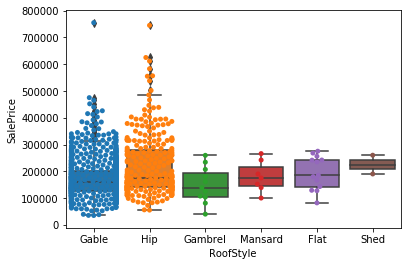

                    mean            std  median  count
RoofStyle                                             
Shed       225000.000000   49497.474683  225000      2
Hip        218876.933566  111549.603563  176500    286
Flat       194690.000000   62522.963515  185000     13
Mansard    180568.428571   58057.624627  175000      7
Gable      171483.956179   66331.237296  160000   1141
Gambrel    148909.090909   67013.527807  139000     11


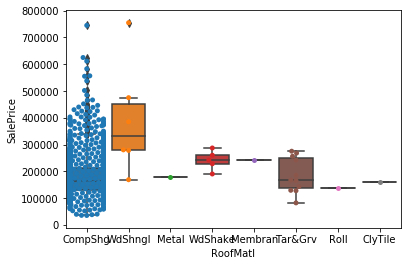

                   mean            std  median  count
RoofMatl                                             
WdShngl   390250.000000  206969.019421  332500      6
Membran   241500.000000            NaN  241500      1
WdShake   241400.000000   36218.779659  242000      5
Tar&Grv   185406.363636   65430.141720  167000     11
Metal     180000.000000            NaN  180000      1
CompShg   179803.679219   77722.388636  162000   1434
ClyTile   160000.000000            NaN  160000      1
Roll      137000.000000            NaN  137000      1


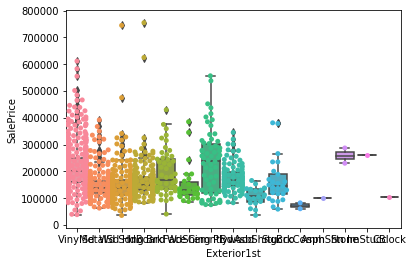

                      mean            std    median  count
Exterior1st                                               
ImStucc      262000.000000            NaN  262000.0      1
Stone        258500.000000   40305.086528  258500.0      2
CemntBd      231690.655738  120575.621318  236500.0     61
VinylSd      213732.900971   80646.975785  200000.0    515
BrkFace      194573.000000   82841.914370  165750.0     50
Plywood      175942.379630   49497.383293  167450.0    108
HdBoard      163077.450450   66305.714164  149900.0    222
Stucco       162990.000000   83307.246529  144000.0     25
WdShing      150655.076923   72507.530741  128700.0     26
Wd Sdng      149841.645631   71130.448152  138943.5    206
MetalSd      149422.177273   54776.408990  139000.0    220
AsbShng      107385.550000   33756.480660  108000.0     20
CBlock       105000.000000            NaN  105000.0      1
AsphShn      100000.000000            NaN  100000.0      1
BrkComm       71000.000000   15556.349186   71000.0     

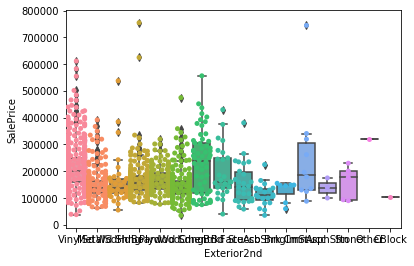

                      mean            std    median  count
Exterior2nd                                               
Other        319000.000000            NaN  319000.0      1
ImStucc      252070.000000  193176.672447  187600.0     10
CmentBd      230093.833333  116140.396221  238750.0     60
VinylSd      214432.460317   80708.309670  200070.5    504
BrkFace      195818.000000   95097.551756  160000.0     25
Plywood      168112.387324   46955.744372  160750.0    142
HdBoard      167661.565217   70061.078357  155000.0    207
Wd Shng      161328.947368   88974.217820  138225.0     38
Stone        158224.800000   63533.067573  177000.0      5
Stucco       155905.153846   74862.492410  142000.0     26
MetalSd      149803.172897   55078.595310  138750.0    214
Wd Sdng      148386.065990   59892.856640  138000.0    197
AsphShn      138000.000000   37509.998667  139000.0      3
Brk Cmn      126714.285714   38693.084161  147000.0      7
AsbShng      114060.550000   42315.043608  111000.0     

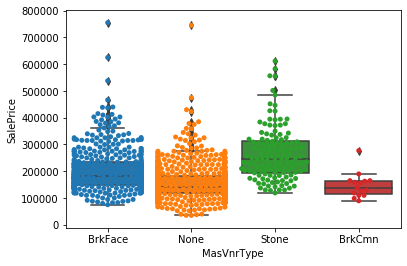

                     mean           std  median  count
MasVnrType                                            
Stone       265583.625000  99940.156577  246839    128
BrkFace     204691.871910  81214.293554  181000    445
None        156221.891204  60708.262798  143000    864
BrkCmn      146318.066667  46187.583632  139000     15


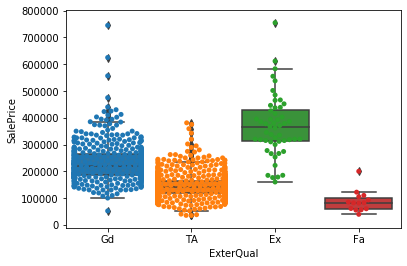

                    mean            std    median  count
ExterQual                                               
Ex         367360.961538  116401.264200  364606.5     52
Gd         231633.510246   71188.873899  220000.0    488
TA         144341.313466   42471.815703  139450.0    906
Fa          87985.214286   39826.918794   82250.0     14


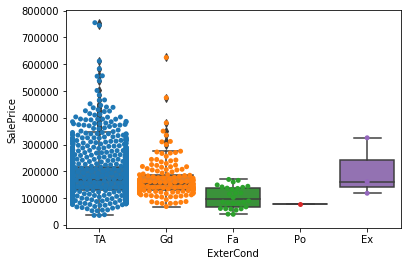

                    mean            std  median  count
ExterCond                                             
Ex         201333.333333  109235.220205  161000      3
TA         184034.896256   79806.257233  167370   1282
Gd         168897.568493   72608.303632  151250    146
Fa         102595.142857   40094.383940   95750     28
Po          76500.000000            NaN   76500      1


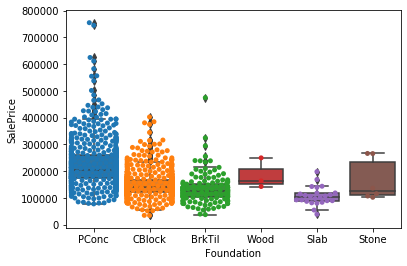

                     mean           std  median  count
Foundation                                            
PConc       225230.442040  86865.977283  205000    647
Wood        185666.666667  56695.090910  164000      3
Stone       165959.166667  78557.704413  126500      6
CBlock      149805.714511  48295.041759  141500    634
BrkTil      132291.075342  54592.393032  125250    146
Slab        107365.625000  34213.980939  104150     24


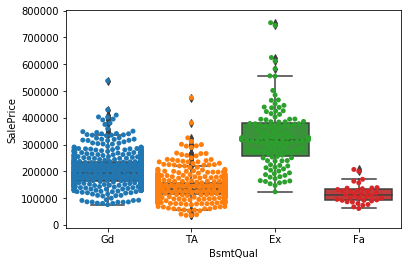

                   mean            std  median  count
BsmtQual                                             
Ex        327041.041322  113563.237392  318000    121
Gd        202688.478964   58092.364284  192070    618
TA        140759.818182   43483.265311  135500    649
Fa        115692.028571   34469.667278  112000     35


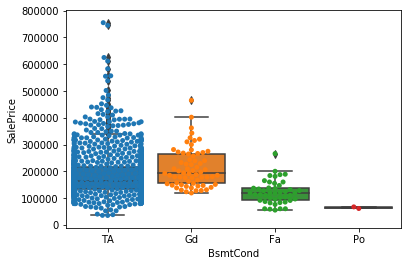

                   mean           std  median  count
BsmtCond                                            
Gd        213599.907692  72663.155026  193879     65
TA        183632.620900  79515.388449  165000   1311
Fa        121809.533333  43467.796975  118500     45
Po         64000.000000   4242.640687   64000      2


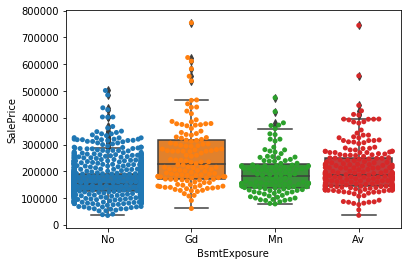

                       mean            std  median  count
BsmtExposure                                             
Gd            257689.805970  118923.672583  226975    134
Av            206643.420814   88655.504849  185850    221
Mn            192789.657895   77335.442652  182450    114
No            165652.295908   60695.724915  154000    953


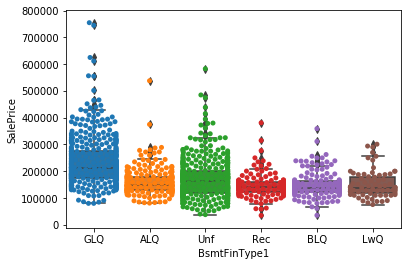

                       mean           std  median  count
BsmtFinType1                                            
GLQ           235413.720096  93215.613258  213750    418
Unf           170670.576744  72577.080129  161750    430
ALQ           161573.068182  50821.277231  149250    220
LwQ           151852.702703  50796.987083  139000     74
BLQ           149493.655405  47327.292126  139100    148
Rec           146889.248120  45190.118879  142000    133


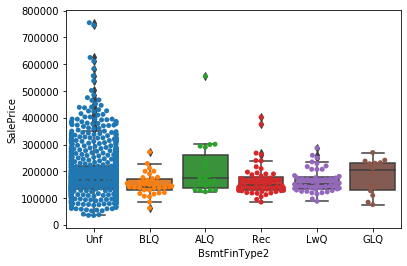

                       mean            std  median  count
BsmtFinType2                                             
ALQ           209942.105263  104764.743411  174900     19
Unf           184694.690287   81275.313909  167000   1256
GLQ           180982.142857   64573.040359  203125     14
Rec           164917.129630   59183.277020  148750     54
LwQ           164364.130435   43255.035241  154000     46
BLQ           151101.000000   41611.305388  143000     33


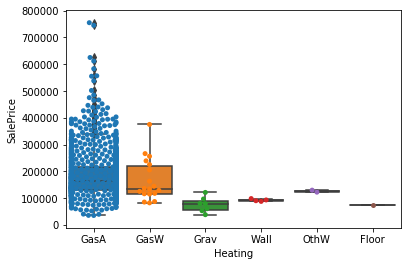

                  mean           std  median  count
Heating                                            
GasA     182021.195378  79262.873587  164500   1428
GasW     166632.166667  78547.575324  134950     18
OthW     125750.000000   5303.300859  125750      2
Wall      92100.000000   4509.988914   91450      4
Grav      75271.428571  28066.570524   79000      7
Floor     72500.000000           NaN   72500      1


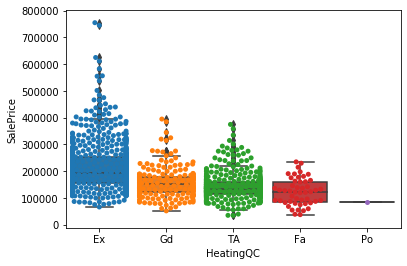

                    mean           std  median  count
HeatingQC                                            
Ex         214914.429150  87469.704503  194700    741
Gd         156858.871369  52923.920003  152000    241
TA         142362.876168  47226.485663  135000    428
Fa         123919.489796  50306.618996  123500     49
Po          87000.000000           NaN   87000      1


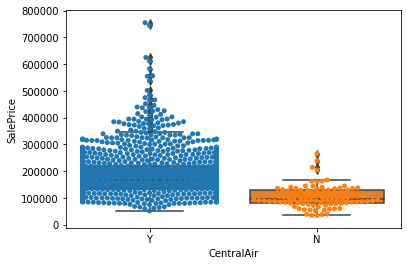

                     mean           std  median  count
CentralAir                                            
Y           186186.709890  78805.206820  168000   1365
N           105264.073684  40671.273961   98000     95


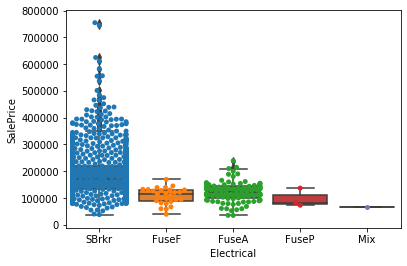

                     mean           std  median  count
Electrical                                            
SBrkr       186825.113193  79856.458326  170000   1334
FuseA       122196.893617  37511.376615  121250     94
FuseF       107675.444444  30636.507376  115000     27
FuseP        97333.333333  34645.827070   82000      3
Mix          67000.000000           NaN   67000      1


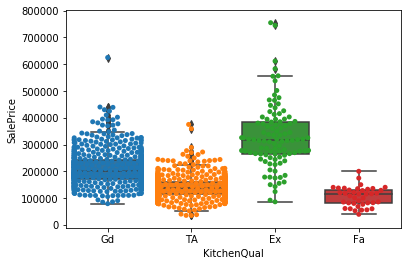

                      mean            std  median  count
KitchenQual                                             
Ex           328554.670000  120862.942573  316750    100
Gd           212116.023891   64020.176702  201400    586
TA           139962.511565   38896.280336  137000    735
Fa           105565.205128   36004.254037  115000     39


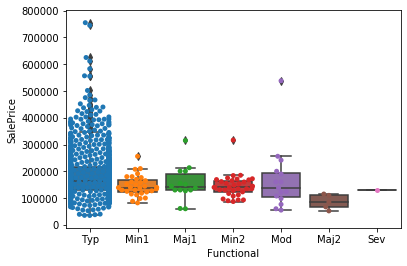

                     mean            std  median  count
Functional                                             
Typ         183429.147059   80017.959658  165500   1360
Mod         168393.333333  118938.666467  137900     15
Maj1        153948.142857   64503.775815  140750     14
Min1        146385.483871   38089.572487  139000     31
Min2        144240.647059   41215.354652  140000     34
Sev         129000.000000            NaN  129000      1
Maj2         85800.000000   27086.897201   85000      5


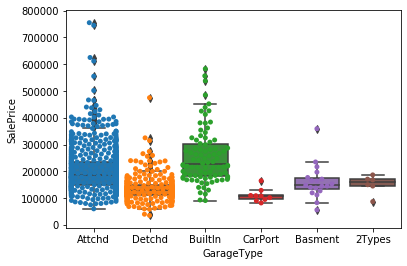

                     mean            std  median  count
GarageType                                             
BuiltIn     254751.738636  102230.854394  227500     88
Attchd      202892.656322   77146.621778  185000    870
Basment     160570.684211   63967.283574  148000     19
2Types      151283.333333   34917.068415  159000      6
Detchd      134091.162791   41391.549953  129500    387
CarPort     109962.111111   24638.183681  108000      9


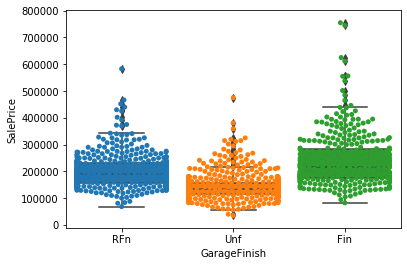

                       mean           std  median  count
GarageFinish                                            
Fin           240052.690341  96960.593232  215000    352
RFn           202068.869668  63536.222518  190000    422
Unf           142156.423140  46498.528211  135000    605


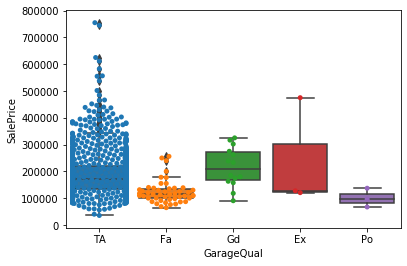

                     mean            std  median  count
GarageQual                                             
Ex          241000.000000  202680.166765  127500      3
Gd          215860.714286   74126.739021  209115     14
TA          187489.836003   78774.948567  170000   1311
Fa          123573.354167   42971.440985  115000     48
Po          100166.666667   35143.752408   96500      3


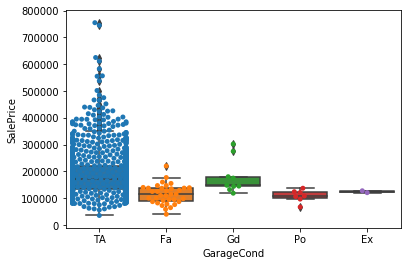

                     mean           std  median  count
GarageCond                                            
TA          187885.735294  79103.322640  170000   1326
Gd          179930.000000  64769.318354  148000      9
Ex          124000.000000   4949.747468  124000      2
Fa          114654.028571  36420.903588  114504     35
Po          108500.000000  22662.377045  108000      7


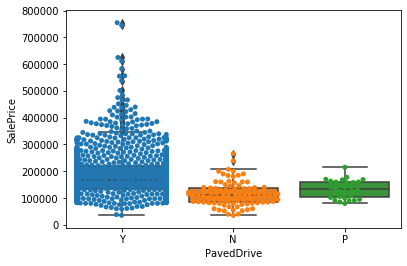

                     mean           std  median  count
PavedDrive                                            
Y           186433.973881  79665.503047  168500   1340
P           132330.000000  33503.030228  132250     30
N           115039.122222  44352.523309  111000     90


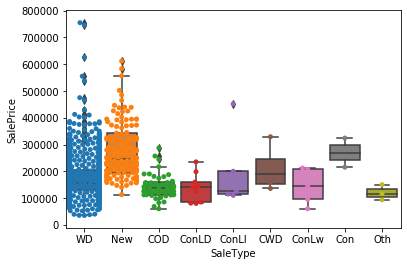

                   mean            std  median  count
SaleType                                             
New       274945.418033  103239.582158  247453    122
Con       269600.000000   76933.217793  269600      2
CWD       210600.000000   86421.486526  188750      4
ConLI     200390.000000  145282.519595  125000      5
WD        173401.836622   71129.686245  158000   1267
COD       143973.255814   47098.294314  139000     43
ConLw     143700.000000   67291.901444  144000      5
ConLD     138780.888889   53876.560647  140000      9
Oth       119850.000000   28441.035495  116050      3


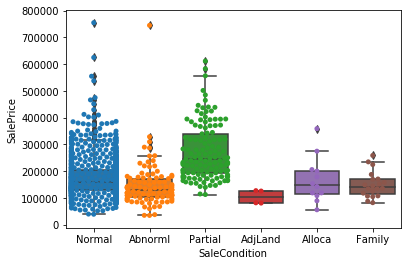

                        mean            std  median  count
SaleCondition                                             
Partial        272291.752000  103696.404119  244600    125
Normal         175202.219533   69713.636280  160000   1198
Alloca         167377.416667   84460.527502  148145     12
Family         149600.000000   47820.002421  140500     20
Abnorml        146526.623762   82796.213395  130000    101
AdjLand        104125.000000   26135.464411  104000      4


In [27]:
for i in CatCol:
    sns.boxplot(x=i,y='SalePrice',data=Train)
    sns.swarmplot(x=i,y='SalePrice',data=Train)
    plt.show()
    print(Train.groupby(i)['SalePrice'].agg(['mean','std','median','count']).sort_values(['mean','count'],ascending=False))

In [28]:
To_drop_list=['Utilities','Street','LandSlope','Condition2','RoofMatl','BsmtFinType2']

In [29]:
Train=Train.drop(To_drop_list,axis='columns')
Test=Test.drop(To_drop_list,axis='columns')
Merged=Merged.drop(To_drop_list,axis='columns')
Train_no_sales=Train_no_sales.drop(To_drop_list,axis='columns')
Train_Copy=Train.copy()
Test_Copy=Test.copy()
Merged_Copy=Merged.copy()

In [30]:
CatCol=list(Train.select_dtypes(include='object').columns)

In [31]:
print(CatCol)

['MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


In [32]:
print(ConCol)

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', 'ScreenPorch', 'MoSold', 'YrSold']


In [33]:
ConCol.remove('MSSubClass')

In [34]:
CatCol=['MSSubClass']+CatCol

In [35]:
print(CatCol)

['MSSubClass', 'MSZoning', 'LotShape', 'LandContour', 'LotConfig', 'Neighborhood', 'Condition1', 'BldgType', 'HouseStyle', 'RoofStyle', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'SaleType', 'SaleCondition']


Variable='LotShape'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='MSSubClass'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='LotConfig'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='Neighborhood'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='Condition1'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='BldgType'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='HouseStyle'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='RoofStyle'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='Exterior1st'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='Exterior2nd'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='ExterCond'
Variable_df=Categorical_Dimension_reducer(Variable)

Variable='RoofStyle'
Variable_df=Categorical_Dimension_reducer(Variable)

In [36]:
for i in CatCol:
    print(i, Train[i].unique())
print(CatCol)

MSSubClass [ 60  20  70  50 190  45  90 120  30  85  80 160  75 180  40]
MSZoning ['RL' 'RM' 'C (all)' 'FV' 'RH']
LotShape ['Reg' 'IR1' 'IR2' 'IR3']
LandContour ['Lvl' 'Bnk' 'Low' 'HLS']
LotConfig ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
Neighborhood ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
BldgType ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
Exterior1st ['VinylSd' 'MetalSd' 'Wd Sdng' 'HdBoard' 'BrkFace' 'WdShing' 'CemntBd'
 'Plywood' 'AsbShng' 'Stucco' 'BrkComm' 'AsphShn' 'Stone' 'ImStucc'
 'CBlock']
Exterior2nd ['VinylSd' 'MetalSd' 'Wd Shng' 'HdBoard' 'Plywood' 'W

In [37]:
NomCol=['GarageCond','GarageQual','KitchenQual','HeatingQC','BsmtExposure','BsmtCond','BsmtQual','ExterQual']

Due to absense of150 in Train DataFrame, it was replaced with 40
The categorical variables started with integers. Enter non digit initials ending with _  A_


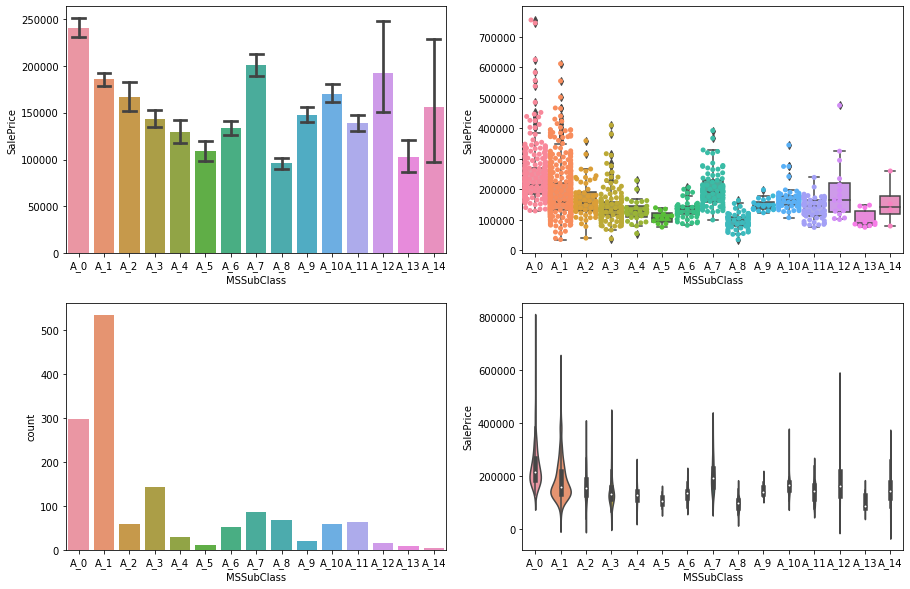

                     mean            std  median  count
MSSubClass                                             
A_0         239948.501672   86579.909966  215200    299
A_7         200779.080460   58221.490909  192000     87
A_12        192437.500000  100556.762577  163500     16
A_1         185224.811567   78782.189967  159250    536
A_10        169736.551724   38197.808771  166500     58
A_2         166772.416667   58206.545762  156000     60
A_14        156125.000000   75747.799748  142500      4
A_9         147810.000000   19629.942220  140750     20
A_3         143302.972222   54851.983707  132000    144
A_11        138647.380952   34587.542266  146000     63
A_6         133541.076923   27833.249197  135980     52
A_4         129613.333333   35439.097670  128250     30
A_5         108591.666667   20231.723889  107500     12
A_13        102300.000000   29474.282575   88500     10
A_8          95829.724638   24857.110083   99900     69
After minimum count fixing, the final graph is:


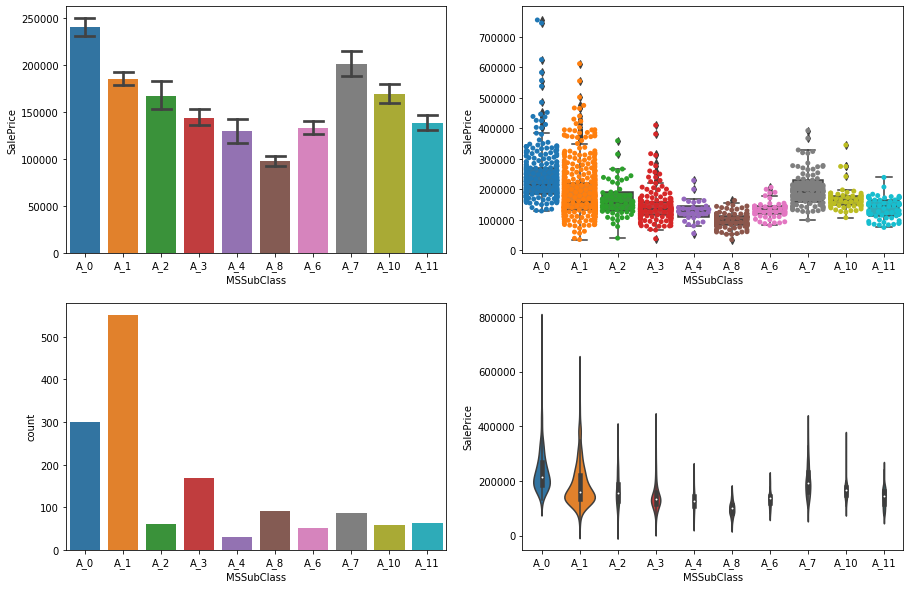

                     mean           std    median  count
MSSubClass                                              
A_0         239948.501672  86579.909966  215200.0    299
A_7         200779.080460  58221.490909  192000.0     87
A_1         185433.875000  79392.339135  159697.5    552
A_10        169736.551724  38197.808771  166500.0     58
A_2         166772.416667  58206.545762  156000.0     60
A_3         144144.809524  52239.040957  134700.0    168
A_11        138647.380952  34587.542266  146000.0     63
A_6         133541.076923  27833.249197  135980.0     52
A_4         129613.333333  35439.097670  128250.0     30
A_8          98223.637363  24986.275788   99900.0     91
After minimum count fixing, the final graph is:


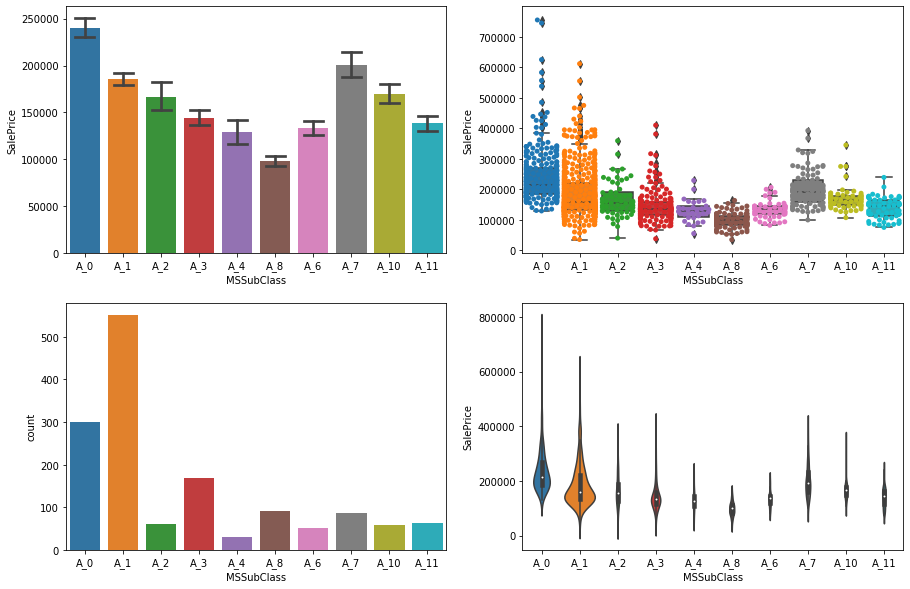

                     mean           std    median  count
MSSubClass                                              
A_0         239948.501672  86579.909966  215200.0    299
A_7         200779.080460  58221.490909  192000.0     87
A_1         185433.875000  79392.339135  159697.5    552
A_10        169736.551724  38197.808771  166500.0     58
A_2         166772.416667  58206.545762  156000.0     60
A_3         144144.809524  52239.040957  134700.0    168
A_11        138647.380952  34587.542266  146000.0     63
A_6         133541.076923  27833.249197  135980.0     52
A_4         129613.333333  35439.097670  128250.0     30
A_8          98223.637363  24986.275788   99900.0     91
Due to absense ofnan in Train DataFrame, it was replaced with C (all)


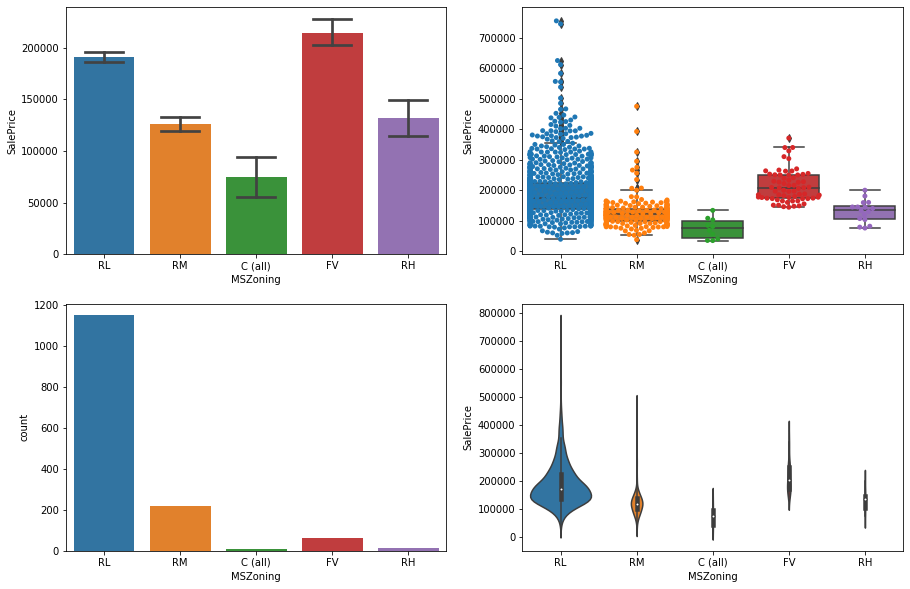

                   mean           std  median  count
MSZoning                                            
FV        214014.061538  52369.662067  205950     65
RL        191004.994787  80766.341319  174000   1151
RH        131558.375000  35714.118435  136500     16
RM        126316.830275  48521.689833  120500    218
C (all)    74528.000000  33791.092031   74700     10
After minimum count fixing, the final graph is:


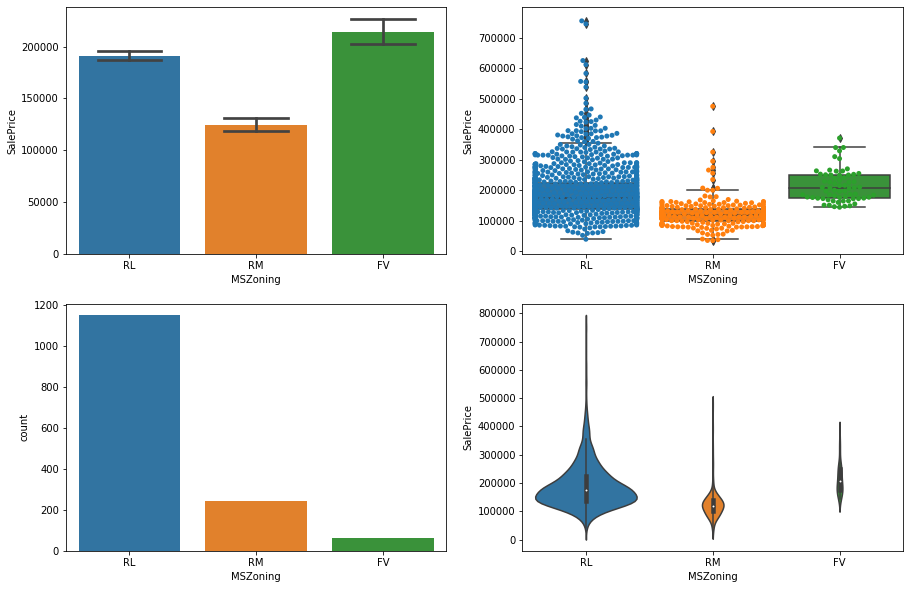

                   mean           std  median  count
MSZoning                                            
FV        214014.061538  52369.662067  205950     65
RL        191004.994787  80766.341319  174000   1151
RM        124538.045082  48295.740666  120000    244
After minimum count fixing, the final graph is:


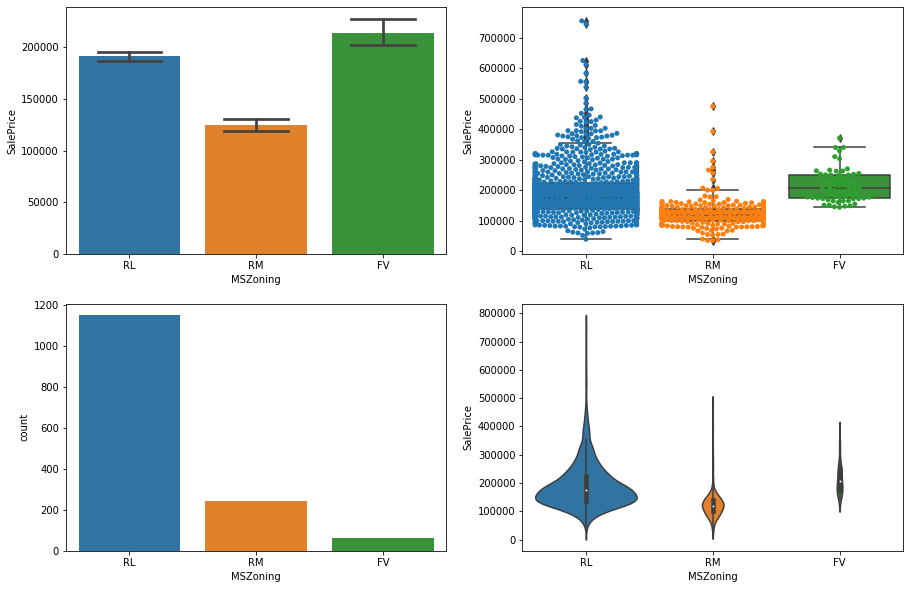

                   mean           std  median  count
MSZoning                                            
FV        214014.061538  52369.662067  205950     65
RL        191004.994787  80766.341319  174000   1151
RM        124538.045082  48295.740666  120000    244


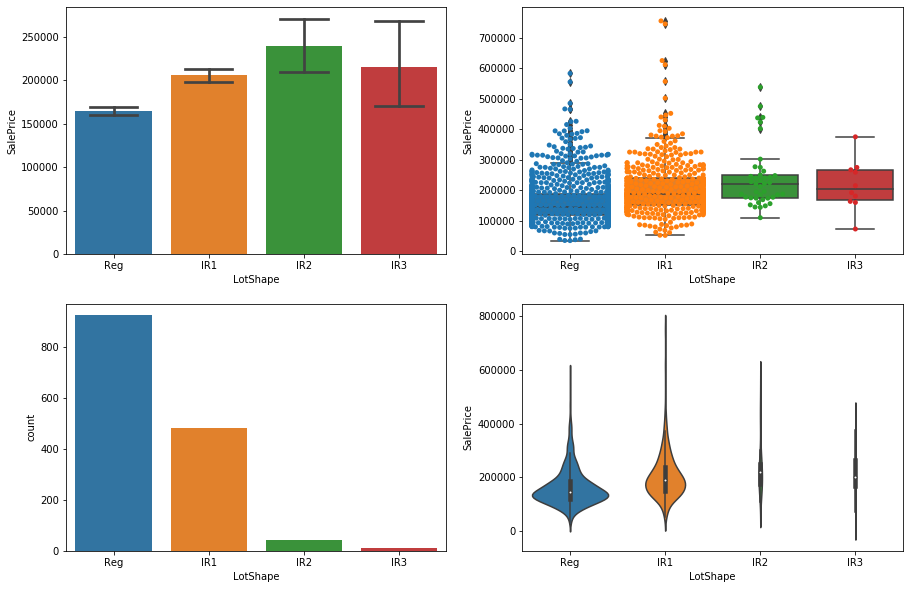

                   mean           std  median  count
LotShape                                            
IR2       239833.365854  99669.427362  221000     41
IR3       216036.500000  82540.334855  203570     10
IR1       206101.665289  85858.489559  189000    484
Reg       164754.818378  69673.427215  146000    925
After minimum count fixing, the final graph is:


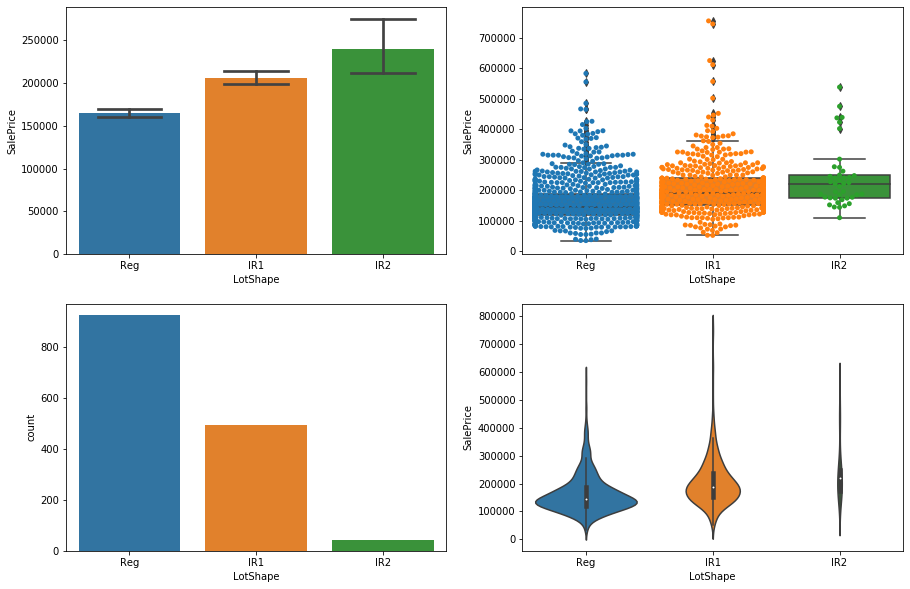

                   mean           std  median  count
LotShape                                            
IR2       239833.365854  99669.427362  221000     41
IR1       206302.775304  85723.324251  189500    494
Reg       164754.818378  69673.427215  146000    925
After minimum count fixing, the final graph is:


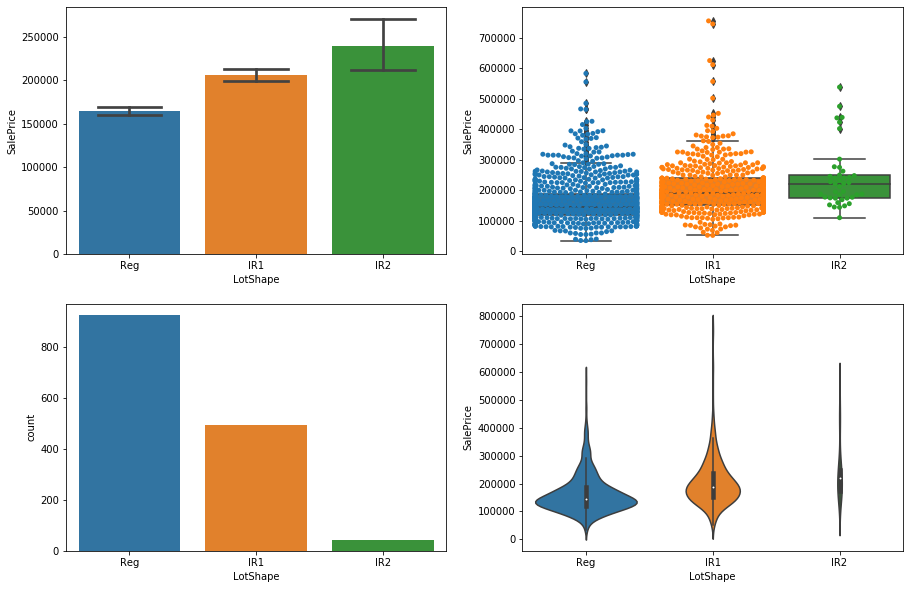

                   mean           std  median  count
LotShape                                            
IR2       239833.365854  99669.427362  221000     41
IR1       206302.775304  85723.324251  189500    494
Reg       164754.818378  69673.427215  146000    925


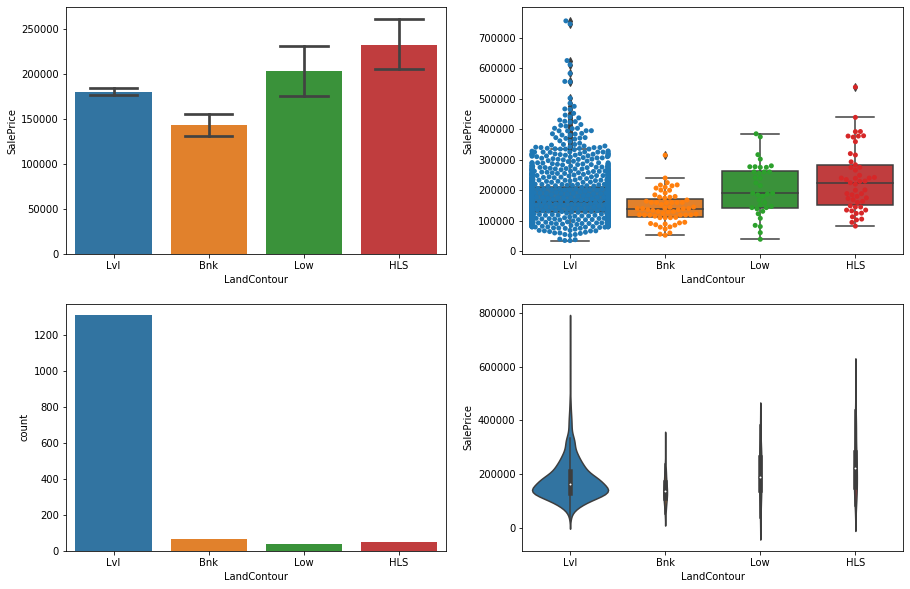

                      mean            std  median  count
LandContour                                             
HLS          231533.940000  101790.139741  222250     50
Low          203661.111111   83935.353620  190000     36
Lvl          180183.746758   78463.567918  162900   1311
Bnk          143104.079365   49361.244074  139400     63
After minimum count fixing, the final graph is:


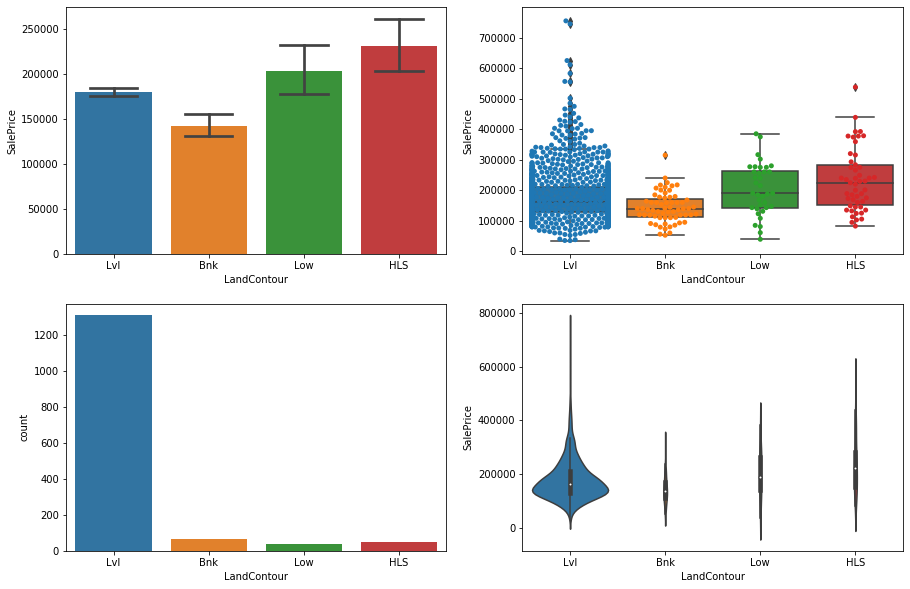

                      mean            std  median  count
LandContour                                             
HLS          231533.940000  101790.139741  222250     50
Low          203661.111111   83935.353620  190000     36
Lvl          180183.746758   78463.567918  162900   1311
Bnk          143104.079365   49361.244074  139400     63
After minimum count fixing, the final graph is:


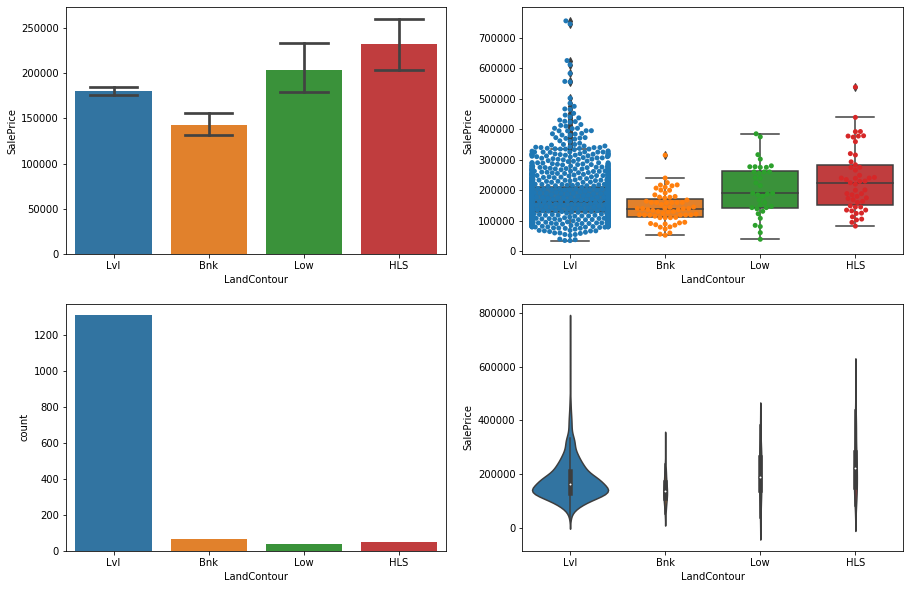

                      mean            std  median  count
LandContour                                             
HLS          231533.940000  101790.139741  222250     50
Low          203661.111111   83935.353620  190000     36
Lvl          180183.746758   78463.567918  162900   1311
Bnk          143104.079365   49361.244074  139400     63


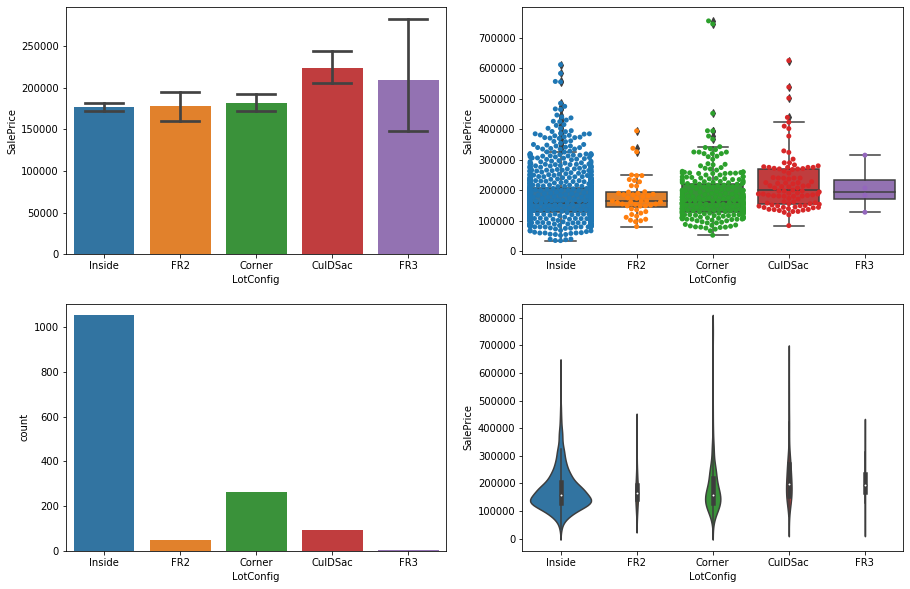

                    mean           std    median  count
LotConfig                                              
CulDSac    223854.617021  93117.546586  199262.0     94
FR3        208475.000000  78379.222374  195450.0      4
Corner     181623.425856  84466.041222  160000.0    263
FR2        177934.574468  62788.926829  165000.0     47
Inside     176938.047529  76426.805787  159697.5   1052
After minimum count fixing, the final graph is:


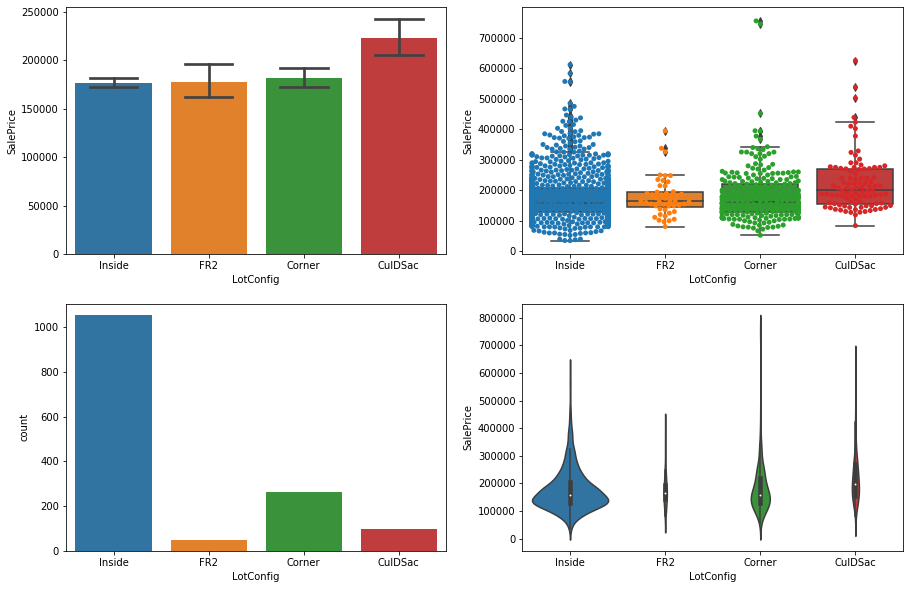

                    mean           std    median  count
LotConfig                                              
CulDSac    223226.877551  92264.133734  199262.0     98
Corner     181623.425856  84466.041222  160000.0    263
FR2        177934.574468  62788.926829  165000.0     47
Inside     176938.047529  76426.805787  159697.5   1052
After minimum count fixing, the final graph is:


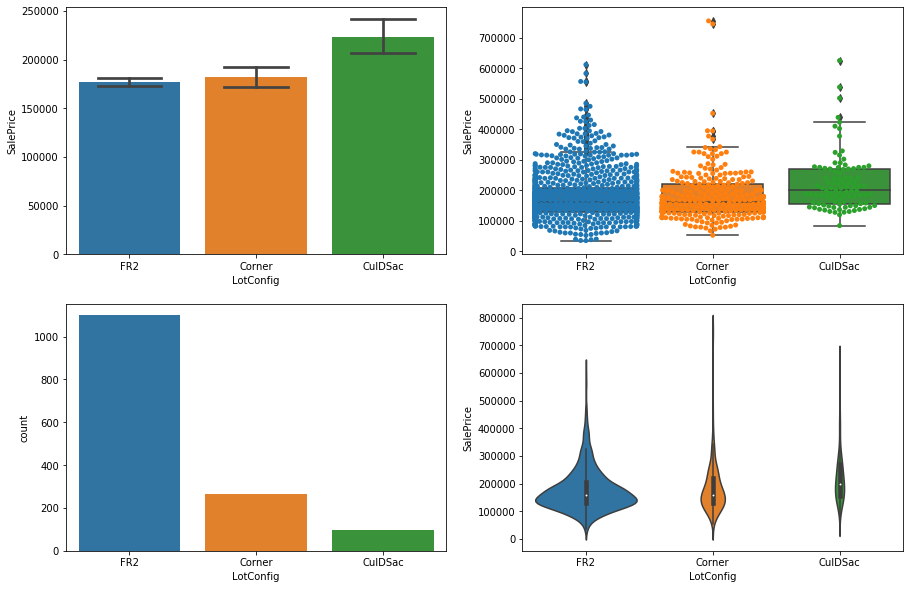

                    mean           std  median  count
LotConfig                                            
CulDSac    223226.877551  92264.133734  199262     98
Corner     181623.425856  84466.041222  160000    263
FR2        176980.665150  75869.866772  160000   1099


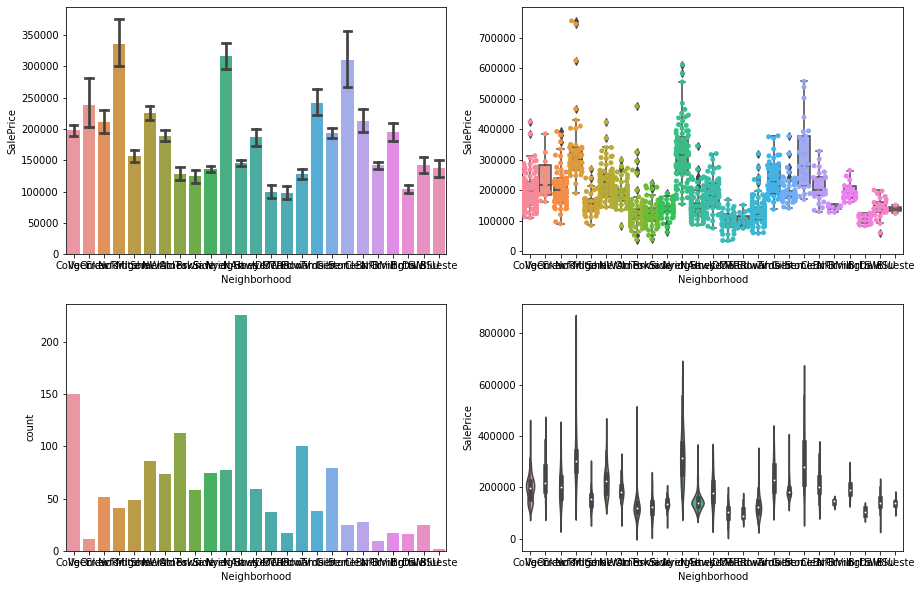

                       mean            std  median  count
Neighborhood                                             
NoRidge       335295.317073  121412.658640  301500     41
NridgHt       316270.623377   96392.544954  315000     77
StoneBr       310499.000000  112969.676640  278000     25
Timber        242247.447368   64845.651549  228475     38
Veenker       238772.727273   72369.317959  218000     11
Somerst       225379.837209   56177.555888  225500     86
ClearCr       212565.428571   50231.538993  200250     28
Crawfor       210624.725490   68866.395472  200624     51
CollgCr       197965.773333   51403.666438  197200    150
Blmngtn       194870.882353   30393.229219  191000     17
Gilbert       192854.506329   35986.779085  181000     79
NWAmes        189050.068493   37172.218106  182900     73
SawyerW       186555.796610   55651.997820  179900     59
Mitchel       156270.122449   36486.625334  153500     49
NAmes         145847.080000   33075.345450  140000    225
NPkVill       

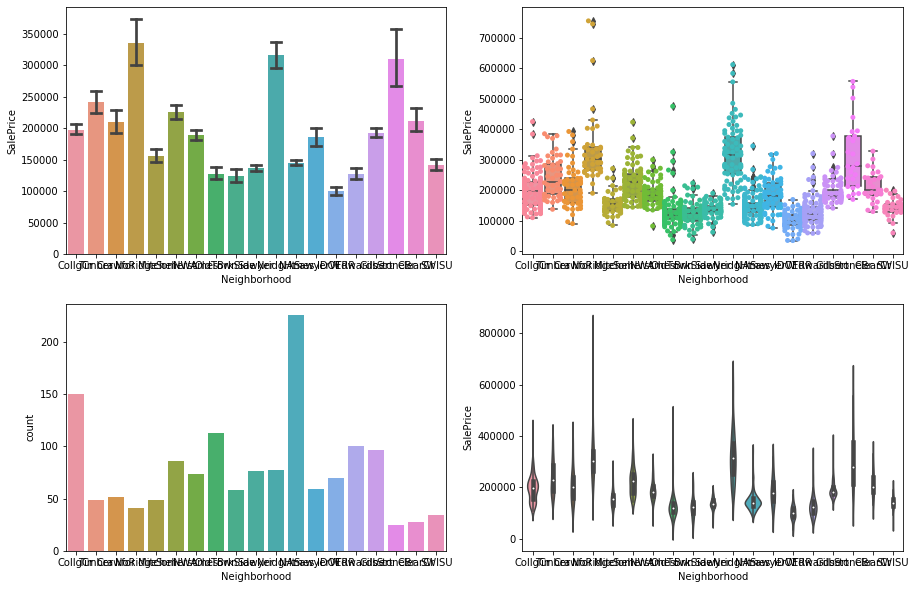

                       mean            std  median  count
Neighborhood                                             
NoRidge       335295.317073  121412.658640  301500     41
NridgHt       316270.623377   96392.544954  315000     77
StoneBr       310499.000000  112969.676640  278000     25
Timber        241467.408163   65837.496142  228000     49
Somerst       225379.837209   56177.555888  225500     86
ClearCr       212565.428571   50231.538993  200250     28
Crawfor       210624.725490   68866.395472  200624     51
CollgCr       197965.773333   51403.666438  197200    150
Gilbert       193211.572917   34921.056467  181000     96
NWAmes        189050.068493   37172.218106  182900     73
SawyerW       186555.796610   55651.997820  179900     59
Mitchel       156270.122449   36486.625334  153500     49
NAmes         145847.080000   33075.345450  140000    225
SWISU         142618.647059   28201.470375  140000     34
Sawyer        136811.736842   22155.427687  135000     76
OldTown       

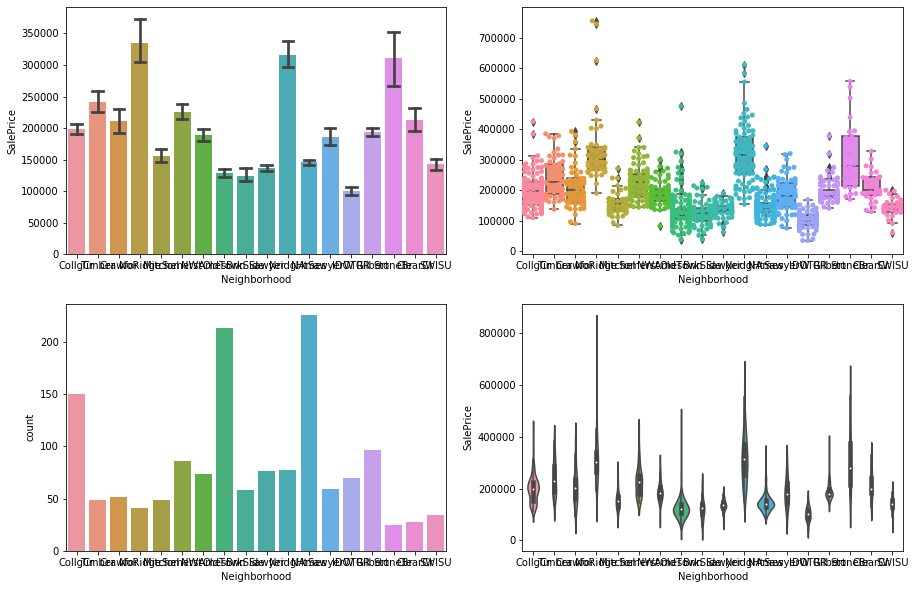

                       mean            std  median  count
Neighborhood                                             
NoRidge       335295.317073  121412.658640  301500     41
NridgHt       316270.623377   96392.544954  315000     77
StoneBr       310499.000000  112969.676640  278000     25
Timber        241467.408163   65837.496142  228000     49
Somerst       225379.837209   56177.555888  225500     86
ClearCr       212565.428571   50231.538993  200250     28
Crawfor       210624.725490   68866.395472  200624     51
CollgCr       197965.773333   51403.666438  197200    150
Gilbert       193211.572917   34921.056467  181000     96
NWAmes        189050.068493   37172.218106  182900     73
SawyerW       186555.796610   55651.997820  179900     59
Mitchel       156270.122449   36486.625334  153500     49
NAmes         145847.080000   33075.345450  140000    225
SWISU         142618.647059   28201.470375  140000     34
Sawyer        136811.736842   22155.427687  135000     76
OldTown       

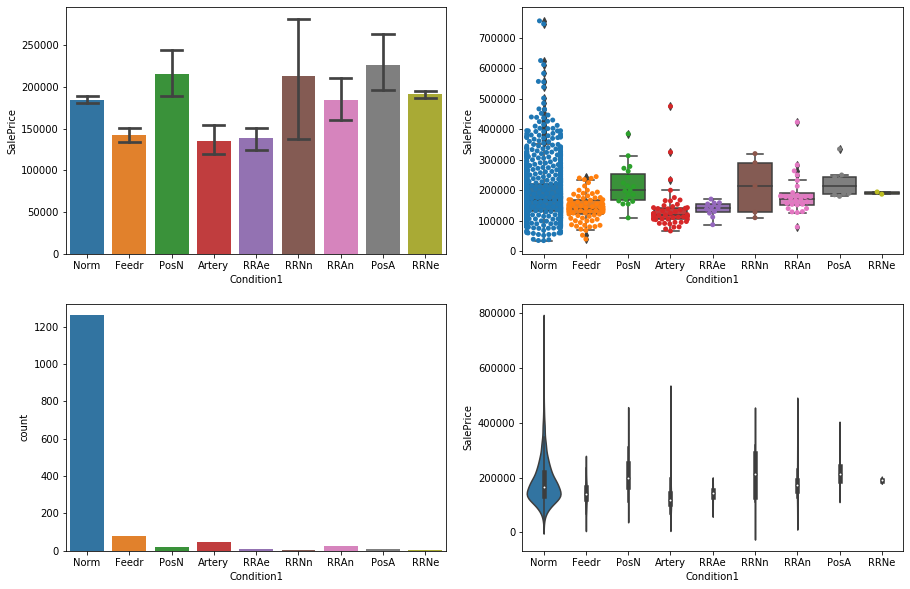

                     mean           std  median  count
Condition1                                            
PosA        225875.000000  52348.932313  212500      8
PosN        215184.210526  65256.536609  200000     19
RRNn        212400.000000  93823.238060  214000      5
RRNe        190750.000000   5303.300859  190750      2
Norm        184495.492063  81256.980125  166500   1260
RRAn        184396.615385  66177.922070  171495     26
Feedr       142475.481481  42157.290117  140000     81
RRAe        138400.000000  24030.813553  142500     11
Artery      135091.666667  66226.660548  119550     48
After minimum count fixing, the final graph is:


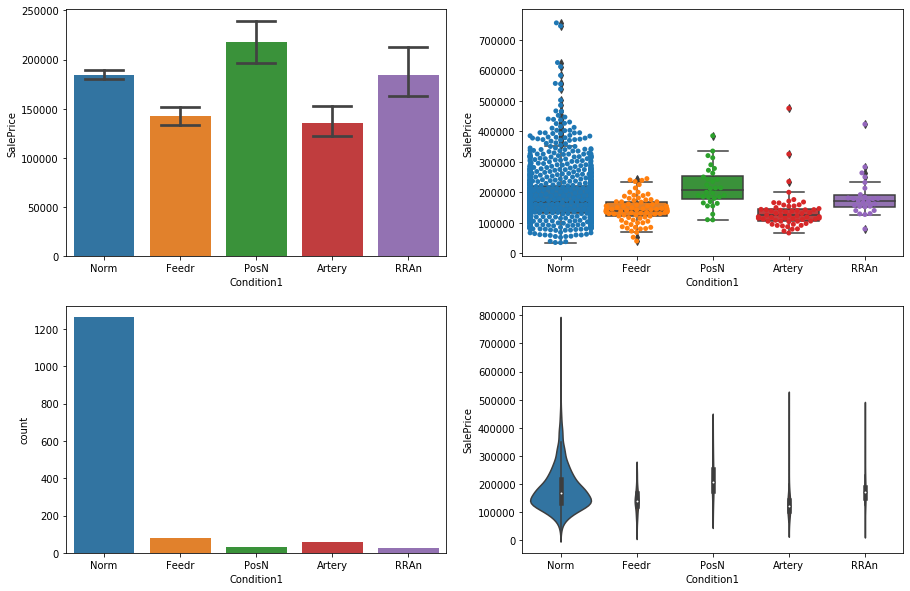

                     mean           std  median  count
Condition1                                            
PosN        217421.875000  65213.898600  206000     32
Norm        184505.404120  81193.034853  167000   1262
RRAn        184396.615385  66177.922070  171495     26
Feedr       142475.481481  42157.290117  140000     81
Artery      135708.474576  60459.927704  124000     59
After minimum count fixing, the final graph is:


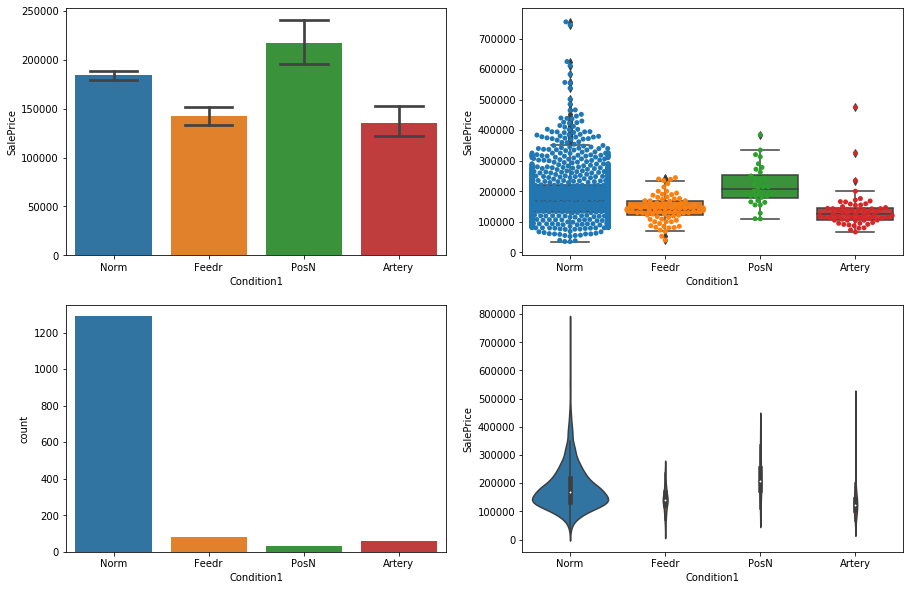

                     mean           std  median  count
Condition1                                            
PosN        217421.875000  65213.898600  206000     32
Norm        184503.208075  80896.250810  167000   1288
Feedr       142475.481481  42157.290117  140000     81
Artery      135708.474576  60459.927704  124000     59
The categorical variables started with integers. Enter non digit initials ending with _  B_


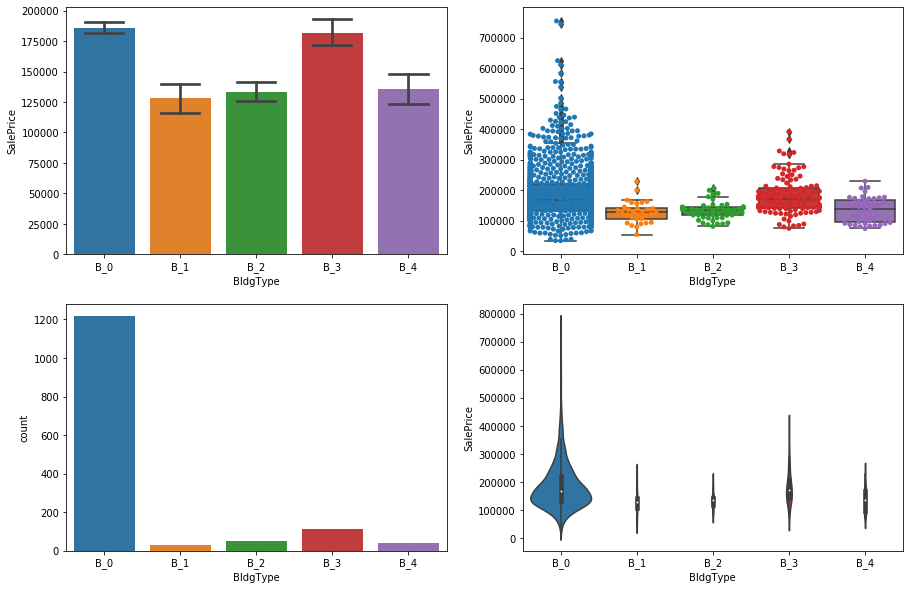

                   mean           std  median  count
BldgType                                            
B_0       185763.807377  82648.502922  167900   1220
B_3       181959.342105  60626.108918  172200    114
B_4       135911.627907  41013.222080  137500     43
B_2       133541.076923  27833.249197  135980     52
B_1       128432.258065  35458.545158  127500     31
After minimum count fixing, the final graph is:


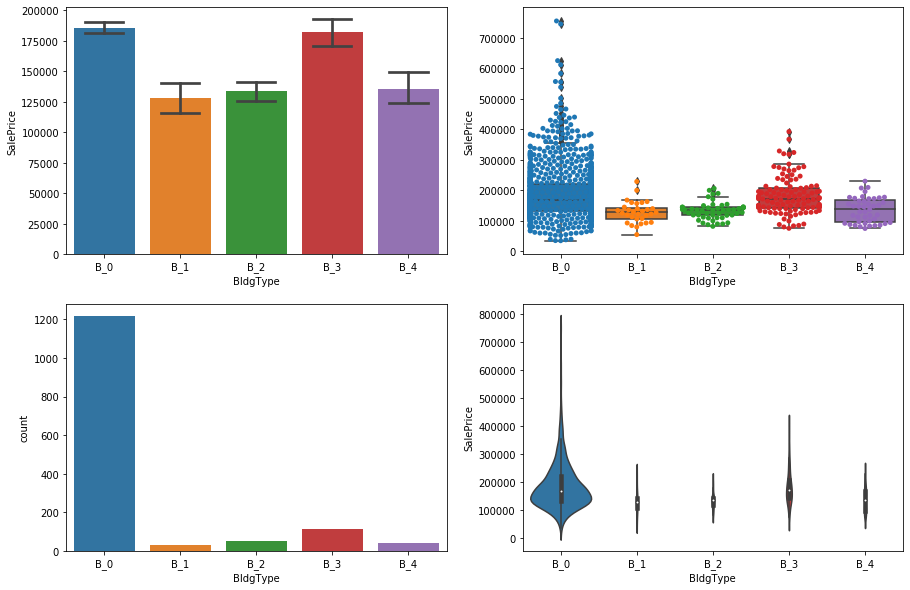

                   mean           std  median  count
BldgType                                            
B_0       185763.807377  82648.502922  167900   1220
B_3       181959.342105  60626.108918  172200    114
B_4       135911.627907  41013.222080  137500     43
B_2       133541.076923  27833.249197  135980     52
B_1       128432.258065  35458.545158  127500     31
After minimum count fixing, the final graph is:


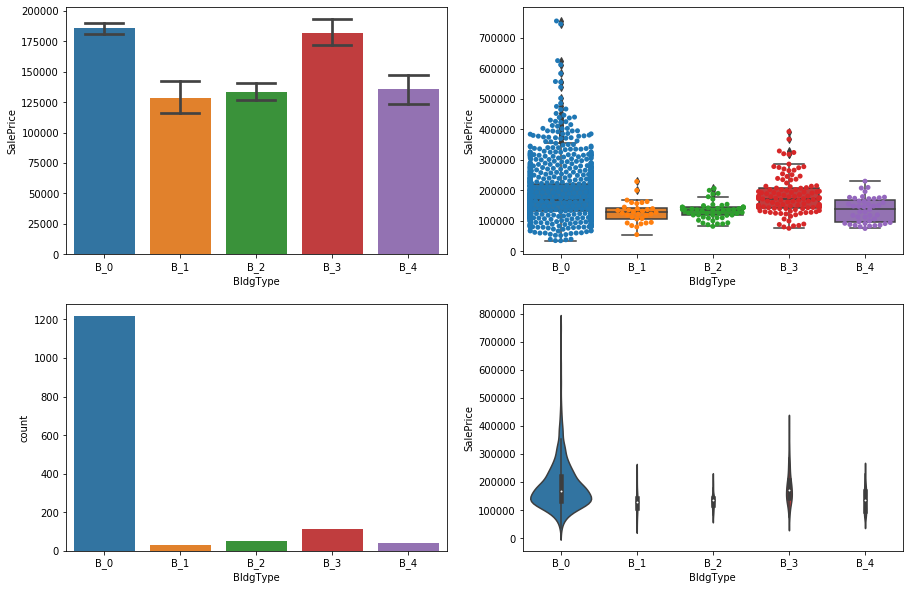

                   mean           std  median  count
BldgType                                            
B_0       185763.807377  82648.502922  167900   1220
B_3       181959.342105  60626.108918  172200    114
B_4       135911.627907  41013.222080  137500     43
B_2       133541.076923  27833.249197  135980     52
B_1       128432.258065  35458.545158  127500     31
The categorical variables started with integers. Enter non digit initials ending with _  C_


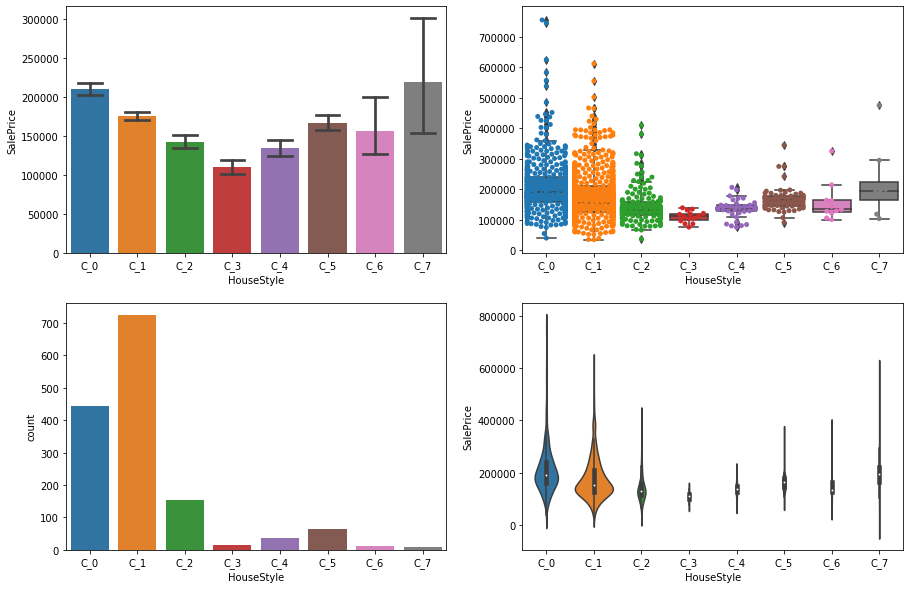

                     mean            std  median  count
HouseStyle                                             
C_7         220000.000000  118211.976671  194000      8
C_0         210051.764045   87339.213570  190000    445
C_1         175985.477961   77055.715011  154750    726
C_5         166703.384615   38305.161339  164500     65
C_6         157354.545455   63934.128032  133900     11
C_2         143116.740260   54277.941119  132000    154
C_4         135074.486486   30480.898192  135960     37
C_3         110150.000000   19036.473090  111250     14
After minimum count fixing, the final graph is:


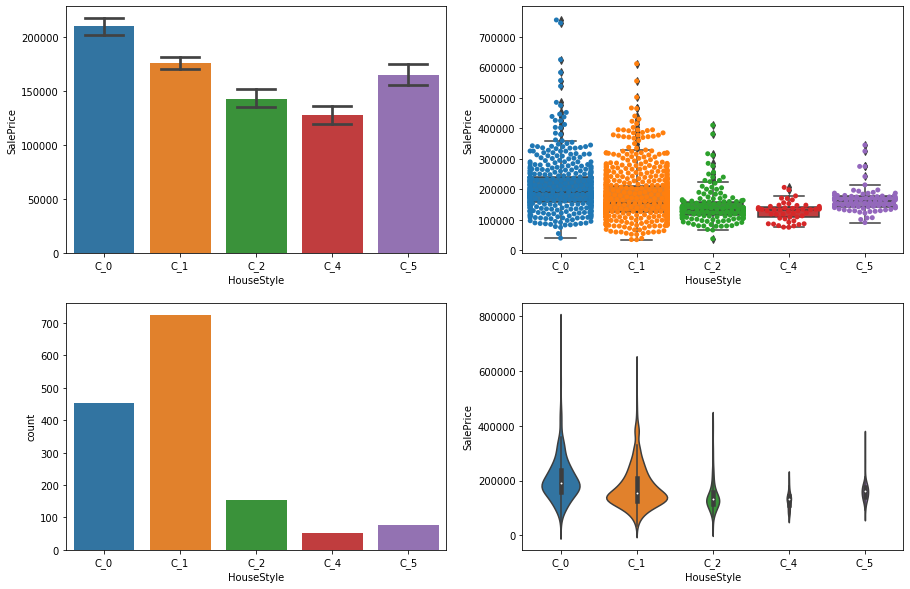

                     mean           std  median  count
HouseStyle                                            
C_0         210227.450331  87813.781624  190000    453
C_1         175985.477961  77055.715011  154750    726
C_5         165350.263158  42521.249495  161500     76
C_2         143116.740260  54277.941119  132000    154
C_4         128232.470588  29822.088686  133000     51
After minimum count fixing, the final graph is:


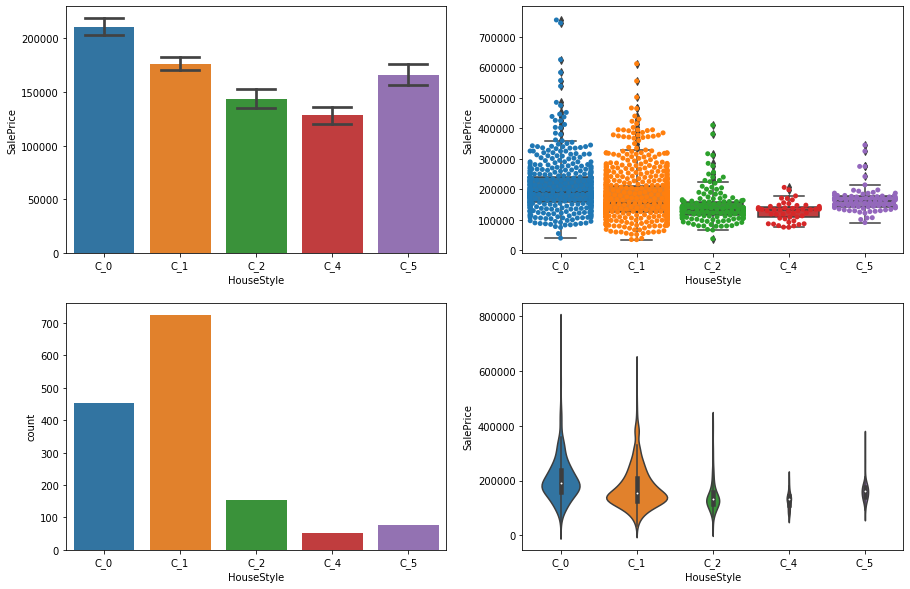

                     mean           std  median  count
HouseStyle                                            
C_0         210227.450331  87813.781624  190000    453
C_1         175985.477961  77055.715011  154750    726
C_5         165350.263158  42521.249495  161500     76
C_2         143116.740260  54277.941119  132000    154
C_4         128232.470588  29822.088686  133000     51


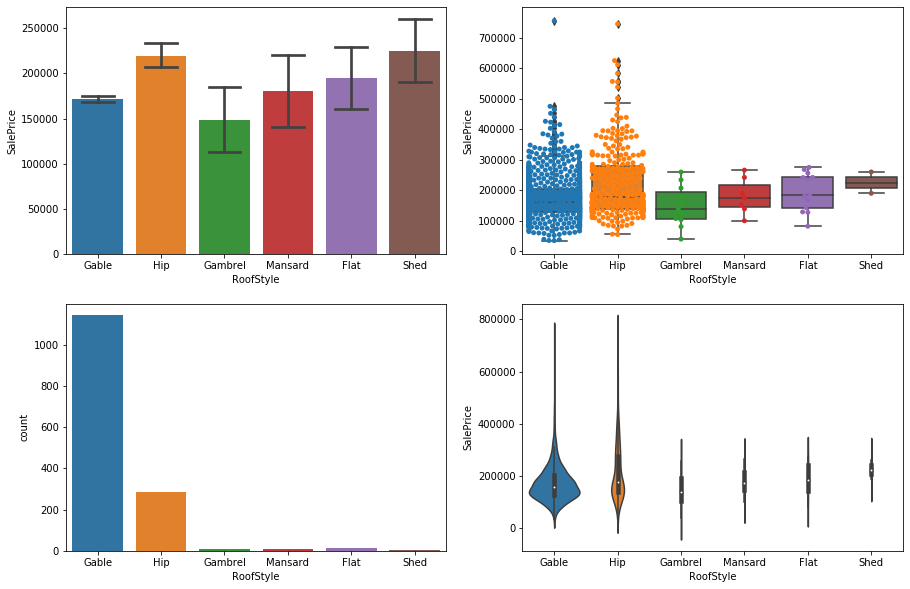

                    mean            std  median  count
RoofStyle                                             
Shed       225000.000000   49497.474683  225000      2
Hip        218876.933566  111549.603563  176500    286
Flat       194690.000000   62522.963515  185000     13
Mansard    180568.428571   58057.624627  175000      7
Gable      171483.956179   66331.237296  160000   1141
Gambrel    148909.090909   67013.527807  139000     11
After minimum count fixing, the final graph is:


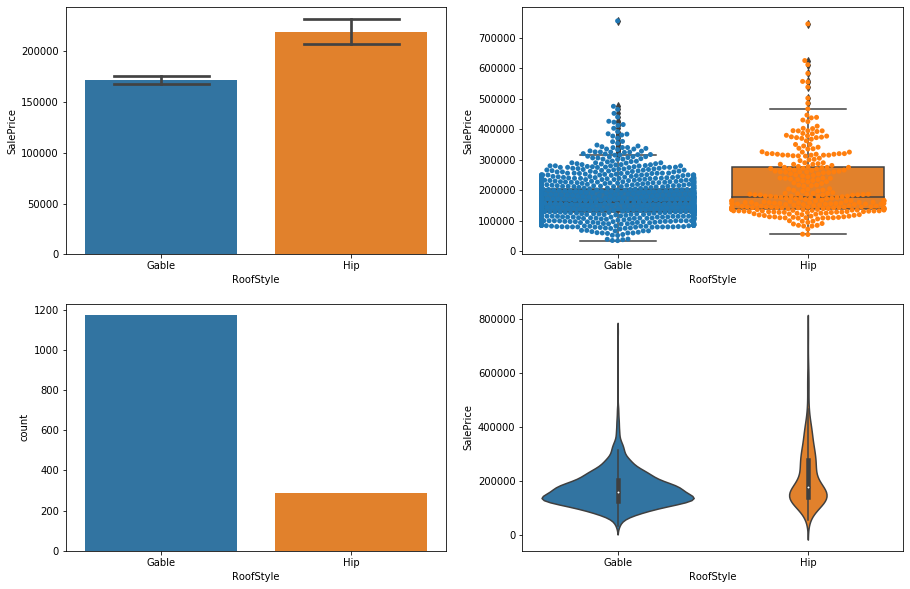

                    mean            std  median  count
RoofStyle                                             
Hip        218919.454861  111199.807123  177250    288
Gable      171583.739761   66259.227703  160000   1172
After minimum count fixing, the final graph is:


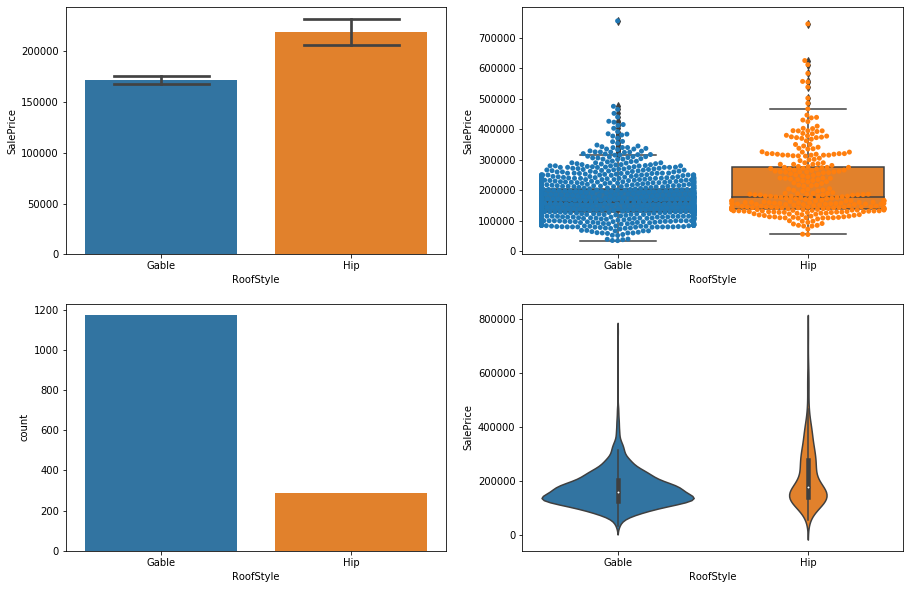

                    mean            std  median  count
RoofStyle                                             
Hip        218919.454861  111199.807123  177250    288
Gable      171583.739761   66259.227703  160000   1172
Due to absense ofnan in Train DataFrame, it was replaced with AsphShn


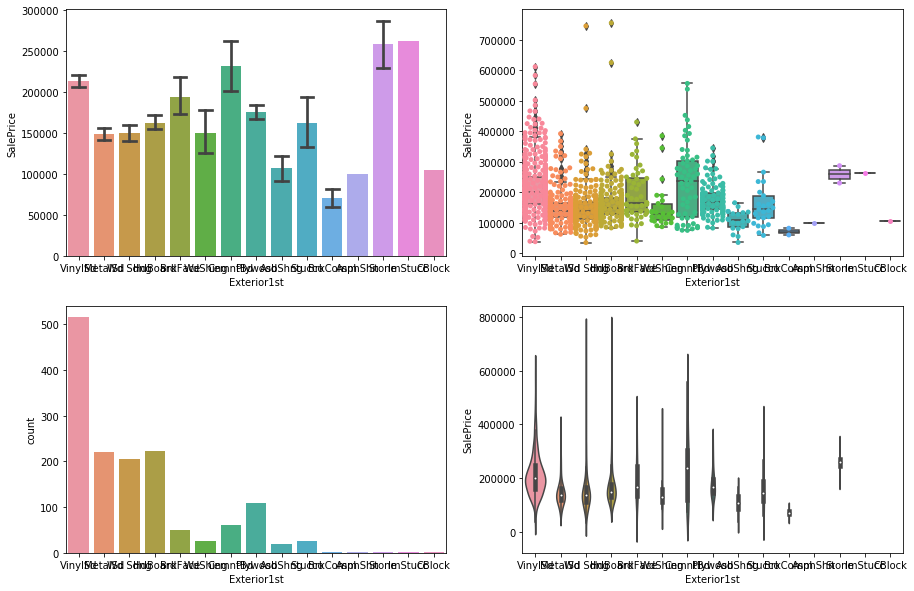

                      mean            std    median  count
Exterior1st                                               
ImStucc      262000.000000            NaN  262000.0      1
Stone        258500.000000   40305.086528  258500.0      2
CemntBd      231690.655738  120575.621318  236500.0     61
VinylSd      213732.900971   80646.975785  200000.0    515
BrkFace      194573.000000   82841.914370  165750.0     50
Plywood      175942.379630   49497.383293  167450.0    108
HdBoard      163077.450450   66305.714164  149900.0    222
Stucco       162990.000000   83307.246529  144000.0     25
WdShing      150655.076923   72507.530741  128700.0     26
Wd Sdng      149841.645631   71130.448152  138943.5    206
MetalSd      149422.177273   54776.408990  139000.0    220
AsbShng      107385.550000   33756.480660  108000.0     20
CBlock       105000.000000            NaN  105000.0      1
AsphShn      100000.000000            NaN  100000.0      1
BrkComm       71000.000000   15556.349186   71000.0     

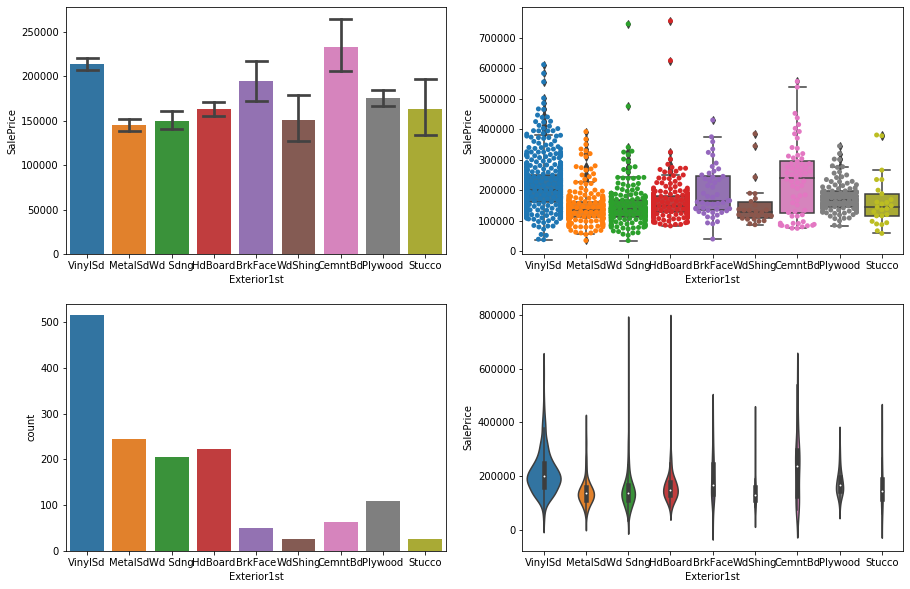

                      mean            std    median  count
Exterior1st                                               
CemntBd      233002.031250  117930.528678  238750.0     64
VinylSd      213732.900971   80646.975785  200000.0    515
BrkFace      194573.000000   82841.914370  165750.0     50
Plywood      175942.379630   49497.383293  167450.0    108
HdBoard      163077.450450   66305.714164  149900.0    222
Stucco       162990.000000   83307.246529  144000.0     25
WdShing      150655.076923   72507.530741  128700.0     26
Wd Sdng      149841.645631   71130.448152  138943.5    206
MetalSd      144949.139344   54665.751647  135730.0    244
After minimum count fixing, the final graph is:


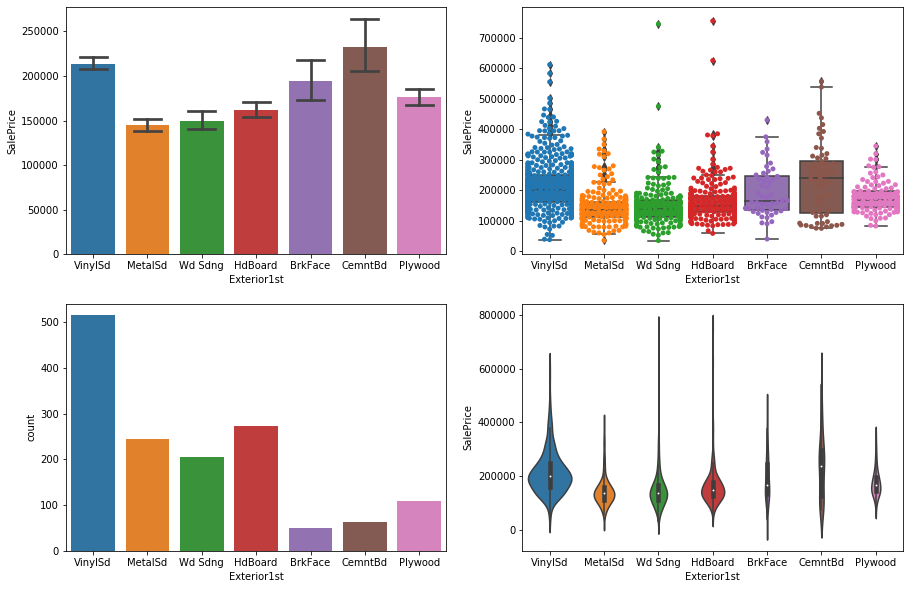

                      mean            std    median  count
Exterior1st                                               
CemntBd      233002.031250  117930.528678  238750.0     64
VinylSd      213732.900971   80646.975785  200000.0    515
BrkFace      194573.000000   82841.914370  165750.0     50
Plywood      175942.379630   49497.383293  167450.0    108
HdBoard      161886.358974   68417.939268  148000.0    273
Wd Sdng      149841.645631   71130.448152  138943.5    206
MetalSd      144949.139344   54665.751647  135730.0    244
Due to absense ofnan in Train DataFrame, it was replaced with CBlock


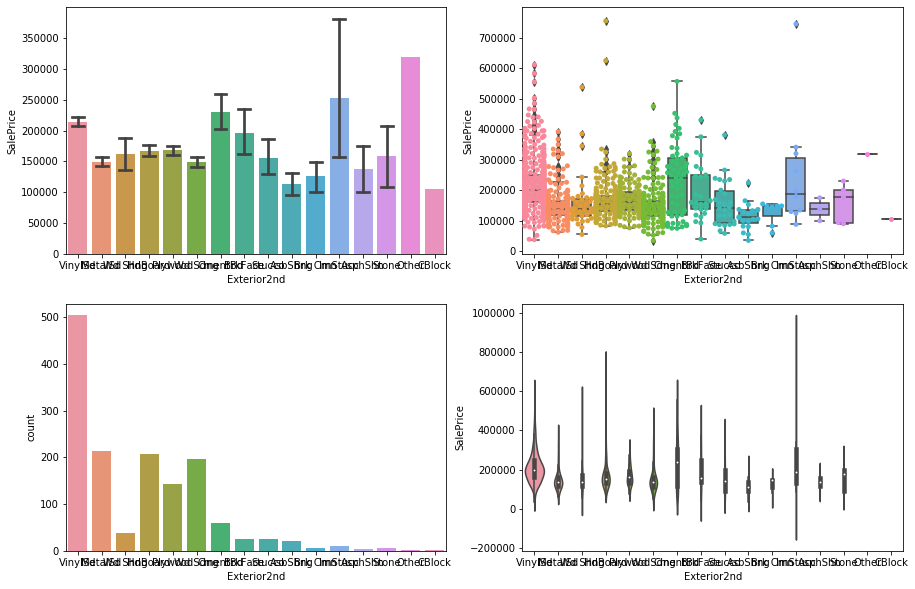

                      mean            std    median  count
Exterior2nd                                               
Other        319000.000000            NaN  319000.0      1
ImStucc      252070.000000  193176.672447  187600.0     10
CmentBd      230093.833333  116140.396221  238750.0     60
VinylSd      214432.460317   80708.309670  200070.5    504
BrkFace      195818.000000   95097.551756  160000.0     25
Plywood      168112.387324   46955.744372  160750.0    142
HdBoard      167661.565217   70061.078357  155000.0    207
Wd Shng      161328.947368   88974.217820  138225.0     38
Stone        158224.800000   63533.067573  177000.0      5
Stucco       155905.153846   74862.492410  142000.0     26
MetalSd      149803.172897   55078.595310  138750.0    214
Wd Sdng      148386.065990   59892.856640  138000.0    197
AsphShn      138000.000000   37509.998667  139000.0      3
Brk Cmn      126714.285714   38693.084161  147000.0      7
AsbShng      114060.550000   42315.043608  111000.0     

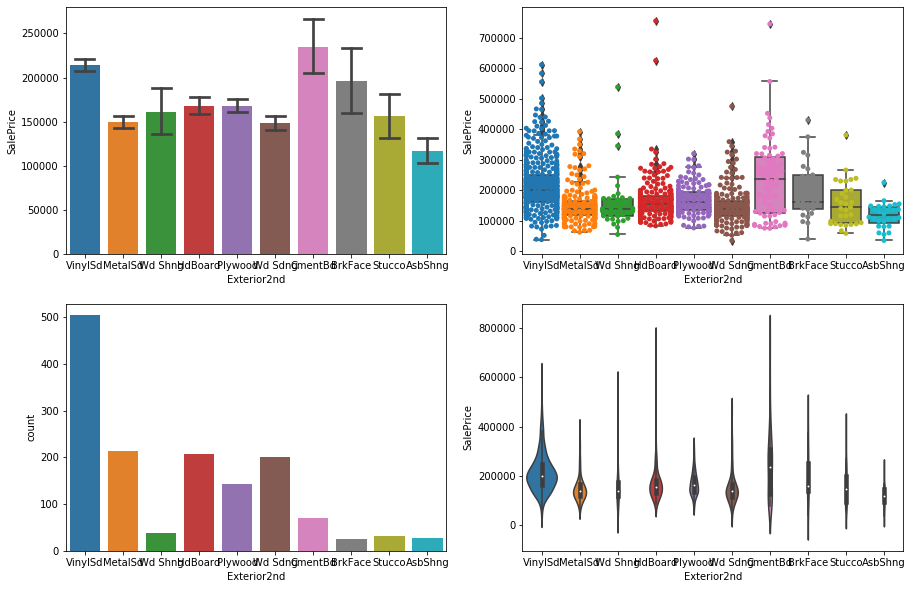

                      mean            std    median  count
Exterior2nd                                               
CmentBd      234441.267606  127787.427271  236500.0     71
VinylSd      214432.460317   80708.309670  200070.5    504
BrkFace      195818.000000   95097.551756  160000.0     25
Plywood      168112.387324   46955.744372  160750.0    142
HdBoard      167661.565217   70061.078357  155000.0    207
Wd Shng      161328.947368   88974.217820  138225.0     38
Stucco       156279.290323   72175.292730  144000.0     31
MetalSd      149803.172897   55078.595310  138750.0    214
Wd Sdng      148230.275000   59571.965479  138443.5    200
AsbShng      116900.392857   40359.828266  117250.0     28
After minimum count fixing, the final graph is:


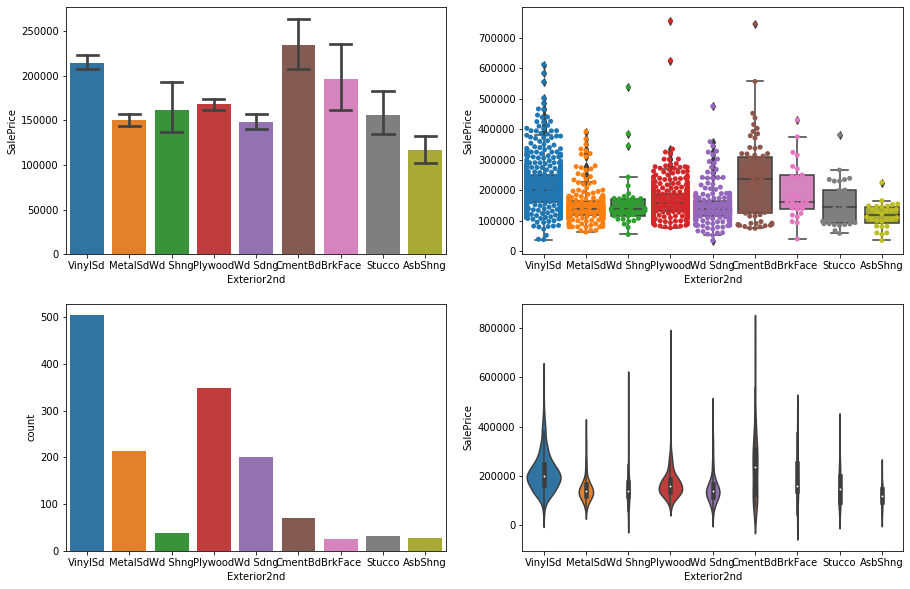

                      mean            std    median  count
Exterior2nd                                               
CmentBd      234441.267606  127787.427271  236500.0     71
VinylSd      214432.460317   80708.309670  200070.5    504
BrkFace      195818.000000   95097.551756  160000.0     25
Plywood      167844.994269   61636.263816  158000.0    349
Wd Shng      161328.947368   88974.217820  138225.0     38
Stucco       156279.290323   72175.292730  144000.0     31
MetalSd      149803.172897   55078.595310  138750.0    214
Wd Sdng      148230.275000   59571.965479  138443.5    200
AsbShng      116900.392857   40359.828266  117250.0     28


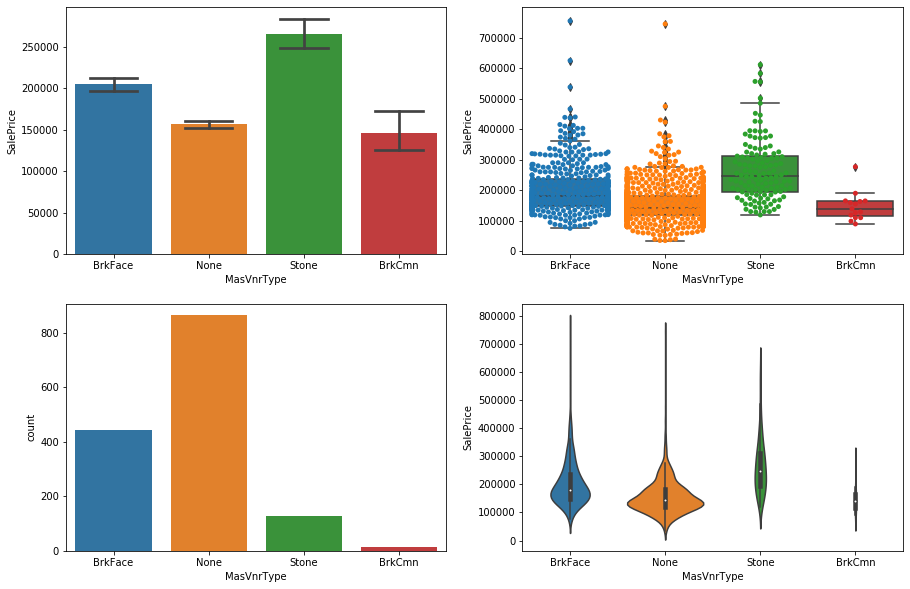

                     mean           std  median  count
MasVnrType                                            
Stone       265583.625000  99940.156577  246839    128
BrkFace     204691.871910  81214.293554  181000    445
None        156221.891204  60708.262798  143000    864
BrkCmn      146318.066667  46187.583632  139000     15
After minimum count fixing, the final graph is:


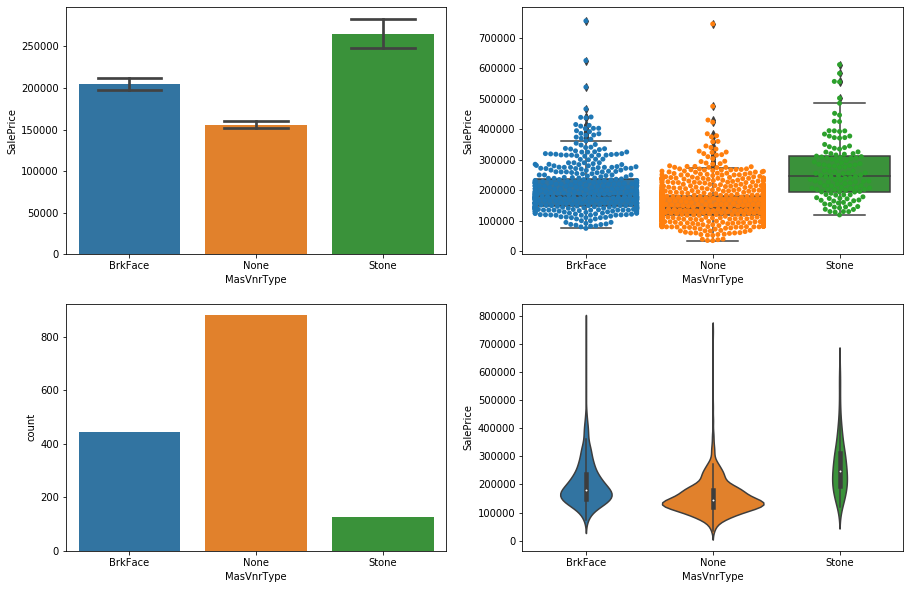

                     mean           std  median  count
MasVnrType                                            
Stone       265583.625000  99940.156577  246839    128
BrkFace     204691.871910  81214.293554  181000    445
None        156052.883959  60482.992268  143000    879
After minimum count fixing, the final graph is:


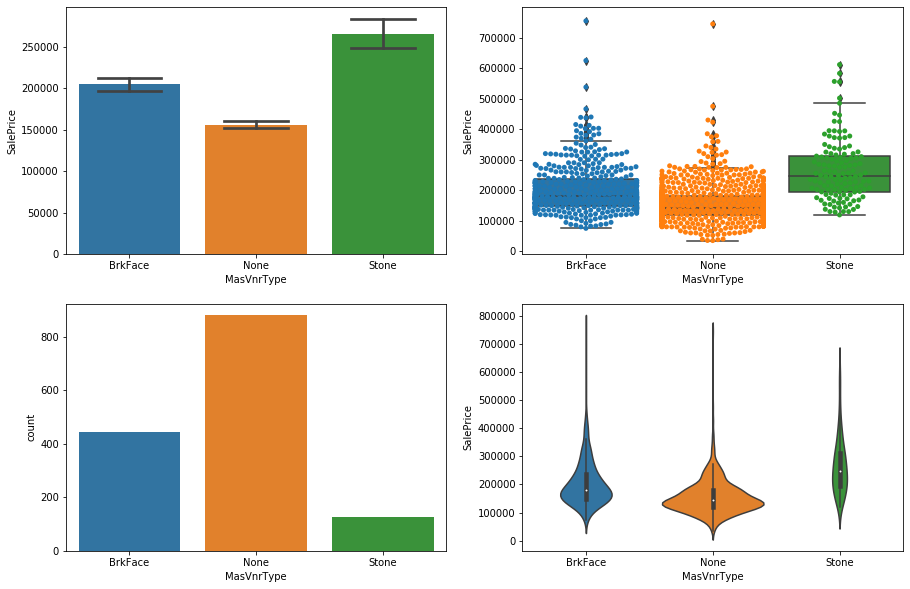

                     mean           std  median  count
MasVnrType                                            
Stone       265583.625000  99940.156577  246839    128
BrkFace     204691.871910  81214.293554  181000    445
None        156052.883959  60482.992268  143000    879


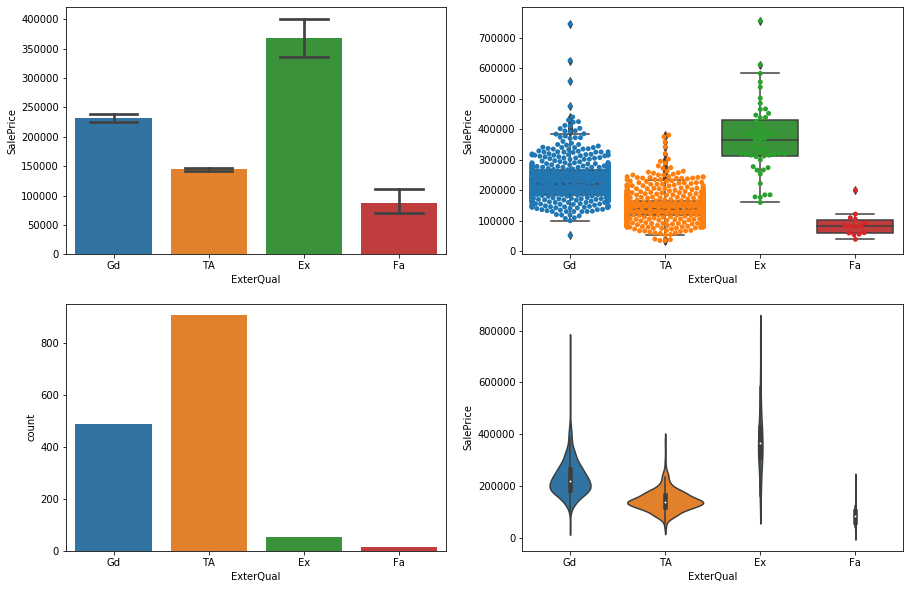

                    mean            std    median  count
ExterQual                                               
Ex         367360.961538  116401.264200  364606.5     52
Gd         231633.510246   71188.873899  220000.0    488
TA         144341.313466   42471.815703  139450.0    906
Fa          87985.214286   39826.918794   82250.0     14
After minimum count fixing, the final graph is:


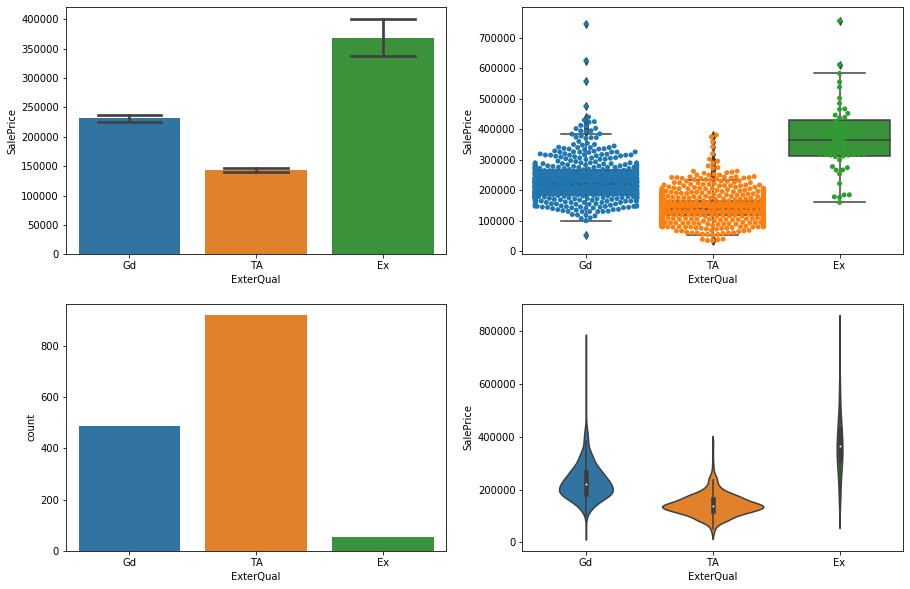

                    mean            std    median  count
ExterQual                                               
Ex         367360.961538  116401.264200  364606.5     52
Gd         231633.510246   71188.873899  220000.0    488
TA         143483.720652   42970.455567  139000.0    920
After minimum count fixing, the final graph is:


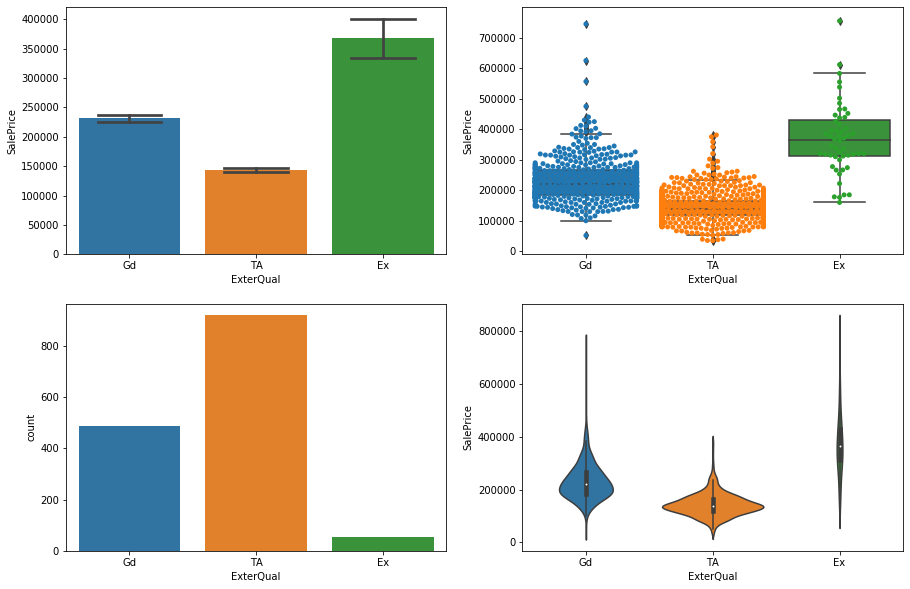

                    mean            std    median  count
ExterQual                                               
Ex         367360.961538  116401.264200  364606.5     52
Gd         231633.510246   71188.873899  220000.0    488
TA         143483.720652   42970.455567  139000.0    920


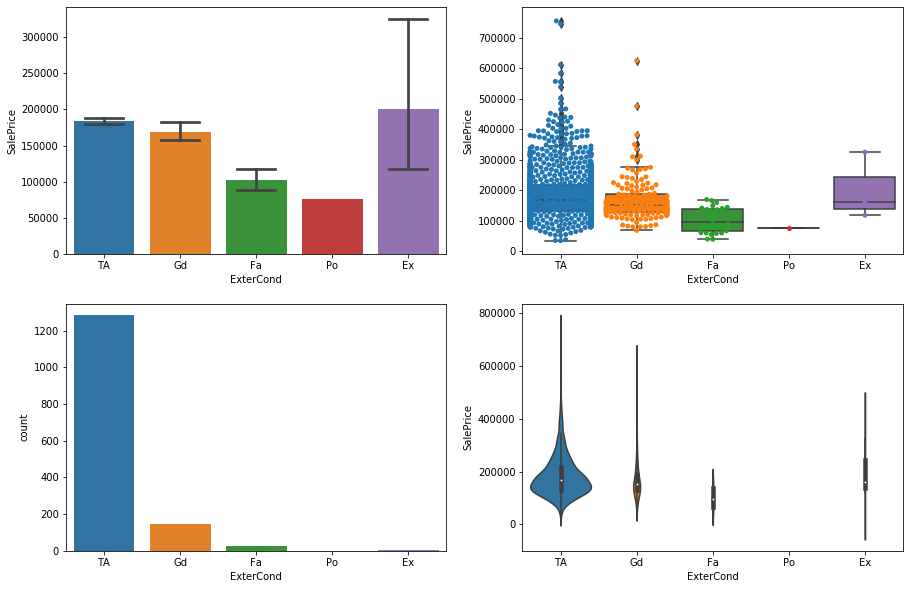

                    mean            std  median  count
ExterCond                                             
Ex         201333.333333  109235.220205  161000      3
TA         184034.896256   79806.257233  167370   1282
Gd         168897.568493   72608.303632  151250    146
Fa         102595.142857   40094.383940   95750     28
Po          76500.000000            NaN   76500      1
After minimum count fixing, the final graph is:


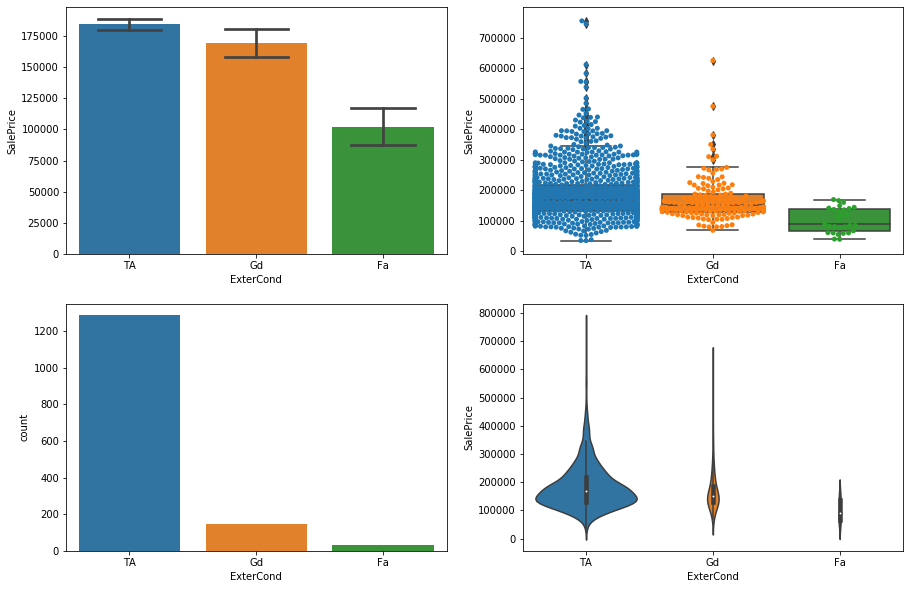

                    mean           std  median  count
ExterCond                                            
TA         184075.281712  79833.836611  167240   1285
Gd         168897.568493  72608.303632  151250    146
Fa         101695.310345  39668.980801   89500     29
After minimum count fixing, the final graph is:


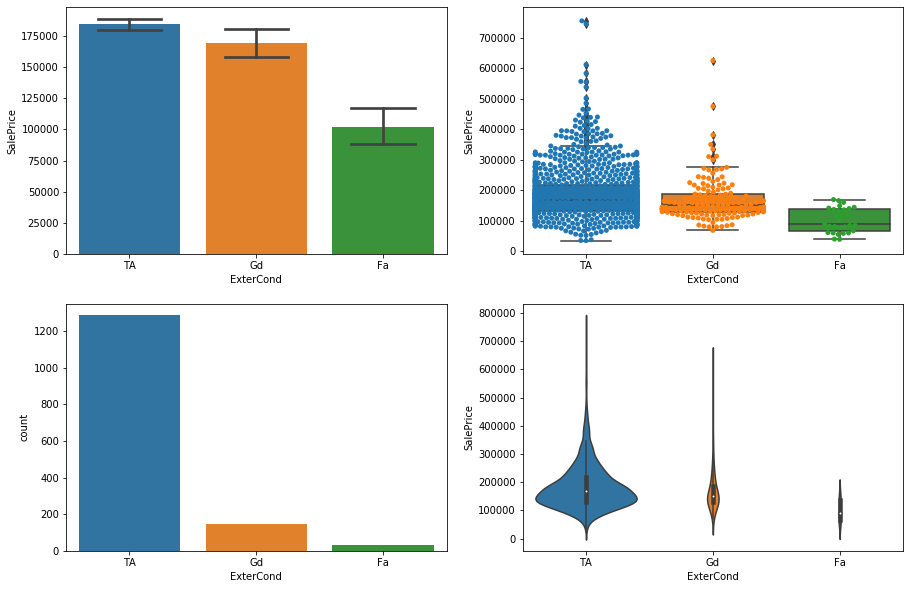

                    mean           std  median  count
ExterCond                                            
TA         184075.281712  79833.836611  167240   1285
Gd         168897.568493  72608.303632  151250    146
Fa         101695.310345  39668.980801   89500     29


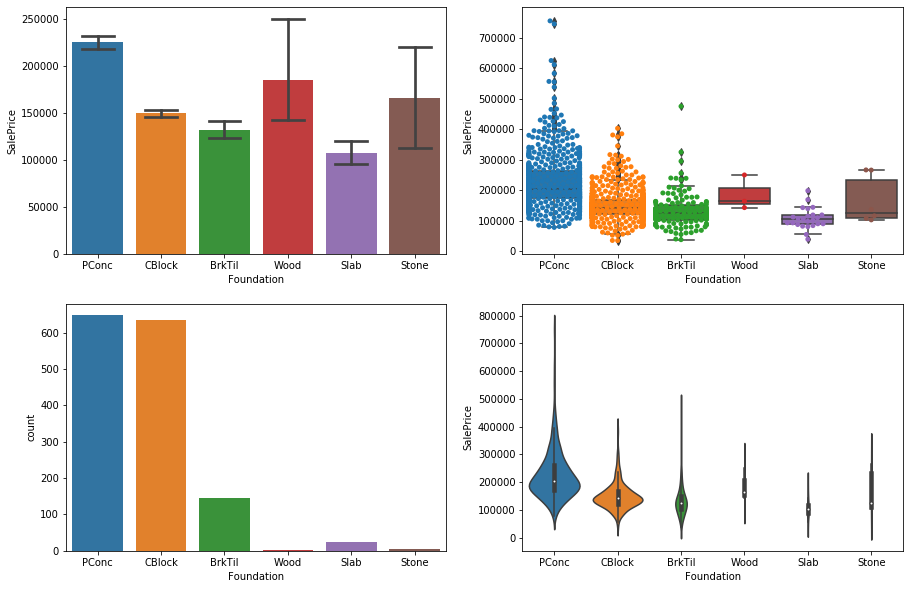

                     mean           std  median  count
Foundation                                            
PConc       225230.442040  86865.977283  205000    647
Wood        185666.666667  56695.090910  164000      3
Stone       165959.166667  78557.704413  126500      6
CBlock      149805.714511  48295.041759  141500    634
BrkTil      132291.075342  54592.393032  125250    146
Slab        107365.625000  34213.980939  104150     24
After minimum count fixing, the final graph is:


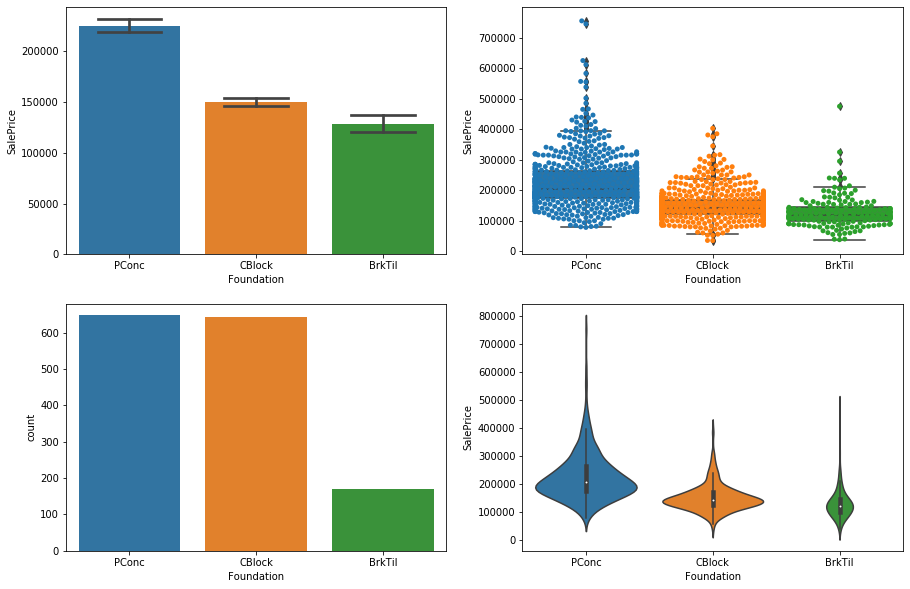

                     mean           std  median  count
Foundation                                            
PConc       225230.442040  86865.977283  205000    647
CBlock      150123.760498  48642.955286  142000    643
BrkTil      128772.188235  52841.009517  120000    170
After minimum count fixing, the final graph is:


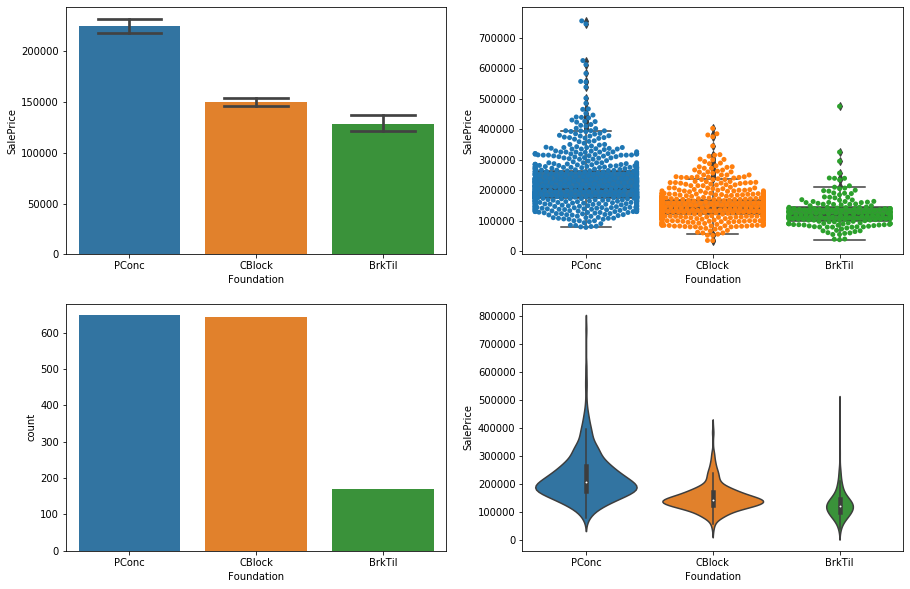

                     mean           std  median  count
Foundation                                            
PConc       225230.442040  86865.977283  205000    647
CBlock      150123.760498  48642.955286  142000    643
BrkTil      128772.188235  52841.009517  120000    170


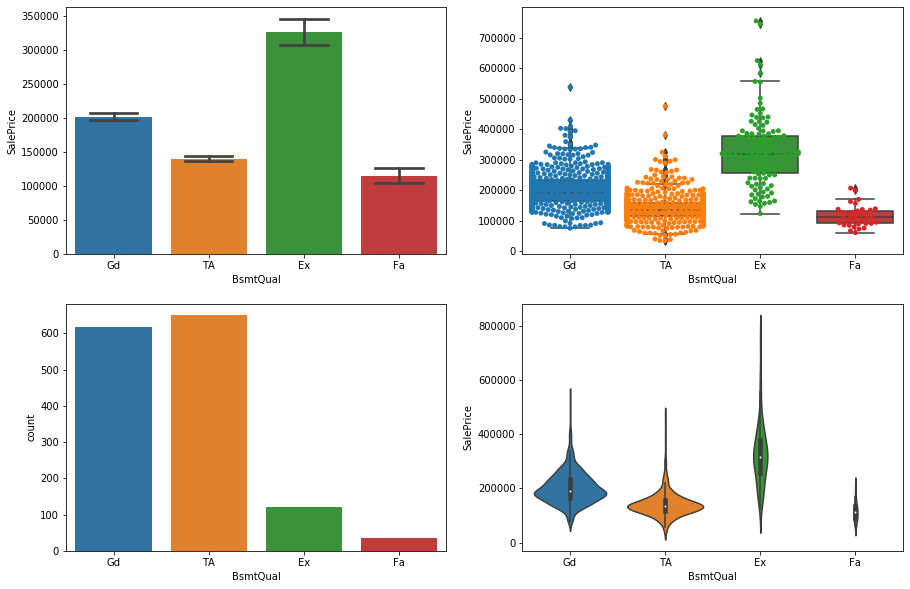

                   mean            std  median  count
BsmtQual                                             
Ex        327041.041322  113563.237392  318000    121
Gd        202688.478964   58092.364284  192070    618
TA        140759.818182   43483.265311  135500    649
Fa        115692.028571   34469.667278  112000     35
After minimum count fixing, the final graph is:


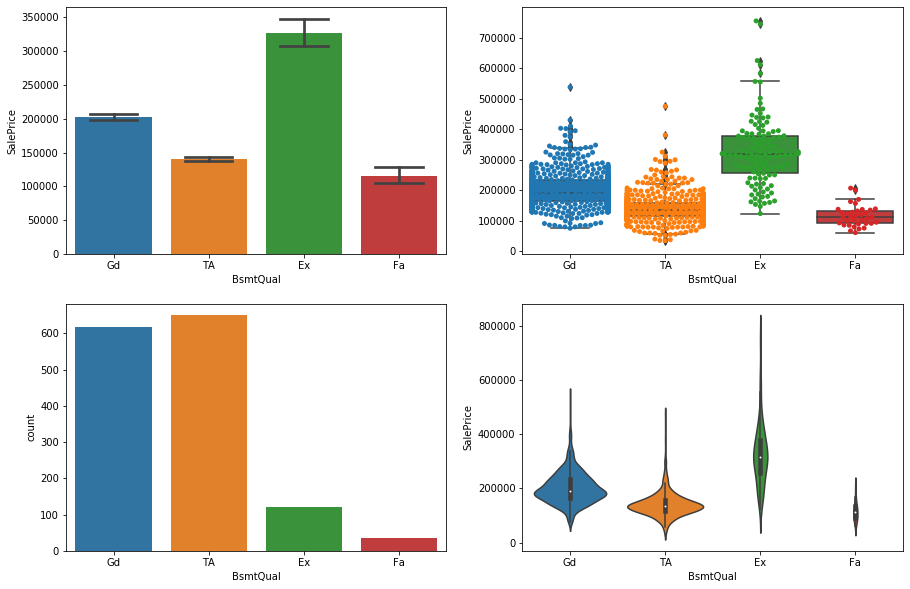

                   mean            std  median  count
BsmtQual                                             
Ex        327041.041322  113563.237392  318000    121
Gd        202688.478964   58092.364284  192070    618
TA        140759.818182   43483.265311  135500    649
Fa        115692.028571   34469.667278  112000     35
After minimum count fixing, the final graph is:


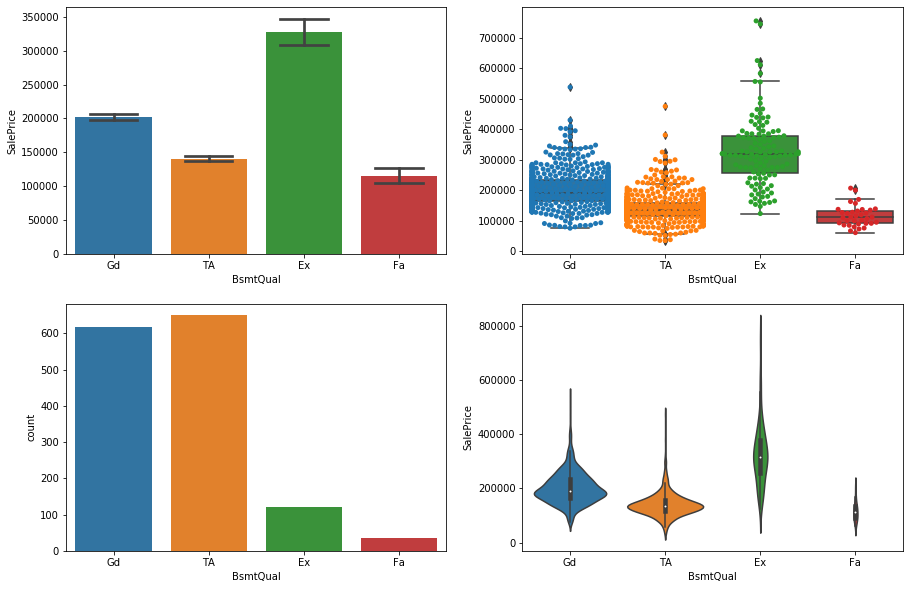

                   mean            std  median  count
BsmtQual                                             
Ex        327041.041322  113563.237392  318000    121
Gd        202688.478964   58092.364284  192070    618
TA        140759.818182   43483.265311  135500    649
Fa        115692.028571   34469.667278  112000     35


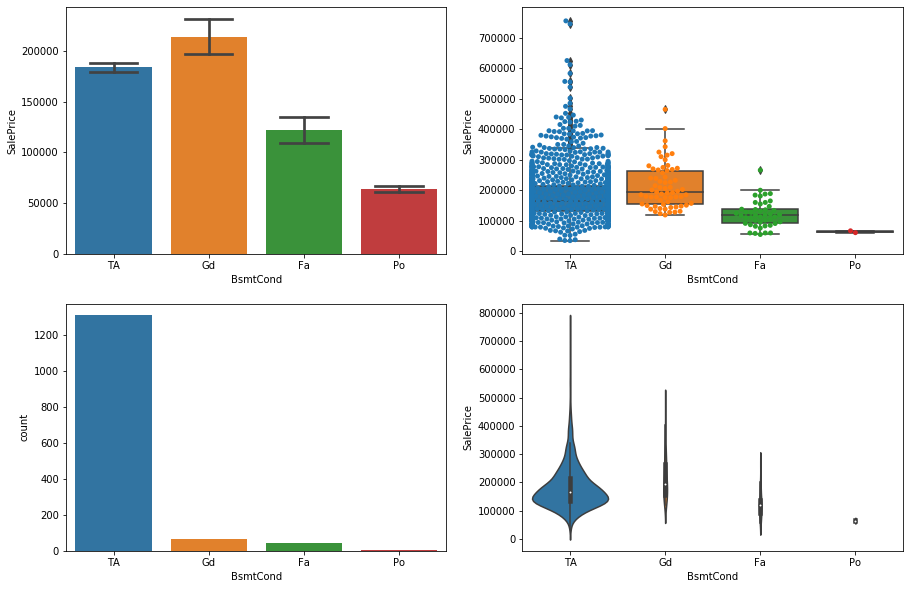

                   mean           std  median  count
BsmtCond                                            
Gd        213599.907692  72663.155026  193879     65
TA        183632.620900  79515.388449  165000   1311
Fa        121809.533333  43467.796975  118500     45
Po         64000.000000   4242.640687   64000      2
After minimum count fixing, the final graph is:


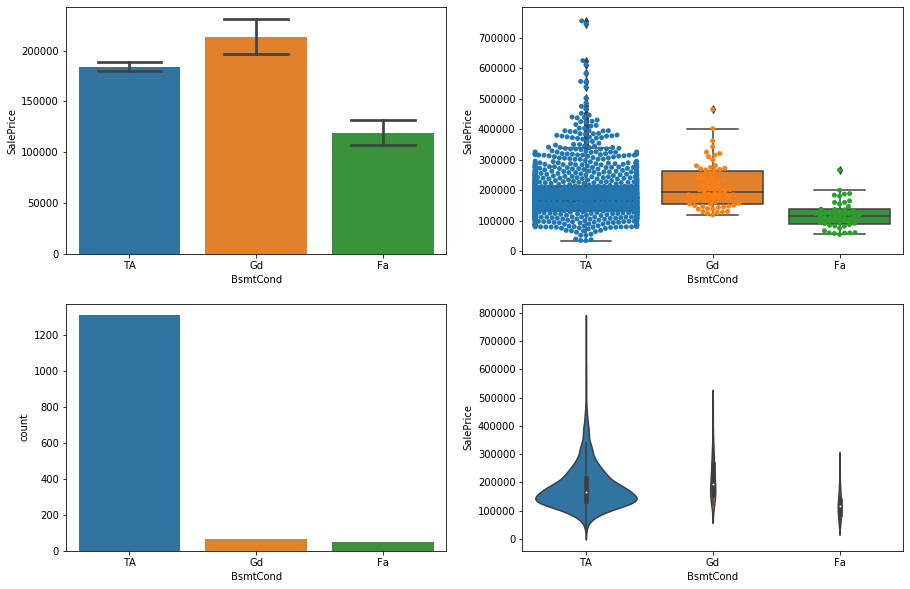

                   mean           std  median  count
BsmtCond                                            
Gd        213599.907692  72663.155026  193879     65
TA        183632.620900  79515.388449  165000   1311
Fa        119349.553191  44122.664030  117000     47
After minimum count fixing, the final graph is:


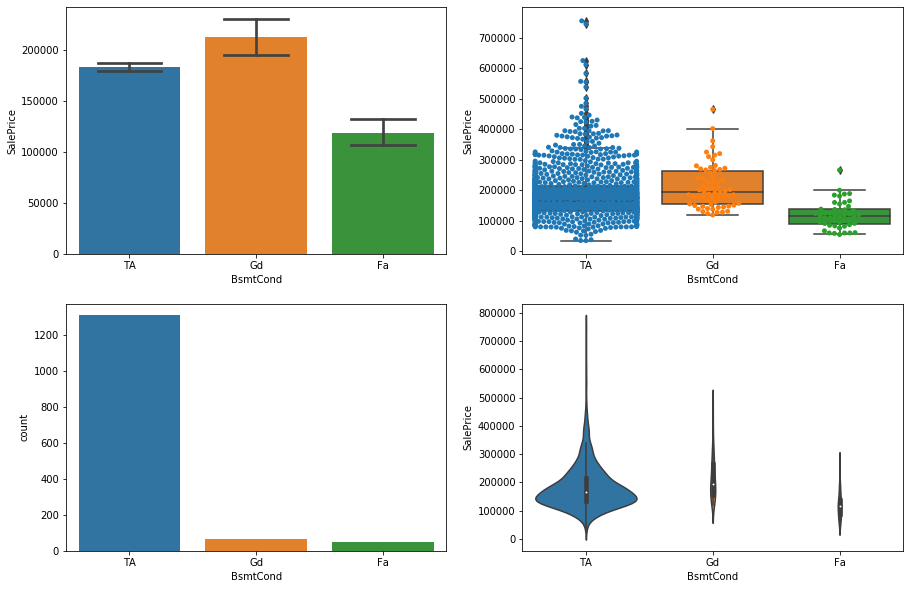

                   mean           std  median  count
BsmtCond                                            
Gd        213599.907692  72663.155026  193879     65
TA        183632.620900  79515.388449  165000   1311
Fa        119349.553191  44122.664030  117000     47


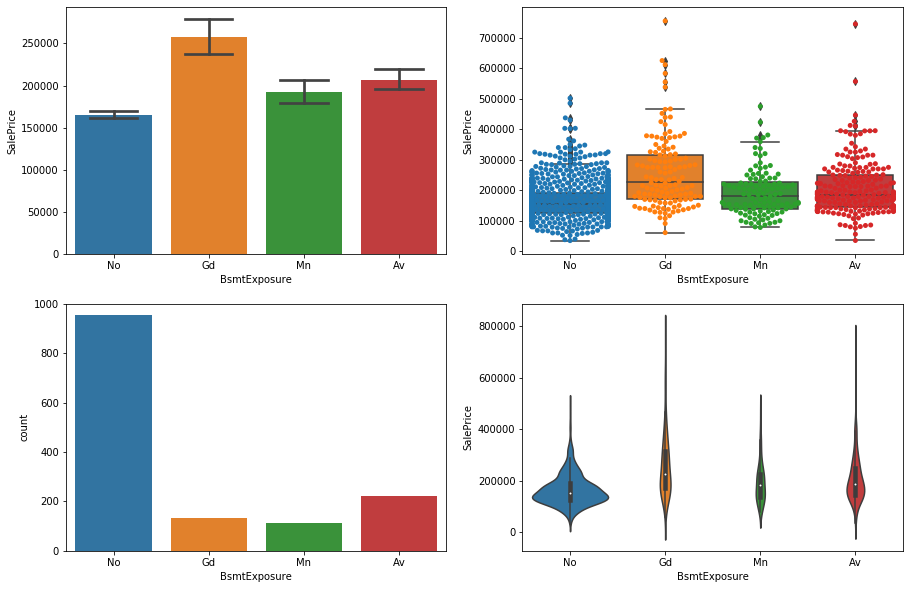

                       mean            std  median  count
BsmtExposure                                             
Gd            257689.805970  118923.672583  226975    134
Av            206643.420814   88655.504849  185850    221
Mn            192789.657895   77335.442652  182450    114
No            165652.295908   60695.724915  154000    953
After minimum count fixing, the final graph is:


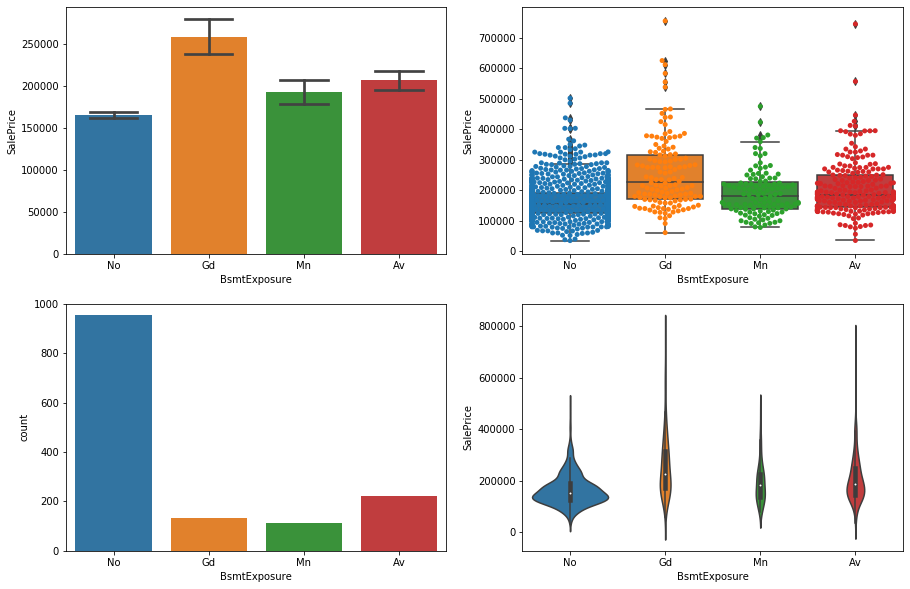

                       mean            std  median  count
BsmtExposure                                             
Gd            257689.805970  118923.672583  226975    134
Av            206643.420814   88655.504849  185850    221
Mn            192789.657895   77335.442652  182450    114
No            165652.295908   60695.724915  154000    953
After minimum count fixing, the final graph is:


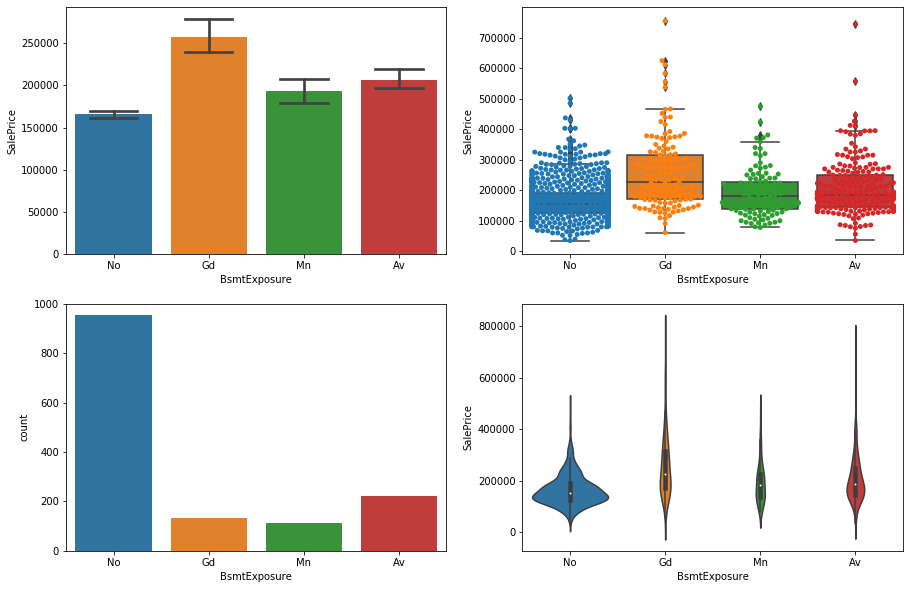

                       mean            std  median  count
BsmtExposure                                             
Gd            257689.805970  118923.672583  226975    134
Av            206643.420814   88655.504849  185850    221
Mn            192789.657895   77335.442652  182450    114
No            165652.295908   60695.724915  154000    953


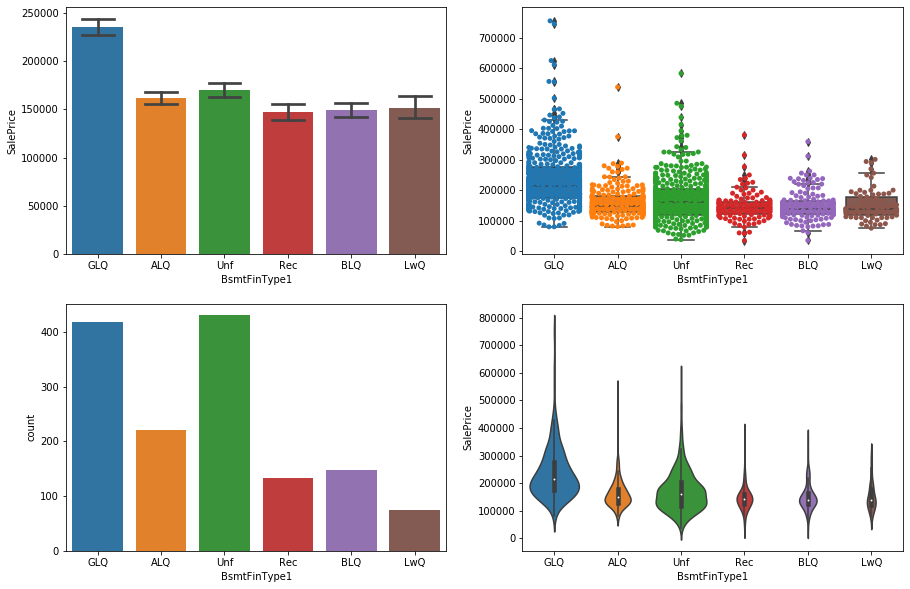

                       mean           std  median  count
BsmtFinType1                                            
GLQ           235413.720096  93215.613258  213750    418
Unf           170670.576744  72577.080129  161750    430
ALQ           161573.068182  50821.277231  149250    220
LwQ           151852.702703  50796.987083  139000     74
BLQ           149493.655405  47327.292126  139100    148
Rec           146889.248120  45190.118879  142000    133
After minimum count fixing, the final graph is:


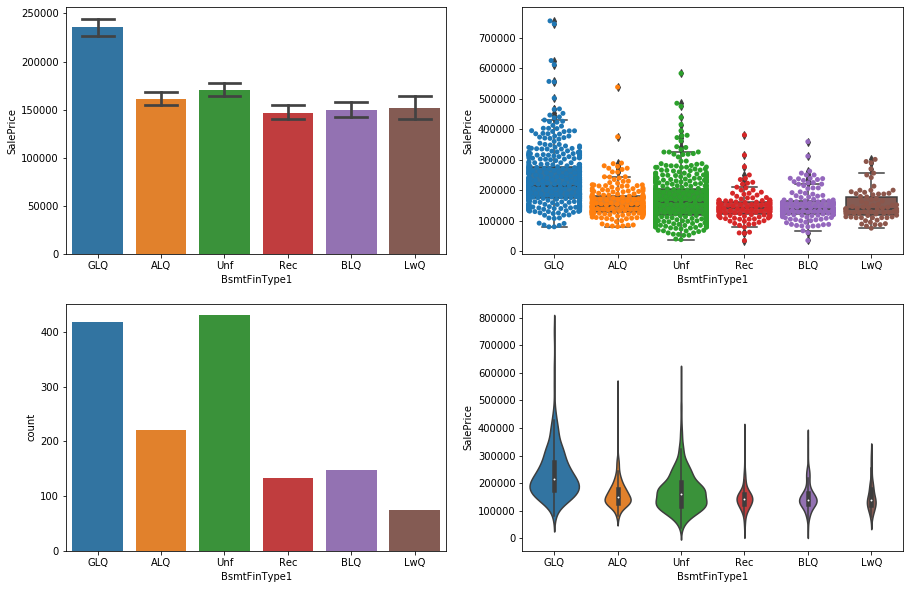

                       mean           std  median  count
BsmtFinType1                                            
GLQ           235413.720096  93215.613258  213750    418
Unf           170670.576744  72577.080129  161750    430
ALQ           161573.068182  50821.277231  149250    220
LwQ           151852.702703  50796.987083  139000     74
BLQ           149493.655405  47327.292126  139100    148
Rec           146889.248120  45190.118879  142000    133
After minimum count fixing, the final graph is:


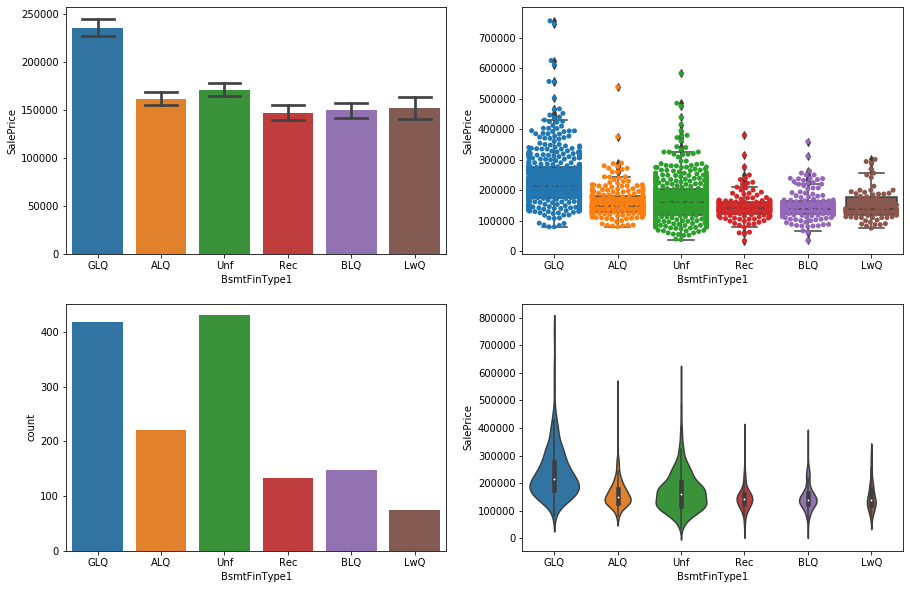

                       mean           std  median  count
BsmtFinType1                                            
GLQ           235413.720096  93215.613258  213750    418
Unf           170670.576744  72577.080129  161750    430
ALQ           161573.068182  50821.277231  149250    220
LwQ           151852.702703  50796.987083  139000     74
BLQ           149493.655405  47327.292126  139100    148
Rec           146889.248120  45190.118879  142000    133


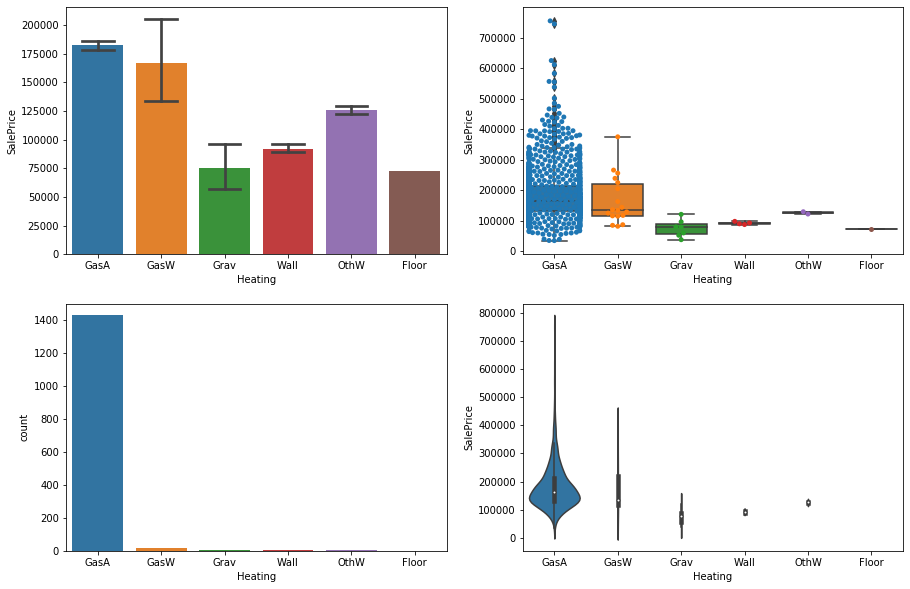

                  mean           std  median  count
Heating                                            
GasA     182021.195378  79262.873587  164500   1428
GasW     166632.166667  78547.575324  134950     18
OthW     125750.000000   5303.300859  125750      2
Wall      92100.000000   4509.988914   91450      4
Grav      75271.428571  28066.570524   79000      7
Floor     72500.000000           NaN   72500      1
After minimum count fixing, the final graph is:


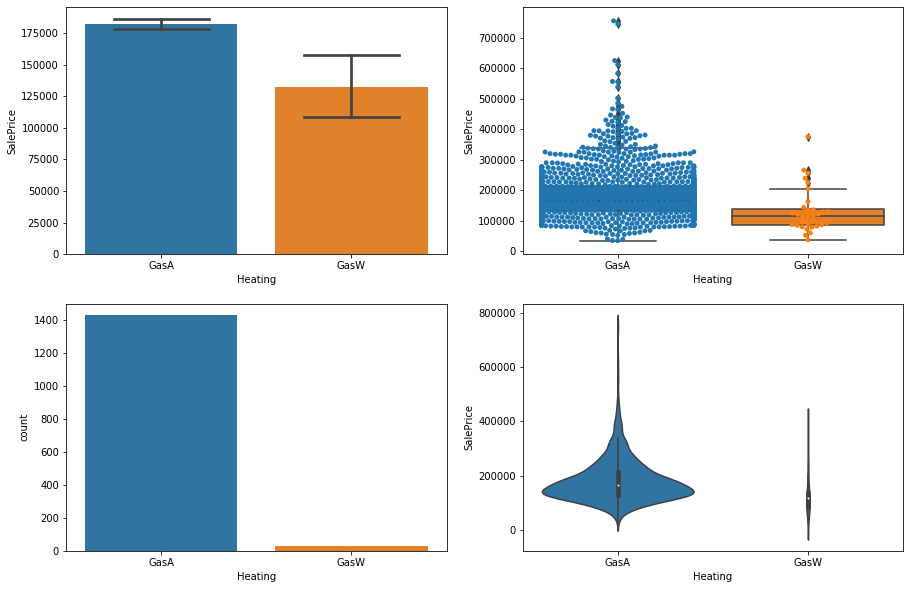

                  mean           std  median  count
Heating                                            
GasA     182021.195378  79262.873587  164500   1428
GasW     131833.718750  72690.731907  116750     32
After minimum count fixing, the final graph is:


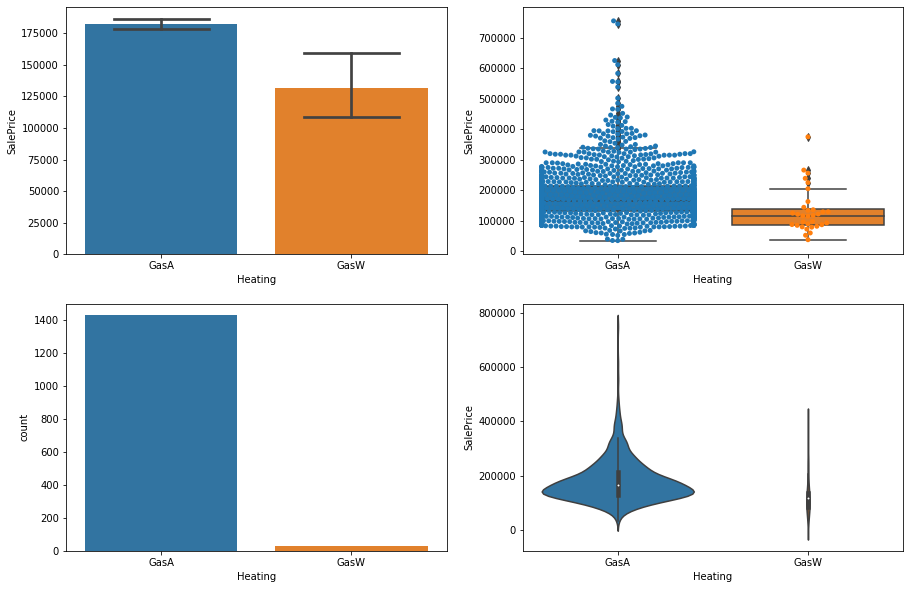

                  mean           std  median  count
Heating                                            
GasA     182021.195378  79262.873587  164500   1428
GasW     131833.718750  72690.731907  116750     32


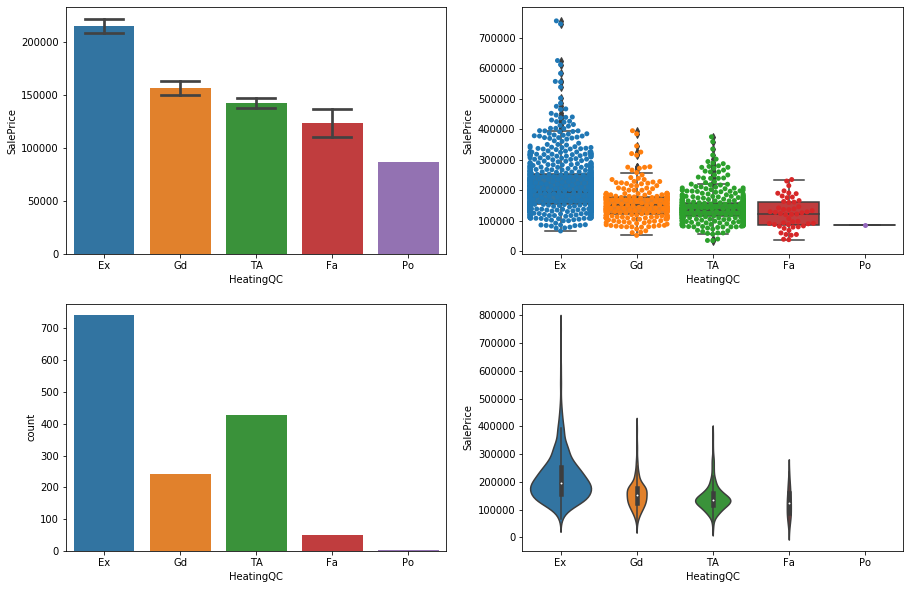

                    mean           std  median  count
HeatingQC                                            
Ex         214914.429150  87469.704503  194700    741
Gd         156858.871369  52923.920003  152000    241
TA         142362.876168  47226.485663  135000    428
Fa         123919.489796  50306.618996  123500     49
Po          87000.000000           NaN   87000      1
After minimum count fixing, the final graph is:


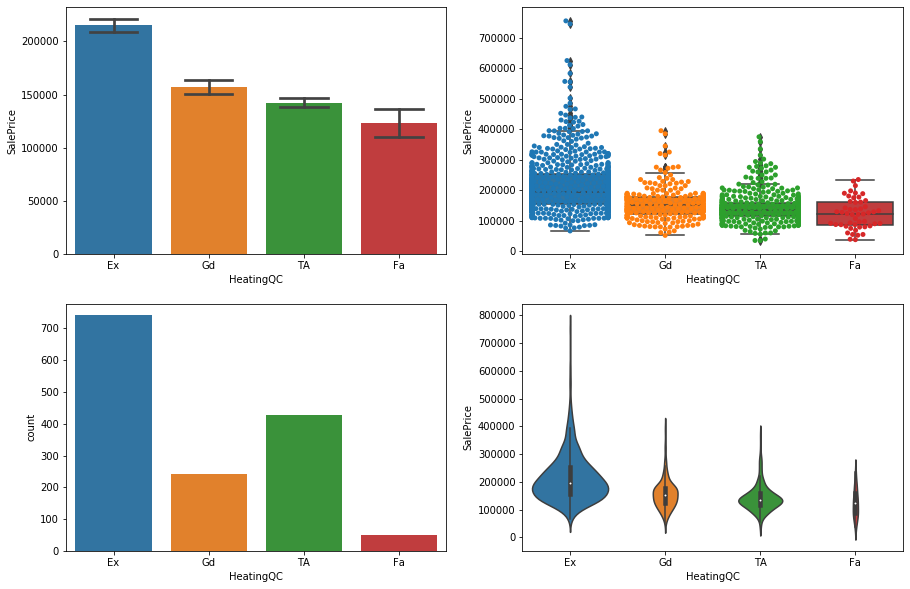

                    mean           std  median  count
HeatingQC                                            
Ex         214914.429150  87469.704503  194700    741
Gd         156858.871369  52923.920003  152000    241
TA         142362.876168  47226.485663  135000    428
Fa         123181.100000  50063.647585  122750     50
After minimum count fixing, the final graph is:


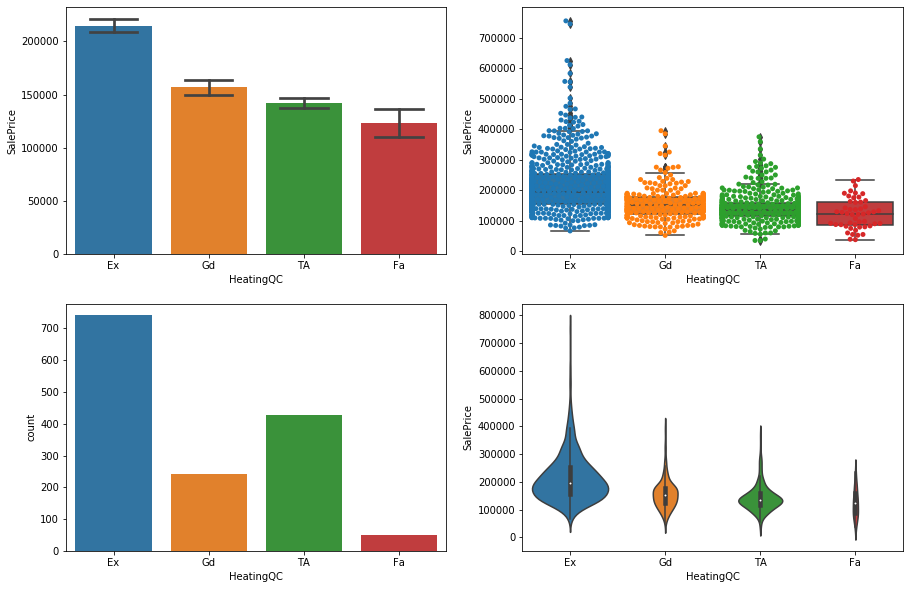

                    mean           std  median  count
HeatingQC                                            
Ex         214914.429150  87469.704503  194700    741
Gd         156858.871369  52923.920003  152000    241
TA         142362.876168  47226.485663  135000    428
Fa         123181.100000  50063.647585  122750     50


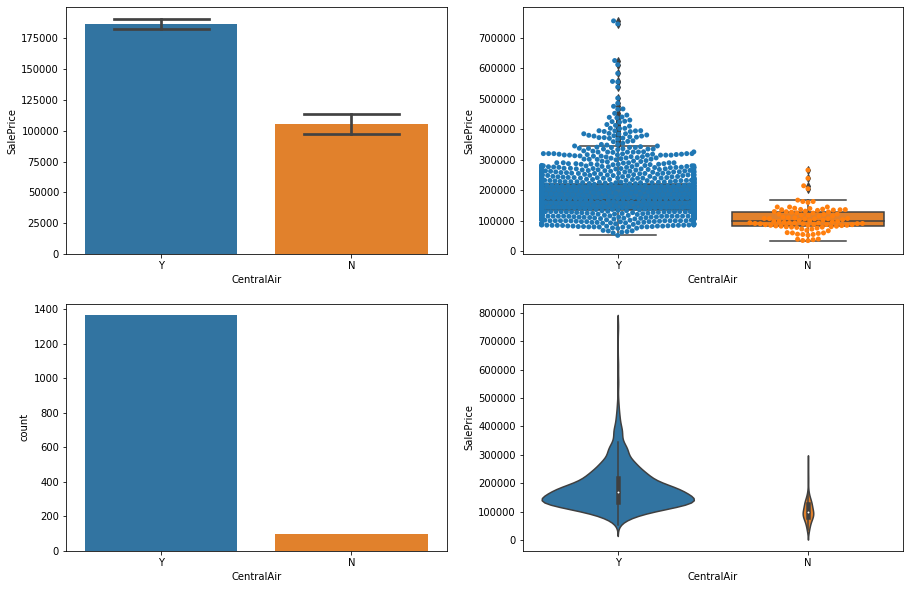

                     mean           std  median  count
CentralAir                                            
Y           186186.709890  78805.206820  168000   1365
N           105264.073684  40671.273961   98000     95
After minimum count fixing, the final graph is:


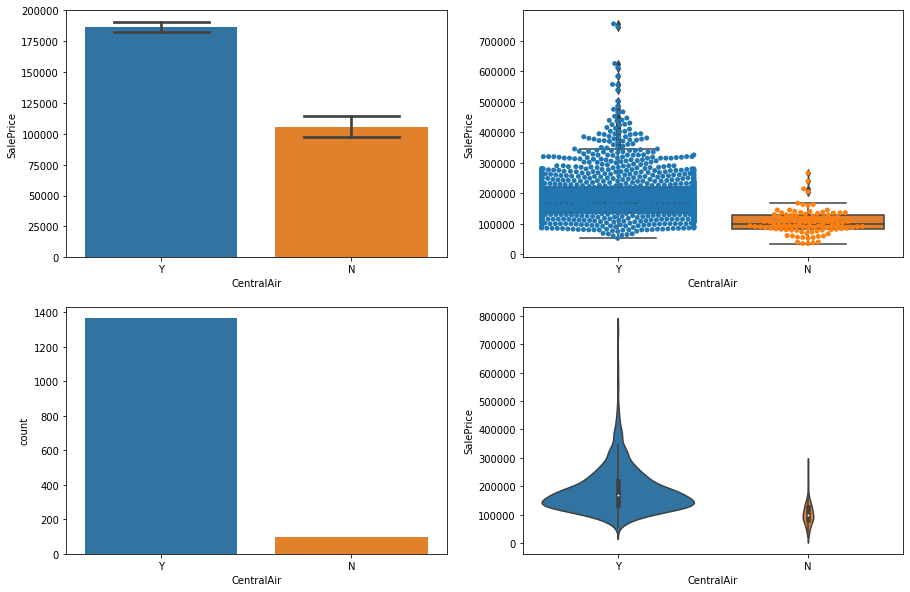

                     mean           std  median  count
CentralAir                                            
Y           186186.709890  78805.206820  168000   1365
N           105264.073684  40671.273961   98000     95
After minimum count fixing, the final graph is:


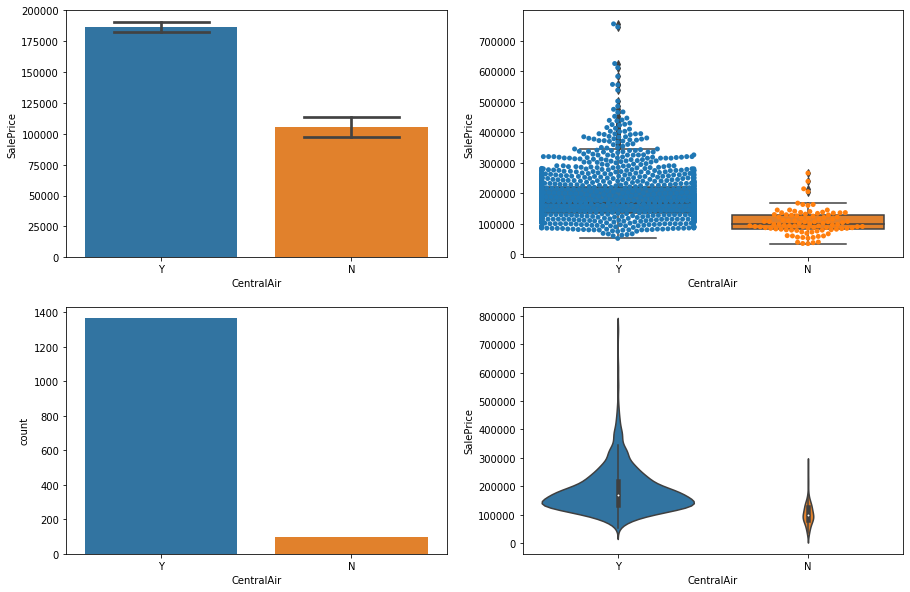

                     mean           std  median  count
CentralAir                                            
Y           186186.709890  78805.206820  168000   1365
N           105264.073684  40671.273961   98000     95


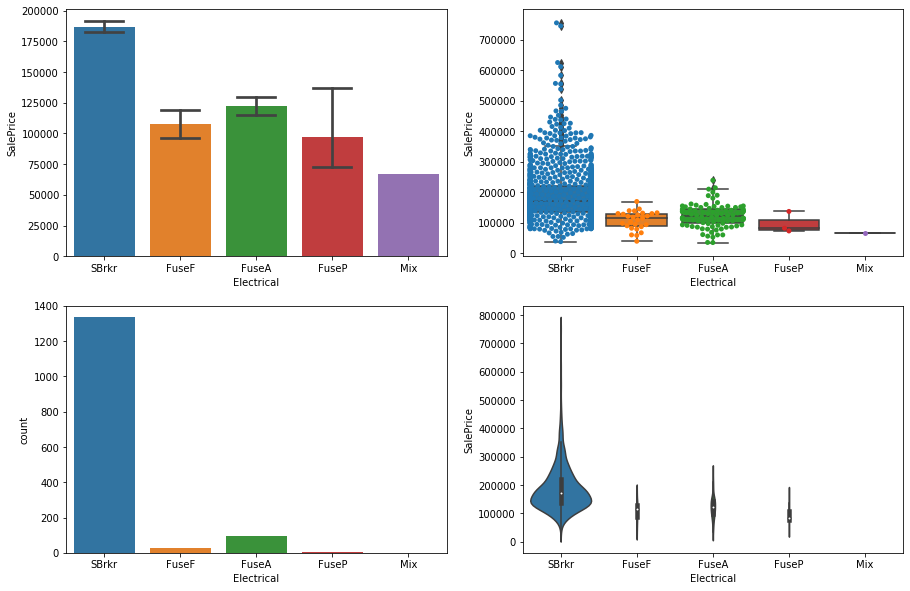

                     mean           std  median  count
Electrical                                            
SBrkr       186825.113193  79856.458326  170000   1334
FuseA       122196.893617  37511.376615  121250     94
FuseF       107675.444444  30636.507376  115000     27
FuseP        97333.333333  34645.827070   82000      3
Mix          67000.000000           NaN   67000      1
After minimum count fixing, the final graph is:


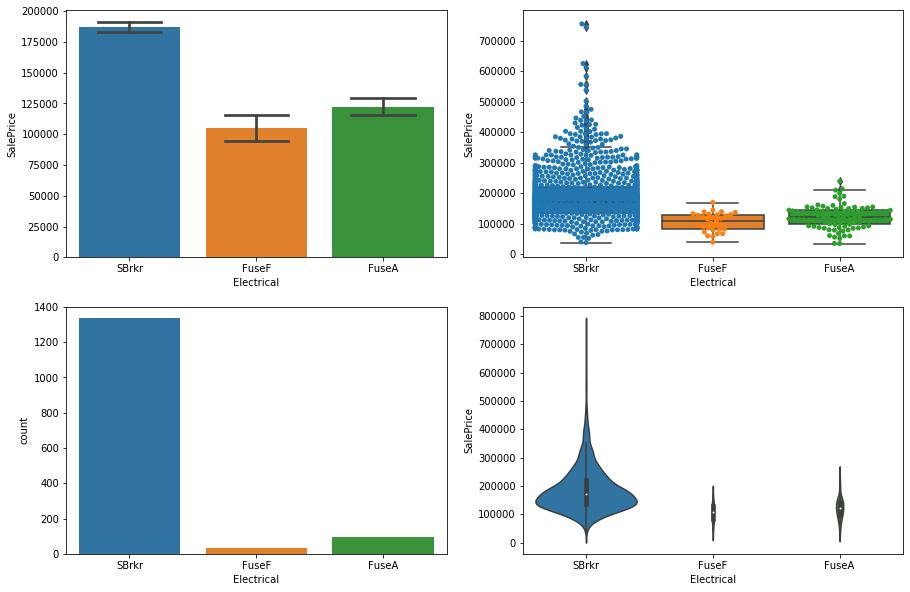

                     mean           std  median  count
Electrical                                            
SBrkr       186825.113193  79856.458326  170000   1334
FuseA       122196.893617  37511.376615  121250     94
FuseF       105362.483871  30883.478883  109500     31
After minimum count fixing, the final graph is:


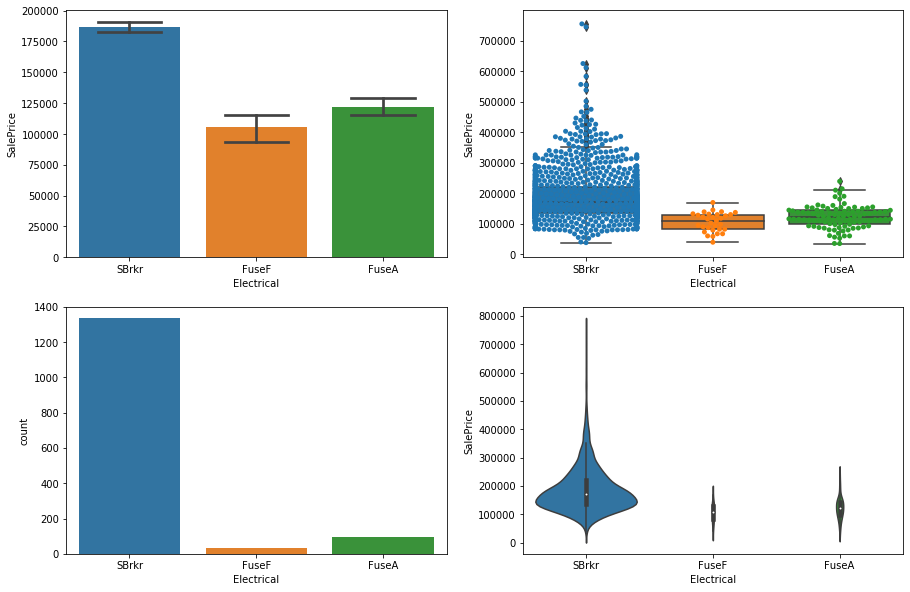

                     mean           std  median  count
Electrical                                            
SBrkr       186825.113193  79856.458326  170000   1334
FuseA       122196.893617  37511.376615  121250     94
FuseF       105362.483871  30883.478883  109500     31
Due to absense ofnan in Train DataFrame, it was replaced with Fa


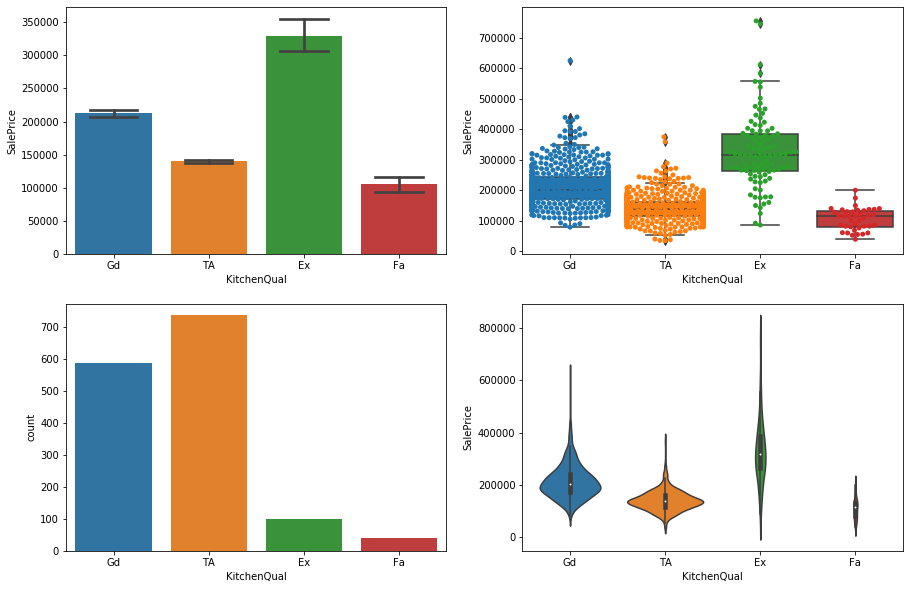

                      mean            std  median  count
KitchenQual                                             
Ex           328554.670000  120862.942573  316750    100
Gd           212116.023891   64020.176702  201400    586
TA           139962.511565   38896.280336  137000    735
Fa           105565.205128   36004.254037  115000     39
After minimum count fixing, the final graph is:


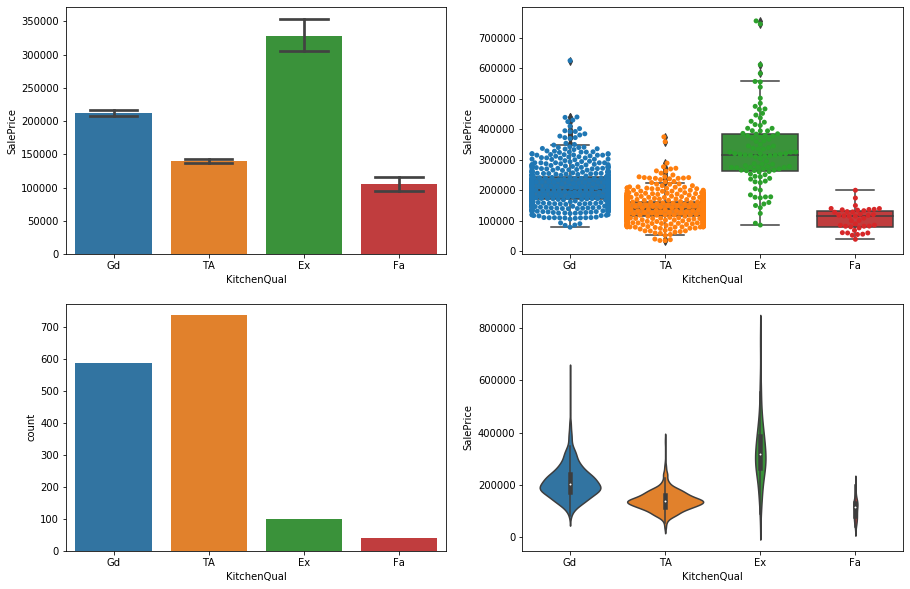

                      mean            std  median  count
KitchenQual                                             
Ex           328554.670000  120862.942573  316750    100
Gd           212116.023891   64020.176702  201400    586
TA           139962.511565   38896.280336  137000    735
Fa           105565.205128   36004.254037  115000     39
After minimum count fixing, the final graph is:


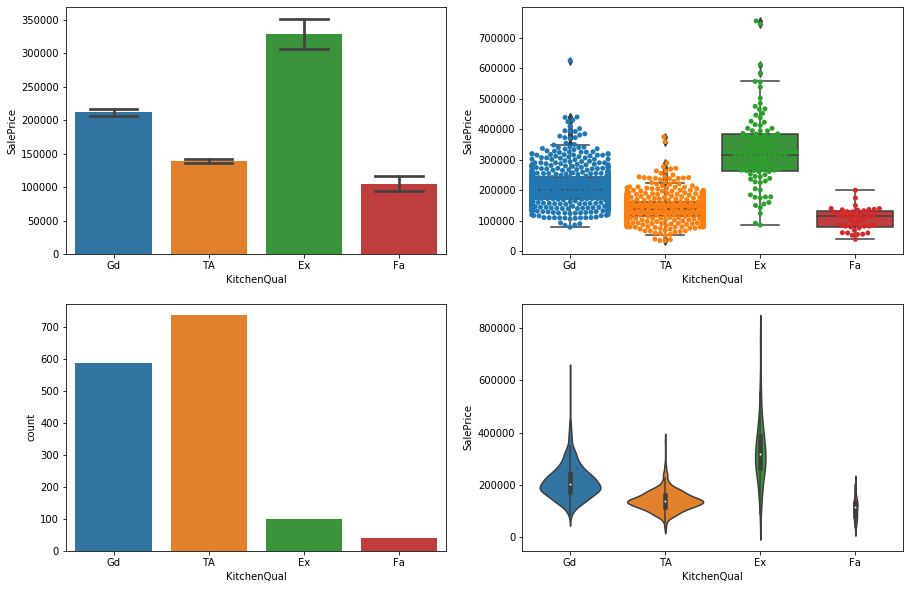

                      mean            std  median  count
KitchenQual                                             
Ex           328554.670000  120862.942573  316750    100
Gd           212116.023891   64020.176702  201400    586
TA           139962.511565   38896.280336  137000    735
Fa           105565.205128   36004.254037  115000     39
Due to absense ofnan in Train DataFrame, it was replaced with Sev


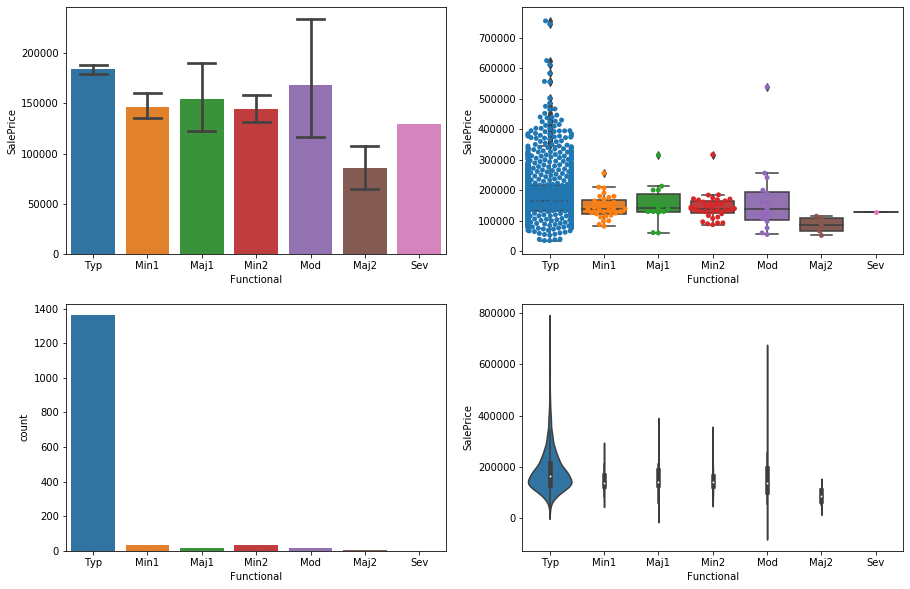

                     mean            std  median  count
Functional                                             
Typ         183429.147059   80017.959658  165500   1360
Mod         168393.333333  118938.666467  137900     15
Maj1        153948.142857   64503.775815  140750     14
Min1        146385.483871   38089.572487  139000     31
Min2        144240.647059   41215.354652  140000     34
Sev         129000.000000            NaN  129000      1
Maj2         85800.000000   27086.897201   85000      5
After minimum count fixing, the final graph is:


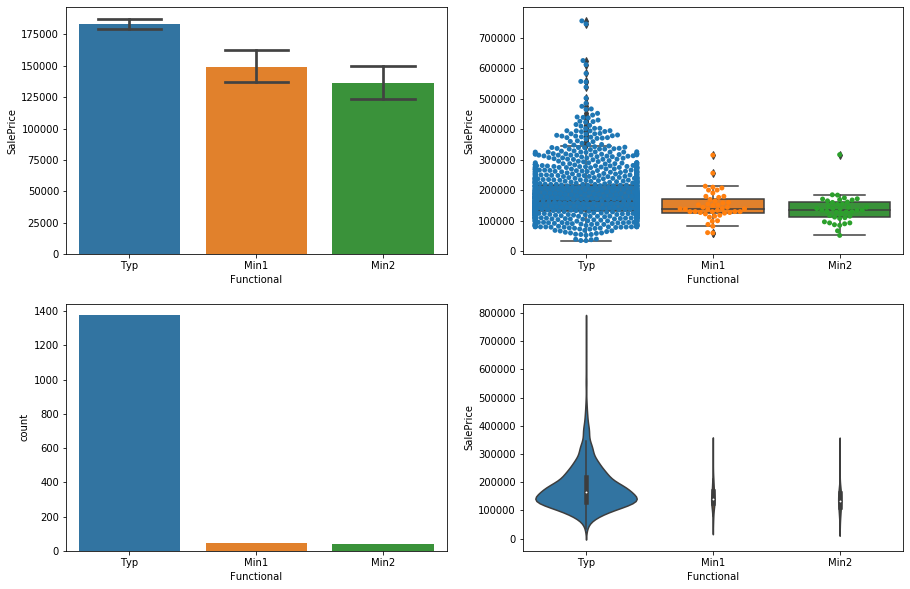

                     mean           std  median  count
Functional                                            
Typ         183265.120000  80495.686943  165000   1375
Min1        148738.311111  47233.859852  139000     45
Min2        136554.550000  43541.274287  135000     40
After minimum count fixing, the final graph is:


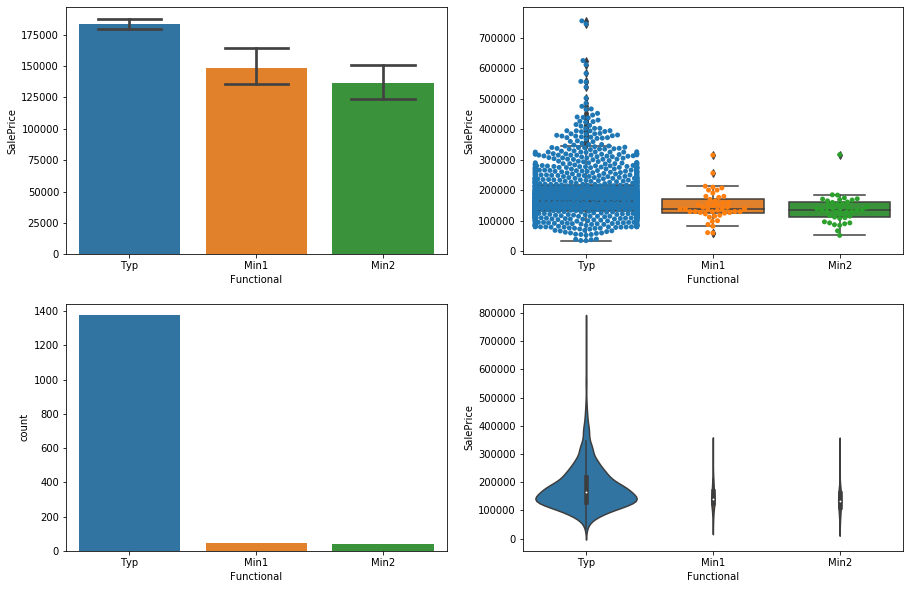

                     mean           std  median  count
Functional                                            
Typ         183265.120000  80495.686943  165000   1375
Min1        148738.311111  47233.859852  139000     45
Min2        136554.550000  43541.274287  135000     40
The categorical variables started with integers. Enter non digit initials ending with _  D_


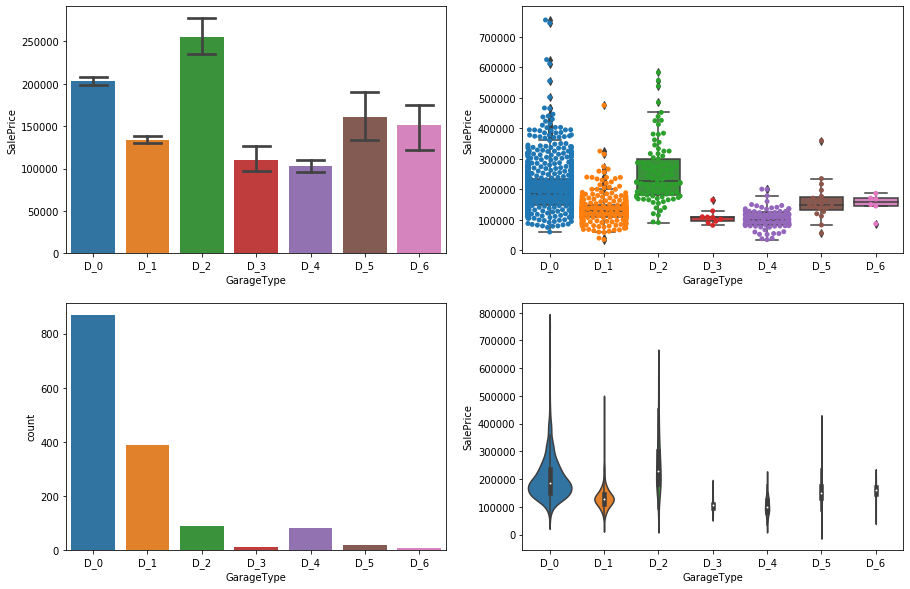

                     mean            std  median  count
GarageType                                             
D_2         254751.738636  102230.854394  227500     88
D_0         202892.656322   77146.621778  185000    870
D_5         160570.684211   63967.283574  148000     19
D_6         151283.333333   34917.068415  159000      6
D_1         134091.162791   41391.549953  129500    387
D_3         109962.111111   24638.183681  108000      9
D_4         103317.283951   32815.023389  100000     81
After minimum count fixing, the final graph is:


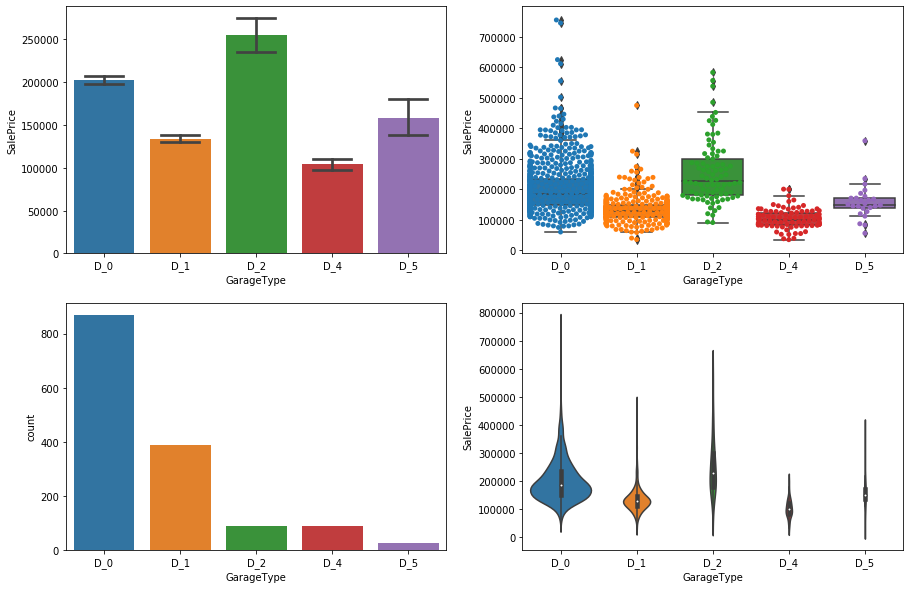

                     mean            std  median  count
GarageType                                             
D_2         254751.738636  102230.854394  227500     88
D_0         202892.656322   77146.621778  185000    870
D_5         158341.720000   57786.233667  150000     25
D_1         134091.162791   41391.549953  129500    387
D_4         103981.766667   32039.306400  100900     90
After minimum count fixing, the final graph is:


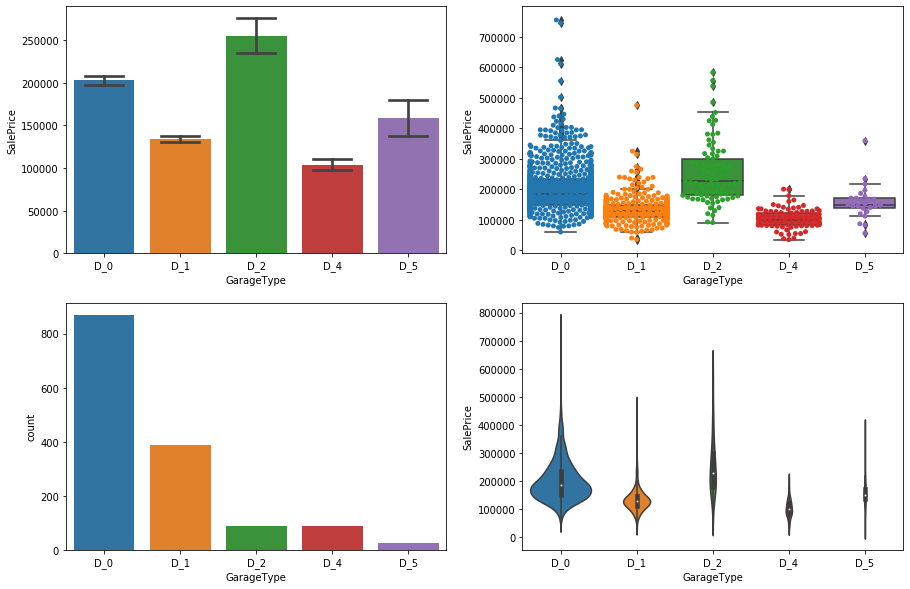

                     mean            std  median  count
GarageType                                             
D_2         254751.738636  102230.854394  227500     88
D_0         202892.656322   77146.621778  185000    870
D_5         158341.720000   57786.233667  150000     25
D_1         134091.162791   41391.549953  129500    387
D_4         103981.766667   32039.306400  100900     90


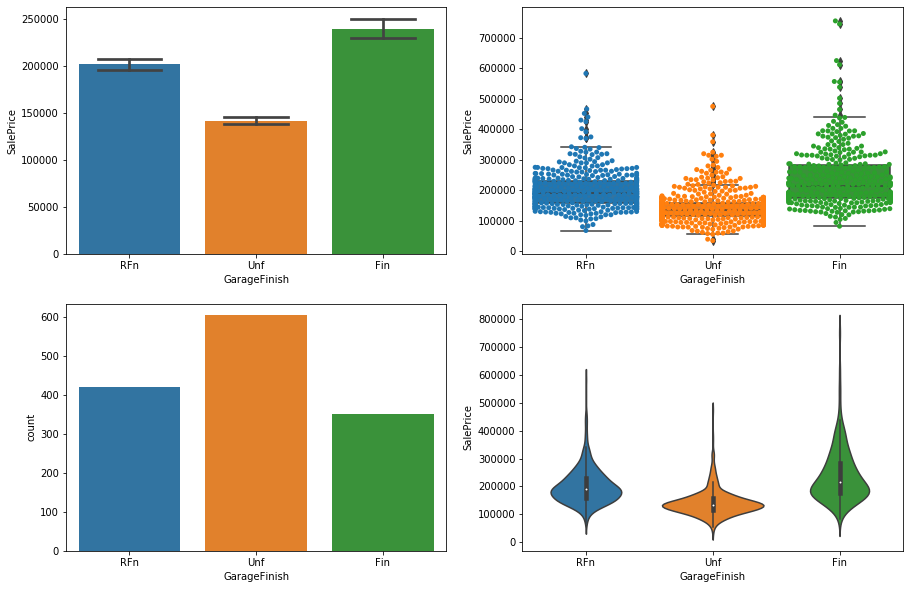

                       mean           std  median  count
GarageFinish                                            
Fin           240052.690341  96960.593232  215000    352
RFn           202068.869668  63536.222518  190000    422
Unf           142156.423140  46498.528211  135000    605
After minimum count fixing, the final graph is:


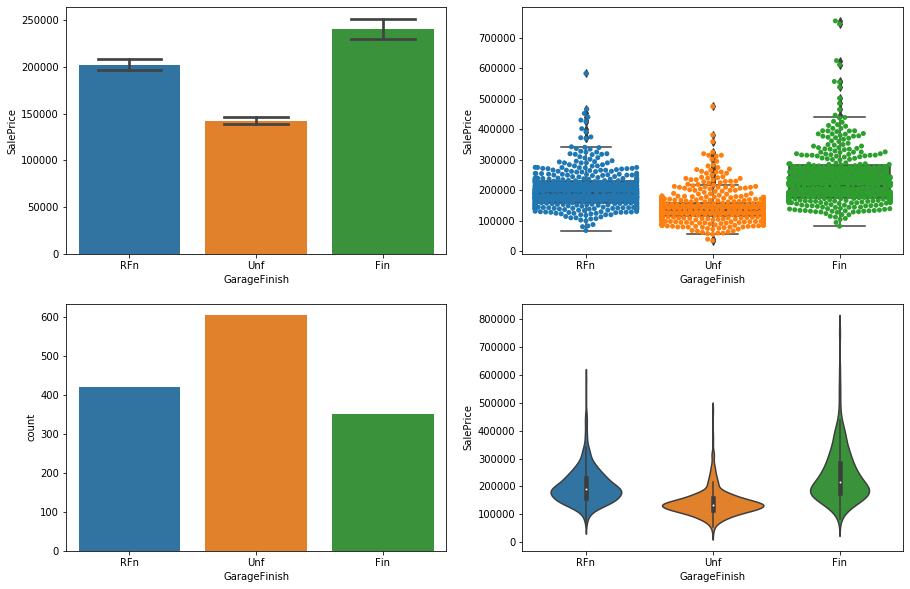

                       mean           std  median  count
GarageFinish                                            
Fin           240052.690341  96960.593232  215000    352
RFn           202068.869668  63536.222518  190000    422
Unf           142156.423140  46498.528211  135000    605
After minimum count fixing, the final graph is:


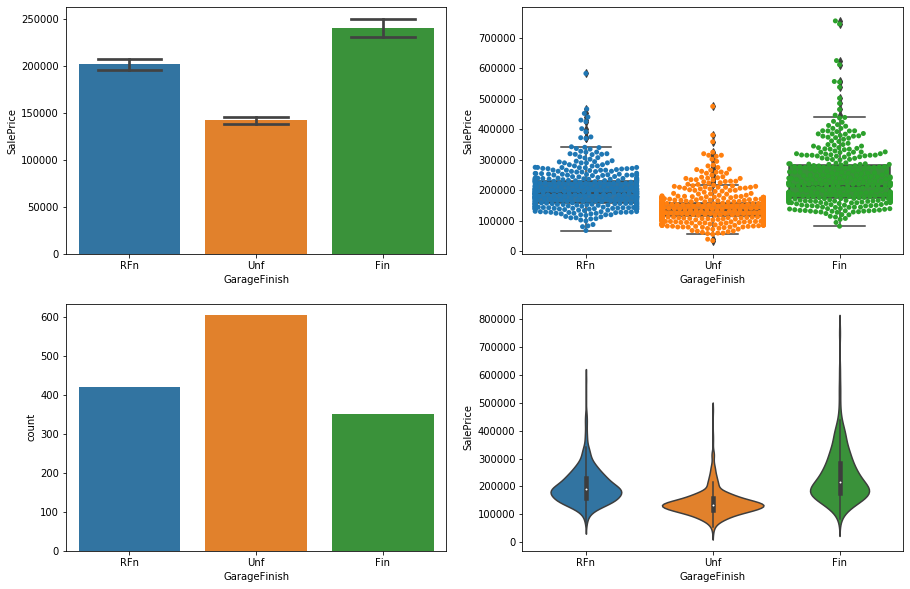

                       mean           std  median  count
GarageFinish                                            
Fin           240052.690341  96960.593232  215000    352
RFn           202068.869668  63536.222518  190000    422
Unf           142156.423140  46498.528211  135000    605


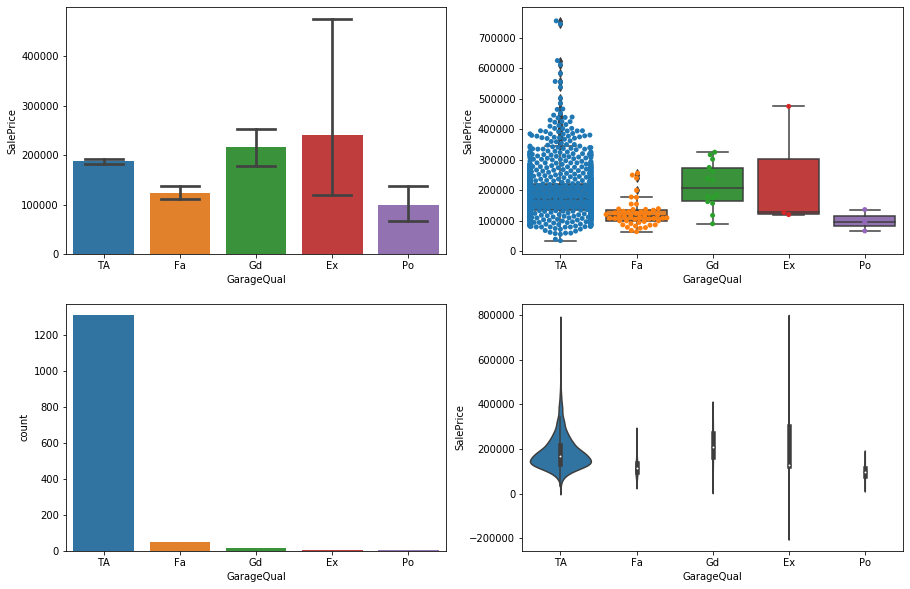

                     mean            std  median  count
GarageQual                                             
Ex          241000.000000  202680.166765  127500      3
Gd          215860.714286   74126.739021  209115     14
TA          187489.836003   78774.948567  170000   1311
Fa          123573.354167   42971.440985  115000     48
Po          100166.666667   35143.752408   96500      3
After minimum count fixing, the final graph is:


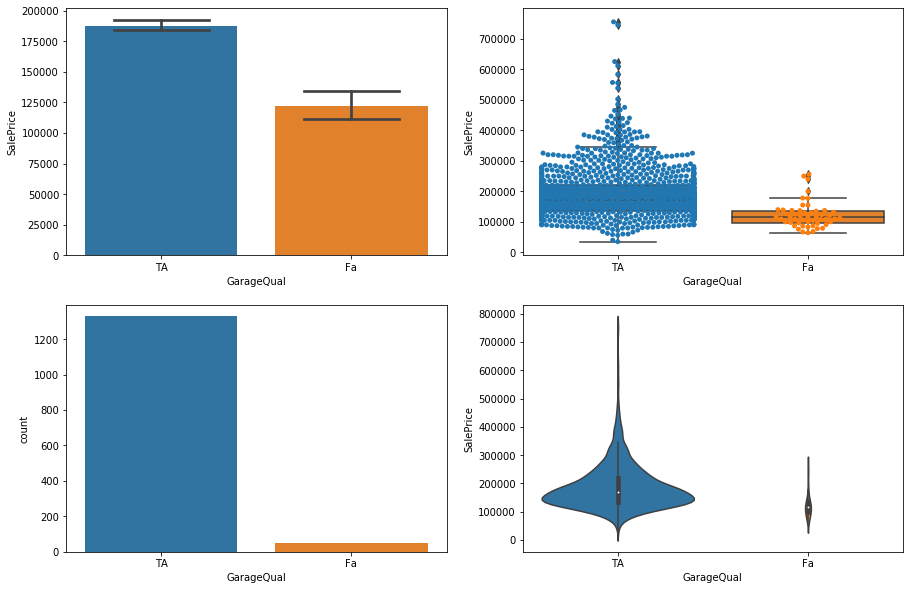

                     mean           std  median  count
GarageQual                                            
TA          187909.807982  79098.205906  170000   1328
Fa          122196.490196  42615.655585  115000     51
After minimum count fixing, the final graph is:


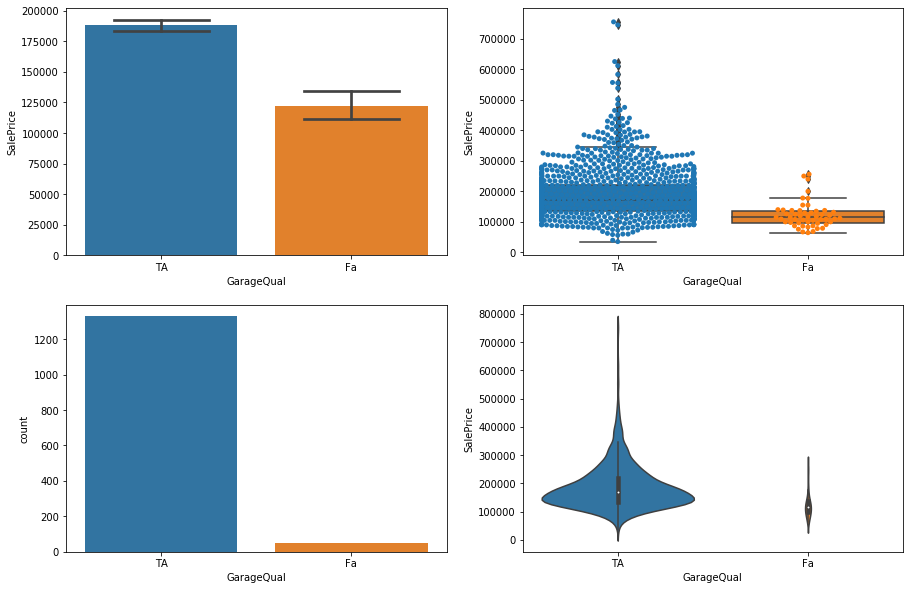

                     mean           std  median  count
GarageQual                                            
TA          187909.807982  79098.205906  170000   1328
Fa          122196.490196  42615.655585  115000     51


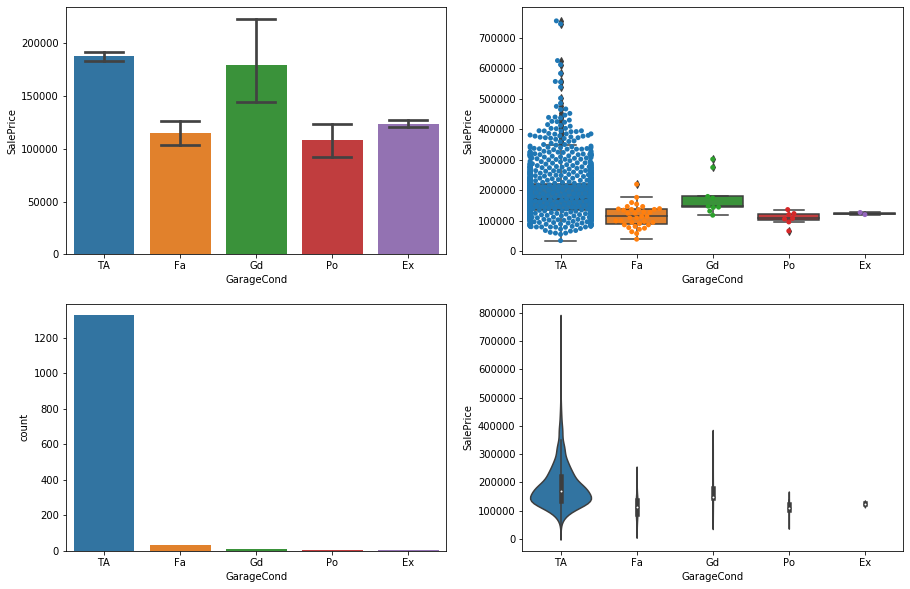

                     mean           std  median  count
GarageCond                                            
TA          187885.735294  79103.322640  170000   1326
Gd          179930.000000  64769.318354  148000      9
Ex          124000.000000   4949.747468  124000      2
Fa          114654.028571  36420.903588  114504     35
Po          108500.000000  22662.377045  108000      7
After minimum count fixing, the final graph is:


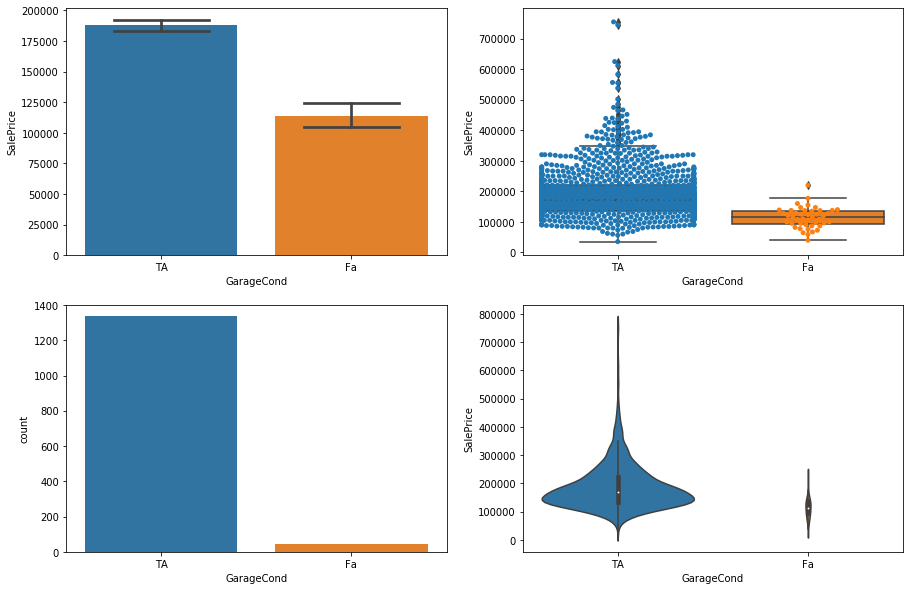

                     mean           std  median  count
GarageCond                                            
TA          187832.101124  78998.111965  170000   1335
Fa          114099.795455  33630.232309  114752     44
After minimum count fixing, the final graph is:


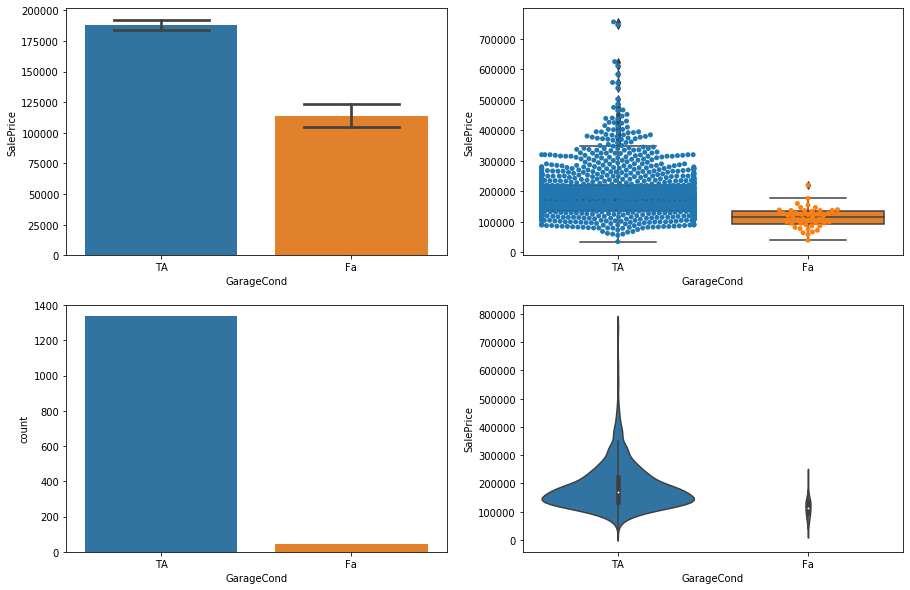

                     mean           std  median  count
GarageCond                                            
TA          187832.101124  78998.111965  170000   1335
Fa          114099.795455  33630.232309  114752     44


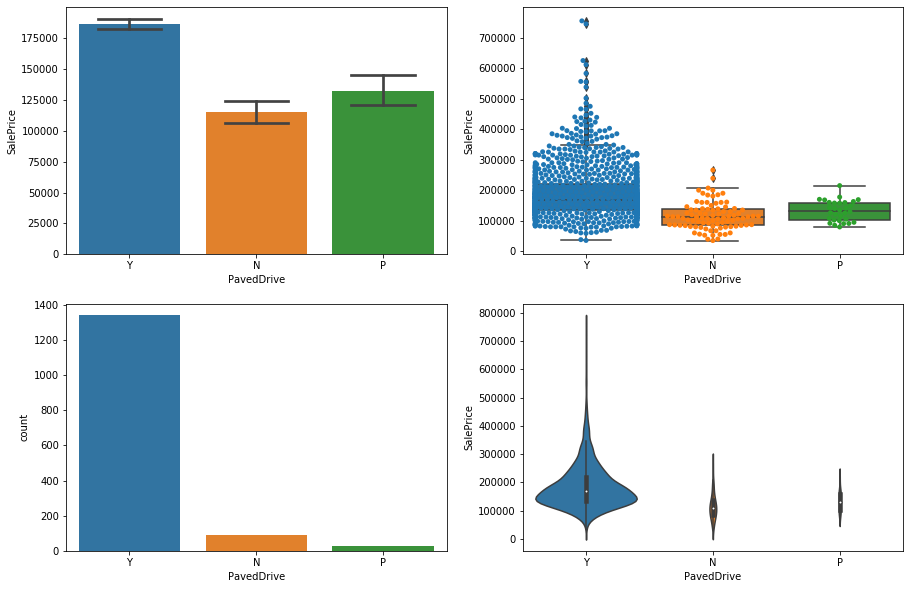

                     mean           std  median  count
PavedDrive                                            
Y           186433.973881  79665.503047  168500   1340
P           132330.000000  33503.030228  132250     30
N           115039.122222  44352.523309  111000     90
After minimum count fixing, the final graph is:


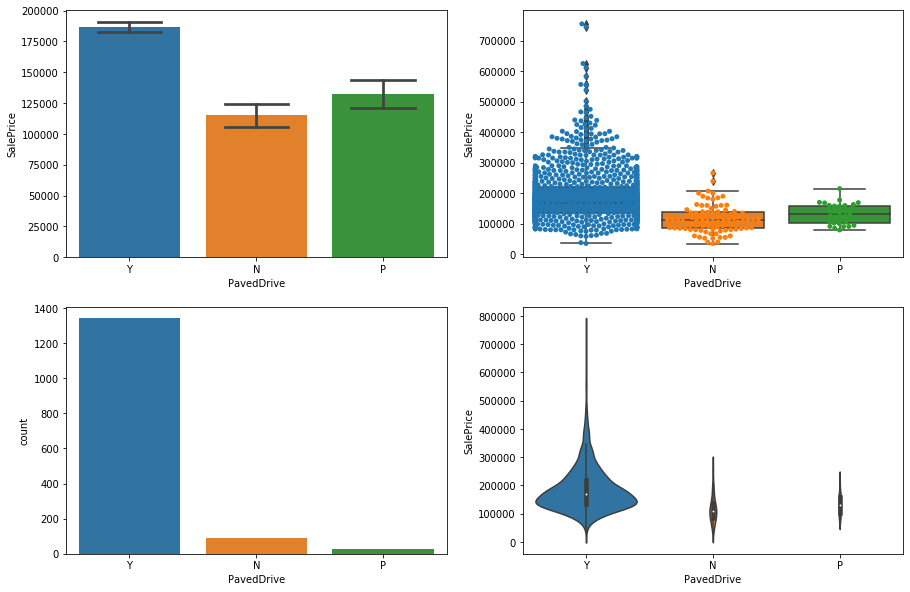

                     mean           std  median  count
PavedDrive                                            
Y           186433.973881  79665.503047  168500   1340
P           132330.000000  33503.030228  132250     30
N           115039.122222  44352.523309  111000     90
After minimum count fixing, the final graph is:


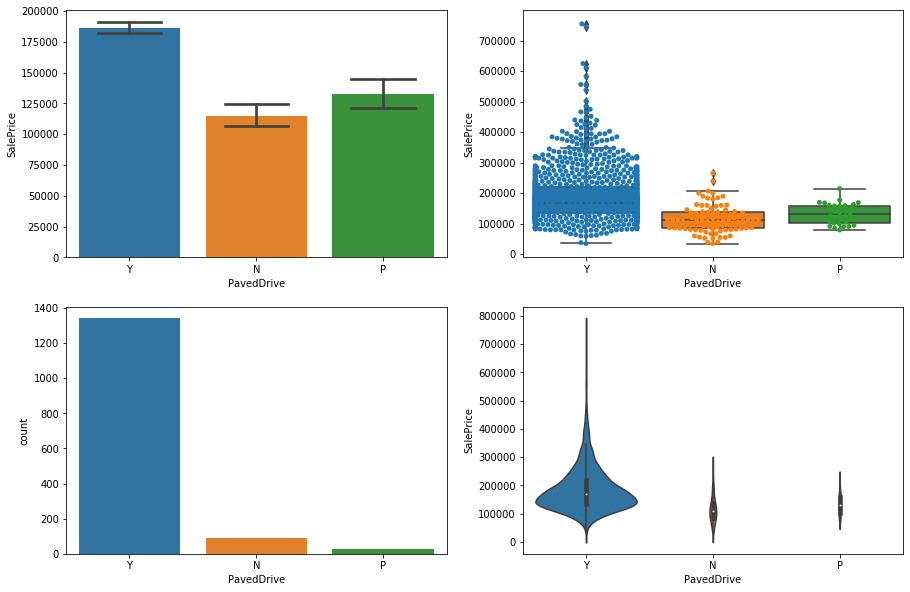

                     mean           std  median  count
PavedDrive                                            
Y           186433.973881  79665.503047  168500   1340
P           132330.000000  33503.030228  132250     30
N           115039.122222  44352.523309  111000     90
Due to absense ofnan in Train DataFrame, it was replaced with Con


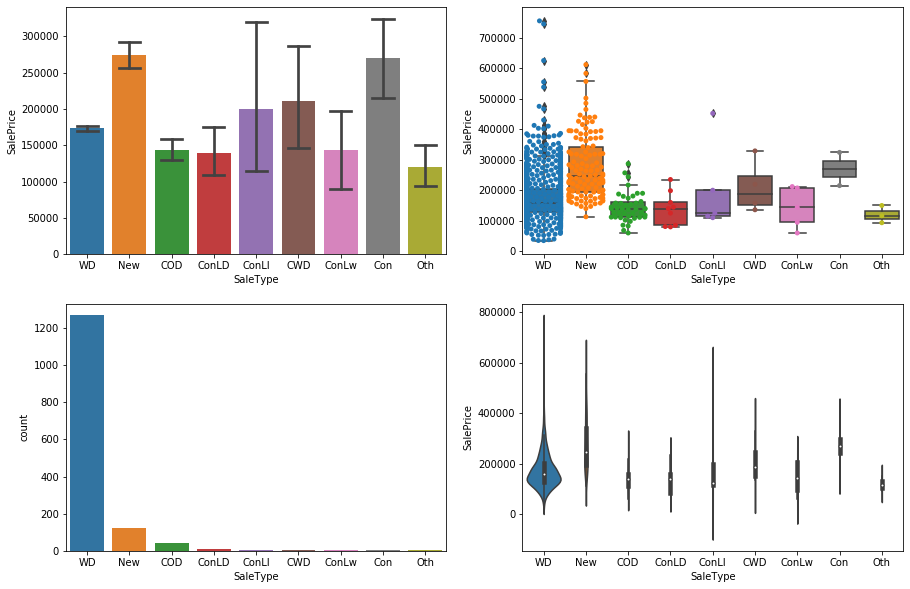

                   mean            std  median  count
SaleType                                             
New       274945.418033  103239.582158  247453    122
Con       269600.000000   76933.217793  269600      2
CWD       210600.000000   86421.486526  188750      4
ConLI     200390.000000  145282.519595  125000      5
WD        173401.836622   71129.686245  158000   1267
COD       143973.255814   47098.294314  139000     43
ConLw     143700.000000   67291.901444  144000      5
ConLD     138780.888889   53876.560647  140000      9
Oth       119850.000000   28441.035495  116050      3
After minimum count fixing, the final graph is:


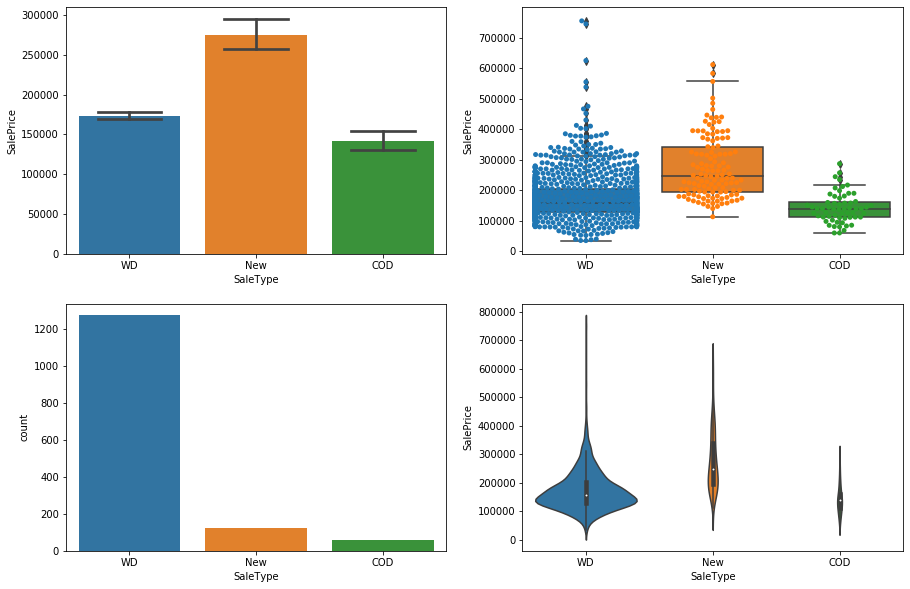

                   mean            std  median  count
SaleType                                             
New       274859.201613  102633.720647  247453    124
WD        173624.198276   71516.836557  158000   1276
COD       141965.466667   48339.454327  139000     60
After minimum count fixing, the final graph is:


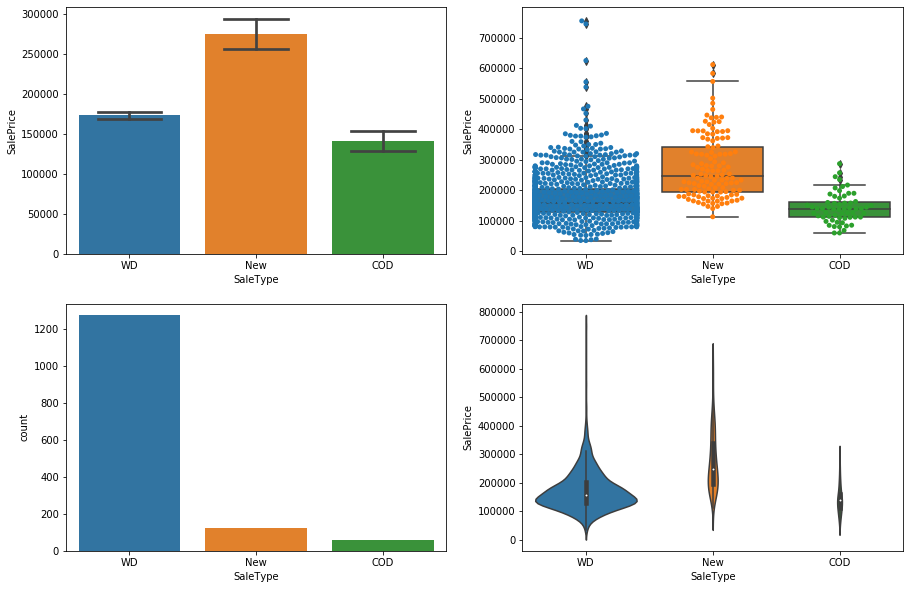

                   mean            std  median  count
SaleType                                             
New       274859.201613  102633.720647  247453    124
WD        173624.198276   71516.836557  158000   1276
COD       141965.466667   48339.454327  139000     60


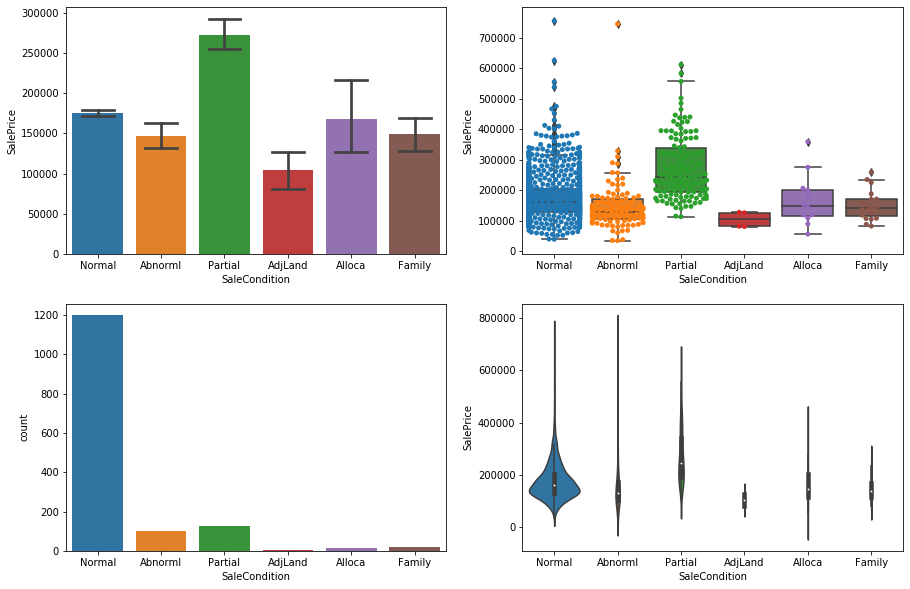

                        mean            std  median  count
SaleCondition                                             
Partial        272291.752000  103696.404119  244600    125
Normal         175202.219533   69713.636280  160000   1198
Alloca         167377.416667   84460.527502  148145     12
Family         149600.000000   47820.002421  140500     20
Abnorml        146526.623762   82796.213395  130000    101
AdjLand        104125.000000   26135.464411  104000      4
After minimum count fixing, the final graph is:


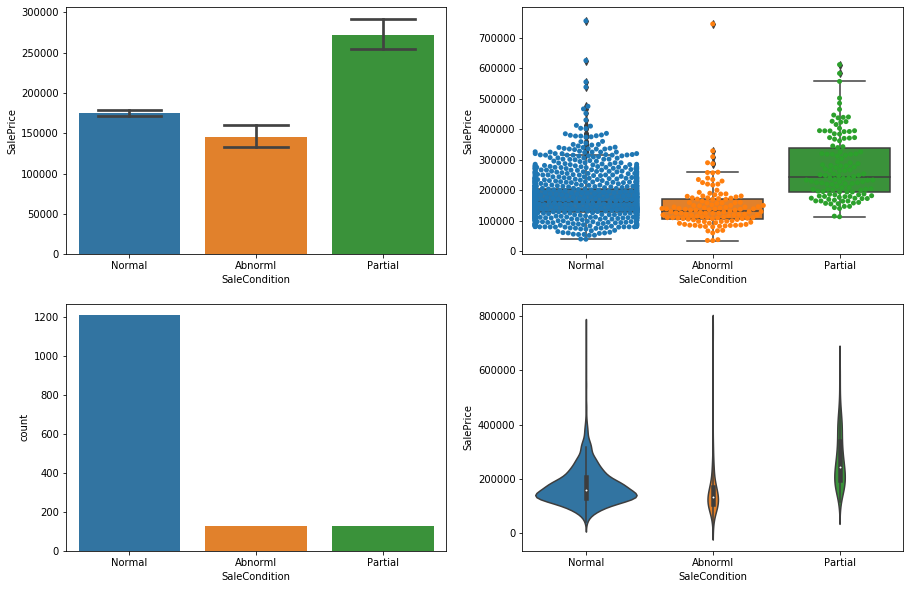

                        mean            std  median  count
SaleCondition                                             
Partial        272291.752000  103696.404119  244600    125
Normal         175124.618182   69837.375543  160000   1210
Abnorml        145661.512000   77162.675567  132000    125
After minimum count fixing, the final graph is:


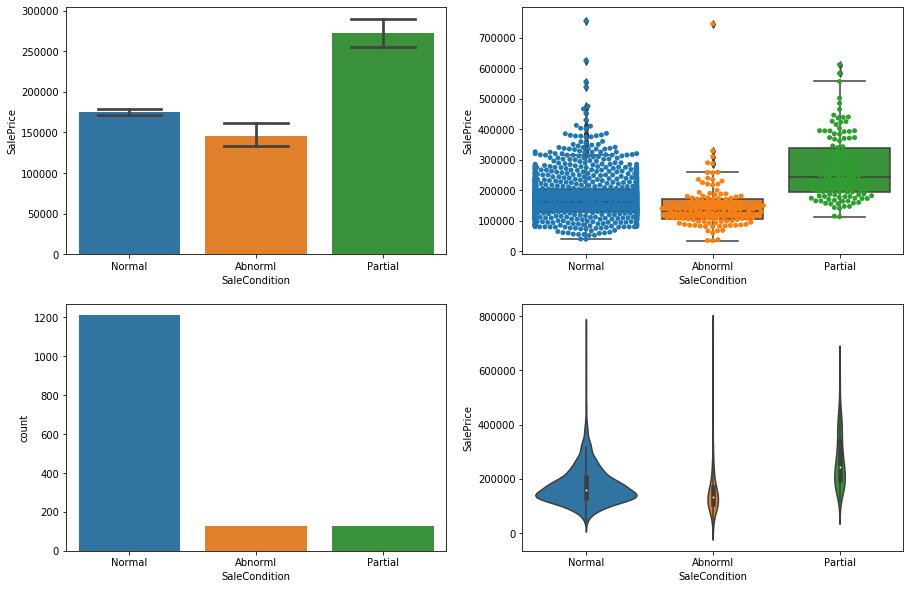

                        mean            std  median  count
SaleCondition                                             
Partial        272291.752000  103696.404119  244600    125
Normal         175124.618182   69837.375543  160000   1210
Abnorml        145661.512000   77162.675567  132000    125


In [38]:
for Variable in CatCol:
    rem_excess_cat_el_w_diag(Variable)

rem_excess_cat_el_w_O_diag(Variable)

print('After minimum count fixing, the final graph is:')
Variable_df=categorical_study_graph(Variable)

In [39]:
print(NomCol)

['GarageCond', 'GarageQual', 'KitchenQual', 'HeatingQC', 'BsmtExposure', 'BsmtCond', 'BsmtQual', 'ExterQual']


In [40]:
CatCol=[i for i in CatCol if i not in NomCol]

In [44]:
bin_map  = {'TA':2,'Gd':3, 'Fa':1,'Ex':4,'Po':1,'None':0,'Y':1,'N':0,'Reg':3,'IR1':2,'IR2':1,'IR3':0,"None" : 0,
            "No" : 2, "Mn" : 2, "Av": 3,"Gd" : 4,"Unf" : 1, "LwQ": 2, "Rec" : 3,"BLQ" : 4, "ALQ" : 5, "GLQ" : 6
            }
for i in NomCol:
    Merged[i] = Merged[i].map(bin_map)
    Train[i] = Train[i].map(bin_map)
    Test[i] = Test[i].map(bin_map)

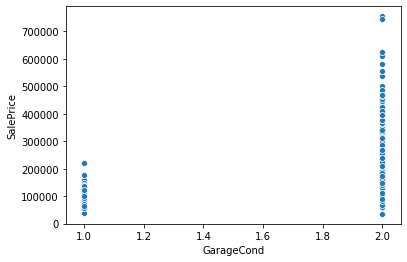

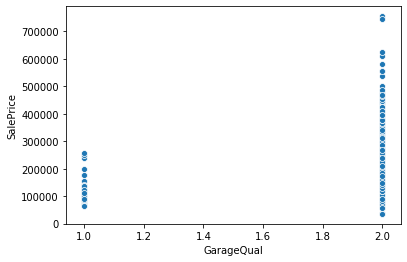

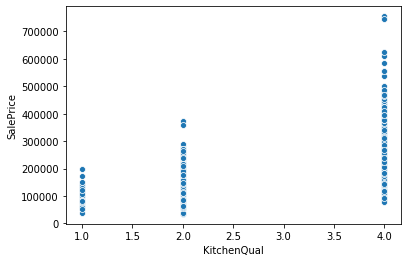

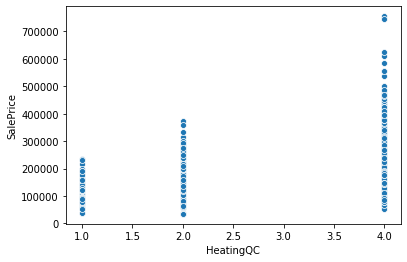

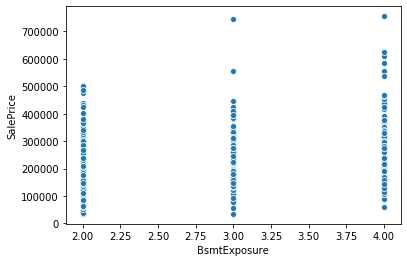

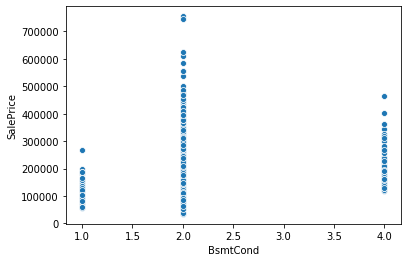

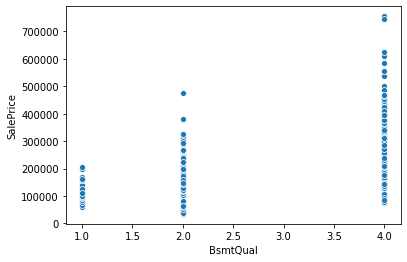

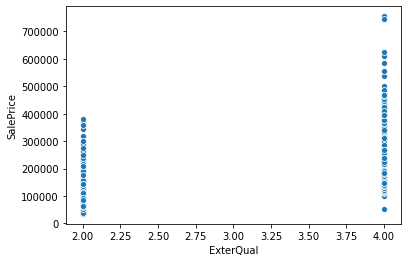

In [47]:
for i in NomCol:
    sns.scatterplot(x=i,y='SalePrice',data=Train)
    plt.show()

In [48]:
ConCol=ConCol+NomCol

In [52]:
for i in ConCol:
    Filler=Train[i].median()
    Merged[i]=Merged[i].fillna(Filler)
    Train[i]=Train[i].fillna(Filler)
    Test[i]=Test[i].fillna(Filler)

In [63]:
for i in CatCol:
    Filler=Train[i].mode().iloc[0]
    Merged[i]=Merged[i].fillna(Filler)
    Train[i]=Train[i].fillna(Filler)
    Test[i]=Test[i].fillna(Filler)

In [68]:
print(Merged[CatCol].isna().sum().sum())
print(Merged[ConCol].isna().sum().sum())

0
0


In [79]:
sc1=StandardScaler()
Train=Merged.iloc[:1460]
Test=Merged.iloc[1460:]

In [77]:
TrainContinuous = sc1.fit_transform(Train[ConCol])
TestContinuous = sc1.transform(Test[ConCol])


One_Hot = OneHotEncoder().fit(Train[CatCol])
TrainCategorical = One_Hot.transform(Train[CatCol]).toarray()
TestCategorical = One_Hot.transform(Test[CatCol]).toarray()
TrainX = np.hstack((TrainCategorical, TrainContinuous))
TestX = np.hstack((TestCategorical, TestContinuous))
y=Train_Copy['SalePrice'].values
print(TrainX.shape)

In [121]:
gradient_boosting_regressor= GradientBoostingRegressor(n_estimators=1000, learning_rate=0.05,
                                   max_depth=4, max_features='sqrt',
                                   min_samples_leaf=15, min_samples_split=10, 
                                   loss='huber', random_state = 10)

In [86]:
y=Train_Copy['SalePrice'].values

In [122]:
reg=gradient_boosting_regressor.fit(TrainX, y)
Test['SalePrice']=reg.predict(TestX)
prediction_df=Test[['SalePrice']]
prediction_df.to_csv('Downloads/Datascience/KaggleStuff/Housing_prediction.csv')

C:\Users\Dara\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [118]:
prediction_df.head()

,SalePrice
Id,
1461,124583.444704
1462,159372.189222
1463,187719.267550
1464,195160.041527
1465,186667.095436
